In [1]:

# imports
import os
import sys
import types
import json
import base64

# figure size/format
fig_width = 6
fig_height = 5
fig_format = 'retina'
fig_dpi = 96
interactivity = ''
is_shiny = False
is_dashboard = False
plotly_connected = True

# matplotlib defaults / format
try:
  import matplotlib.pyplot as plt
  plt.rcParams['figure.figsize'] = (fig_width, fig_height)
  plt.rcParams['figure.dpi'] = fig_dpi
  plt.rcParams['savefig.dpi'] = "figure"
  from IPython.display import set_matplotlib_formats
  set_matplotlib_formats(fig_format)
except Exception:
  pass

# plotly use connected mode
try:
  import plotly.io as pio
  if plotly_connected:
    pio.renderers.default = "notebook_connected"
  else:
    pio.renderers.default = "notebook"
  for template in pio.templates.keys():
    pio.templates[template].layout.margin = dict(t=30,r=0,b=0,l=0)
except Exception:
  pass

# disable itables paging for dashboards
if is_dashboard:
  try:
    from itables import options
    options.dom = 'fiBrtlp'
    options.maxBytes = 1024 * 1024
    options.language = dict(info = "Showing _TOTAL_ entries")
    options.classes = "display nowrap compact"
    options.paging = False
    options.searching = True
    options.ordering = True
    options.info = True
    options.lengthChange = False
    options.autoWidth = False
    options.responsive = True
    options.keys = True
    options.buttons = []
  except Exception:
    pass
  
  try:
    import altair as alt
    # By default, dashboards will have container sized
    # vega visualizations which allows them to flow reasonably
    theme_sentinel = '_quarto-dashboard-internal'
    def make_theme(name):
        nonTheme = alt.themes._plugins[name]    
        def patch_theme(*args, **kwargs):
            existingTheme = nonTheme()
            if 'height' not in existingTheme:
              existingTheme['height'] = 'container'
            if 'width' not in existingTheme:
              existingTheme['width'] = 'container'

            if 'config' not in existingTheme:
              existingTheme['config'] = dict()
            
            # Configure the default font sizes
            title_font_size = 15
            header_font_size = 13
            axis_font_size = 12
            legend_font_size = 12
            mark_font_size = 12
            tooltip = False

            config = existingTheme['config']

            # The Axis
            if 'axis' not in config:
              config['axis'] = dict()
            axis = config['axis']
            if 'labelFontSize' not in axis:
              axis['labelFontSize'] = axis_font_size
            if 'titleFontSize' not in axis:
              axis['titleFontSize'] = axis_font_size  

            # The legend
            if 'legend' not in config:
              config['legend'] = dict()
            legend = config['legend']
            if 'labelFontSize' not in legend:
              legend['labelFontSize'] = legend_font_size
            if 'titleFontSize' not in legend:
              legend['titleFontSize'] = legend_font_size  

            # The header
            if 'header' not in config:
              config['header'] = dict()
            header = config['header']
            if 'labelFontSize' not in header:
              header['labelFontSize'] = header_font_size
            if 'titleFontSize' not in header:
              header['titleFontSize'] = header_font_size    

            # Title
            if 'title' not in config:
              config['title'] = dict()
            title = config['title']
            if 'fontSize' not in title:
              title['fontSize'] = title_font_size

            # Marks
            if 'mark' not in config:
              config['mark'] = dict()
            mark = config['mark']
            if 'fontSize' not in mark:
              mark['fontSize'] = mark_font_size

            # Mark tooltips
            if tooltip and 'tooltip' not in mark:
              mark['tooltip'] = dict(content="encoding")

            return existingTheme
            
        return patch_theme

    # We can only do this once per session
    if theme_sentinel not in alt.themes.names():
      for name in alt.themes.names():
        alt.themes.register(name, make_theme(name))
      
      # register a sentinel theme so we only do this once
      alt.themes.register(theme_sentinel, make_theme('default'))
      alt.themes.enable('default')

  except Exception:
    pass

# enable pandas latex repr when targeting pdfs
try:
  import pandas as pd
  if fig_format == 'pdf':
    pd.set_option('display.latex.repr', True)
except Exception:
  pass

# interactivity
if interactivity:
  from IPython.core.interactiveshell import InteractiveShell
  InteractiveShell.ast_node_interactivity = interactivity

# NOTE: the kernel_deps code is repeated in the cleanup.py file
# (we can't easily share this code b/c of the way it is run).
# If you edit this code also edit the same code in cleanup.py!

# output kernel dependencies
kernel_deps = dict()
for module in list(sys.modules.values()):
  # Some modules play games with sys.modules (e.g. email/__init__.py
  # in the standard library), and occasionally this can cause strange
  # failures in getattr.  Just ignore anything that's not an ordinary
  # module.
  if not isinstance(module, types.ModuleType):
    continue
  path = getattr(module, "__file__", None)
  if not path:
    continue
  if path.endswith(".pyc") or path.endswith(".pyo"):
    path = path[:-1]
  if not os.path.exists(path):
    continue
  kernel_deps[path] = os.stat(path).st_mtime
print(json.dumps(kernel_deps))

# set run_path if requested
run_path = 'QzpcVXNlcnNcbWFwb2UwMDRcRGVza3RvcFxBcmJlaXRzb3JkbmVyIE1haWsgUG9ldHpzY2hcQkNEXEJhdXN0ZWluZVxBbndlbmR1bmdzYmF1c3RlaW5lXGEtZW5lcmdpZWRhdGVuYXVzd2VydHVuZw=='
if run_path:
  # hex-decode the path
  run_path = base64.b64decode(run_path.encode("utf-8")).decode("utf-8")
  os.chdir(run_path)

# reset state
%reset

# shiny
# Checking for shiny by using False directly because we're after the %reset. We don't want
# to set a variable that stays in global scope.
if False:
  try:
    import htmltools as _htmltools
    import ast as _ast

    _htmltools.html_dependency_render_mode = "json"

    # This decorator will be added to all function definitions
    def _display_if_has_repr_html(x):
      try:
        # IPython 7.14 preferred import
        from IPython.display import display, HTML
      except:
        from IPython.core.display import display, HTML

      if hasattr(x, '_repr_html_'):
        display(HTML(x._repr_html_()))
      return x

    # ideally we would undo the call to ast_transformers.append
    # at the end of this block whenver an error occurs, we do 
    # this for now as it will only be a problem if the user 
    # switches from shiny to not-shiny mode (and even then likely
    # won't matter)
    import builtins
    builtins._display_if_has_repr_html = _display_if_has_repr_html

    class _FunctionDefReprHtml(_ast.NodeTransformer):
      def visit_FunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

      def visit_AsyncFunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

    ip = get_ipython()
    ip.ast_transformers.append(_FunctionDefReprHtml())

  except:
    pass

def ojs_define(**kwargs):
  import json
  try:
    # IPython 7.14 preferred import
    from IPython.display import display, HTML
  except:
    from IPython.core.display import display, HTML

  # do some minor magic for convenience when handling pandas
  # dataframes
  def convert(v):
    try:
      import pandas as pd
    except ModuleNotFoundError: # don't do the magic when pandas is not available
      return v
    if type(v) == pd.Series:
      v = pd.DataFrame(v)
    if type(v) == pd.DataFrame:
      j = json.loads(v.T.to_json(orient='split'))
      return dict((k,v) for (k,v) in zip(j["index"], j["data"]))
    else:
      return v

  v = dict(contents=list(dict(name=key, value=convert(value)) for (key, value) in kwargs.items()))
  display(HTML('<script type="ojs-define">' + json.dumps(v) + '</script>'), metadata=dict(ojs_define = True))
globals()["ojs_define"] = ojs_define
globals()["__spec__"] = None

C:\Users\mapoe004\AppData\Local\Temp\ipykernel_21708\663245606.py:25: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats(fig_format)


{"C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\importlib\\_bootstrap.py": 1701984014.0, "C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\importlib\\_bootstrap_external.py": 1701984014.0, "C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\zipimport.py": 1701984016.0, "C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\codecs.py": 1701984014.0, "C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\encodings\\aliases.py": 1701984014.0, "C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\encodings\\__init__.py": 1701984014.0, "C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\encodings\\utf_8.py": 1701984014.0, "C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\encodings\\cp1252.py": 1701984014.0, "C:\\Users\\mapoe004\\AppData\\Local\\Programs\\Python\\Python312\\Lib\\abc.py": 1701984014.0, "C:\\Users\\mapoe004\\AppData\\L

In [2]:
#| output: false

import pandas as pd
pd.set_option("display.precision", 2) # Anzahl Nachkommastellen
import numpy as np
import matplotlib.pyplot as plt

installierte_leistung0 = pd.read_csv(filepath_or_buffer = \
"skript/01-daten/Installierte_Erzeugungsleistung_202301010000_202401010000_Jahr.csv", \
sep = ";", thousands = ".", decimal = ",", \
parse_dates = [0, 1], date_format = "%d.%m.%Y")

erzeugung0 = pd.read_csv(filepath_or_buffer = \
"skript/01-daten/Realisierte_Erzeugung_202301010000_202401010000_Viertelstunde.csv", \
sep = ";", thousands = ".", decimal = ",", \
parse_dates = [0, 1], date_format = "%d.%m.%Y %H:%M")

verbrauch0 = pd.read_csv(filepath_or_buffer = \
"skript/01-daten/Realisierter_Stromverbrauch_202301010000_202401010000_Viertelstunde.csv", \
sep = ";", thousands = ".", decimal = ",", \
parse_dates = [0, 1], date_format = "%d.%m.%Y %H:%M")

In [3]:
#| include: true

print(f"Spalten:\n{erzeugung0.dtypes}")

Spalten:
Datum von                                            datetime64[ns]
Datum bis                                            datetime64[ns]
Biomasse [MWh] Originalauflösungen                          float64
Wasserkraft [MWh] Originalauflösungen                       float64
Wind Offshore [MWh] Originalauflösungen                     float64
Wind Onshore [MWh] Originalauflösungen                      float64
Photovoltaik [MWh] Originalauflösungen                      float64
Sonstige Erneuerbare [MWh] Originalauflösungen              float64
Kernenergie [MWh] Originalauflösungen                       float64
Braunkohle [MWh] Originalauflösungen                        float64
Steinkohle [MWh] Originalauflösungen                        float64
Erdgas [MWh] Originalauflösungen                            float64
Pumpspeicher [MWh] Originalauflösungen                      float64
Sonstige Konventionelle [MWh] Originalauflösungen           float64
dtype: object


In [4]:
#| include: true

# Zeichenkette " Originalauflösungen" entfernen
installierte_leistung0.columns = installierte_leistung0.columns.str.replace(pat = " Originalauflösungen", repl = "")

erzeugung0.columns = erzeugung0.columns.str.replace(pat = " Originalauflösungen", repl = "")
print(f"Spalten:\n{erzeugung0.dtypes}")

verbrauch0.columns = verbrauch0.columns.str.replace(pat = " Originalauflösungen", repl = "")

Spalten:
Datum von                        datetime64[ns]
Datum bis                        datetime64[ns]
Biomasse [MWh]                          float64
Wasserkraft [MWh]                       float64
Wind Offshore [MWh]                     float64
Wind Onshore [MWh]                      float64
Photovoltaik [MWh]                      float64
Sonstige Erneuerbare [MWh]              float64
Kernenergie [MWh]                       float64
Braunkohle [MWh]                        float64
Steinkohle [MWh]                        float64
Erdgas [MWh]                            float64
Pumpspeicher [MWh]                      float64
Sonstige Konventionelle [MWh]           float64
dtype: object


In [5]:
#| echo: true

# der DataFrame installierte_leistung0 hat nur 1 Zeile
installierte_leistung0

,Datum von,Datum bis,Biomasse [MW],Wasserkraft [MW],Wind Offshore [MW],Wind Onshore [MW],Photovoltaik [MW],Sonstige Erneuerbare [MW],Kernenergie [MW],Braunkohle [MW],Steinkohle [MW],Erdgas [MW],Pumpspeicher [MW],Sonstige Konventionelle [MW]
0,2023-01-01,2024-01-01,8467.0,5049.0,8129.0,57590.0,63066.0,440.0,4056.0,17692.0,18127.0,31808.0,9379.0,8958.0


In [6]:
#| echo: true

pd.concat([erzeugung0.head(2), \
erzeugung0.iloc[len(erzeugung0)//2:(len(erzeugung0)//2+2)], \
erzeugung0.tail(2)])

,Datum von,Datum bis,Biomasse [MWh],Wasserkraft [MWh],Wind Offshore [MWh],Wind Onshore [MWh],Photovoltaik [MWh],Sonstige Erneuerbare [MWh],Kernenergie [MWh],Braunkohle [MWh],Steinkohle [MWh],Erdgas [MWh],Pumpspeicher [MWh],Sonstige Konventionelle [MWh]
0,2023-01-01 00:00:00,2023-01-01 00:15:00,1094.25,320.0,684.25,7145.75,0.50,32.25,615.25,962.75,517.00,429.75,13.50,307.25
1,2023-01-01 00:15:00,2023-01-01 00:30:00,1091.25,317.5,743.50,7158.25,0.25,32.25,614.75,963.25,518.00,429.50,9.75,307.25
17520,2023-07-02 13:00:00,2023-07-02 13:15:00,955.25,317.5,736.00,4228.50,6832.75,25.25,0.00,795.00,216.75,546.00,0.75,264.75
17521,2023-07-02 13:15:00,2023-07-02 13:30:00,956.75,321.5,693.75,3885.25,6961.25,25.25,0.00,791.00,215.00,545.00,0.00,266.00
35038,2023-12-31 23:30:00,2023-12-31 23:45:00,1053.25,412.5,1479.25,7544.25,0.50,24.00,0.00,845.25,444.50,683.00,122.75,348.50
35039,2023-12-31 23:45:00,2024-01-01 00:00:00,1051.50,404.0,1469.00,7480.50,0.50,24.00,0.00,840.75,442.25,679.00,58.25,348.00


In [7]:
#| echo: true

pd.concat([verbrauch0.head(2), \
verbrauch0.iloc[len(verbrauch0)//2:(len(verbrauch0)//2+2)], \
verbrauch0.tail(2)])

,Datum von,Datum bis,Gesamt (Netzlast) [MWh],Residuallast [MWh],Pumpspeicher [MWh]
0,2023-01-01 00:00:00,2023-01-01 00:15:00,9720.75,1890.25,424.75
1,2023-01-01 00:15:00,2023-01-01 00:30:00,9641.25,1739.25,443.50
17520,2023-07-02 13:00:00,2023-07-02 13:15:00,11564.00,-233.25,1147.75
17521,2023-07-02 13:15:00,2023-07-02 13:30:00,11536.25,-4.00,1223.25
35038,2023-12-31 23:30:00,2023-12-31 23:45:00,10495.75,1471.75,470.00
35039,2023-12-31 23:45:00,2024-01-01 00:00:00,10289.25,1339.25,528.00


In [8]:
#| echo: true

# exclude columns with datetime
print("Stromverbrauch in Millionen MWh:\n", \
verbrauch0.sum(numeric_only = True) // (1000 * 1000), sep = "")

print("\nStromerzeugung in Millionen MWh", \
erzeugung0.sum(numeric_only = True).sum() // (1000 * 1000))

Stromverbrauch in Millionen MWh:
Gesamt (Netzlast) [MWh]    458.0
Residuallast [MWh]         260.0
Pumpspeicher [MWh]          14.0
dtype: float64

Stromerzeugung in Millionen MWh 448.0


In [9]:
#| output: false

erzeugung = erzeugung0.copy()
verbrauch = verbrauch0.copy()
installierte_leistung = installierte_leistung0.copy()

In [10]:
#| output: true

print(f"Der DataFrame erzeugung hat {erzeugung.shape[0]} Zeilen und {erzeugung.shape[1]} Spalten.\n")
erzeugung.describe(include = [np.number])

Der DataFrame erzeugung hat 35040 Zeilen und 14 Spalten.



,Biomasse [MWh],Wasserkraft [MWh],Wind Offshore [MWh],Wind Onshore [MWh],Photovoltaik [MWh],Sonstige Erneuerbare [MWh],Kernenergie [MWh],Braunkohle [MWh],Steinkohle [MWh],Erdgas [MWh],Pumpspeicher [MWh],Sonstige Konventionelle [MWh]
count,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00
mean,1079.50,411.50,671.23,3389.91,1590.11,33.32,192.37,2221.58,1134.42,1431.02,318.19,330.81
std,80.16,83.08,457.65,2627.46,2470.00,7.69,305.80,939.80,838.85,682.72,425.94,39.99
min,892.50,249.75,0.00,30.25,0.25,21.75,0.00,634.25,170.25,373.00,0.00,208.50
25%,1017.50,334.00,259.00,1237.25,0.50,25.50,0.00,1396.25,506.75,893.25,38.00,304.50
50%,1066.75,420.50,612.25,2657.00,24.88,32.50,0.00,2111.25,814.75,1300.00,110.75,337.00
75%,1133.25,481.00,1040.56,5017.19,2466.50,39.25,535.00,3000.31,1501.00,1810.75,443.00,356.00
max,1293.25,618.25,1910.00,12039.50,10361.25,51.25,771.00,4121.75,3814.00,4169.25,2399.00,512.50


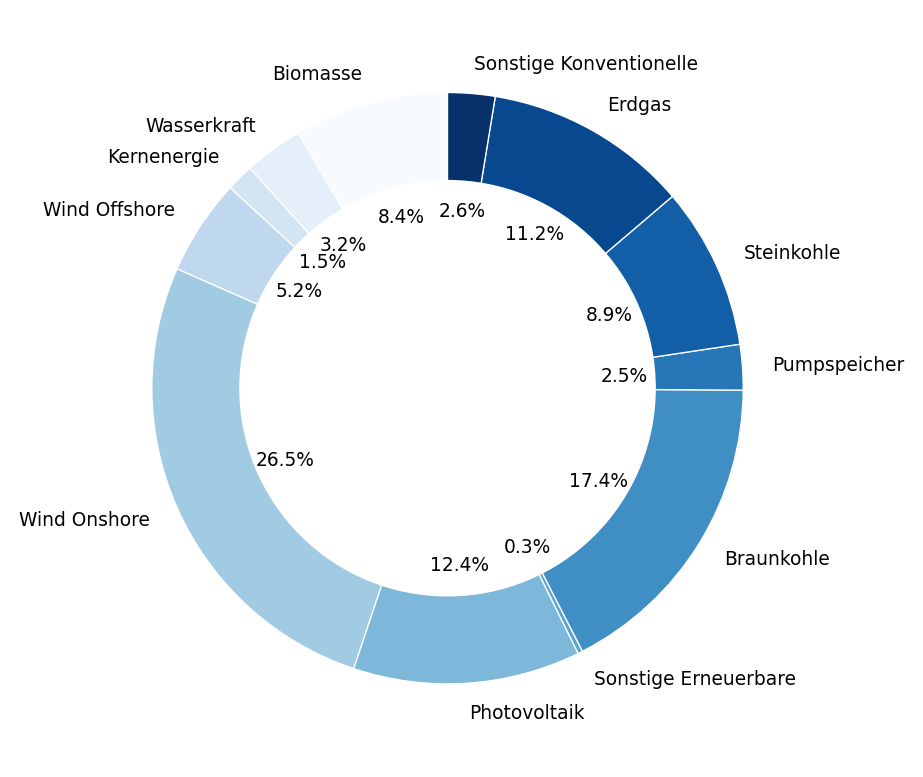

In [11]:
#| echo: false
#| fig-align: center
#| fig-cap: Anteil an der Stromerzeugung
#| fig-alt: In einem Ringdiagramm sind die Anteile verschiedener Erzeugungsarten an der Stromerzeugung dargestellt. Die Kreissegmente sind nicht nach Größe sortiert, sondern so angeordnet, dass sich die Beschriftung der Segmente nicht überlappt.

# plot the pie first try - Sonstige Erneuerbare [MWh] overlaps with Kernenergie [MWh] and Pumpspeicher [MWh]
# erzeugung.sum(numeric_only = True).plot.pie(colormap = "Blues", startangle = 90, rotatelabels = True, explode = explosion)

# rearrange columns, remove " [MWh]"
plotting_data = erzeugung.copy()
column_to_move = plotting_data.pop("Kernenergie [MWh]")
plotting_data.insert(4, "Kernenergie [MWh]", column_to_move)

column_to_move = plotting_data.pop("Pumpspeicher [MWh]")
plotting_data.insert(10, "Pumpspeicher [MWh]", column_to_move)

plotting_data.columns = plotting_data.columns.str.replace(pat = " [MWh]", repl = "")

# plot the pie
ax = plotting_data.sum(numeric_only = True).plot.pie(colormap = "Blues", startangle = 90, rotatelabels = False, autopct='%1.1f%%', pctdistance = 0.6, textprops = dict(size = 7, color = 'black'), wedgeprops = {"linewidth": 0.5, "edgecolor": "white"})

# make a donut
circle = plt.Circle((0, 0), radius = 0.7, color = "white")
ax.add_patch(circle)

plt.show()

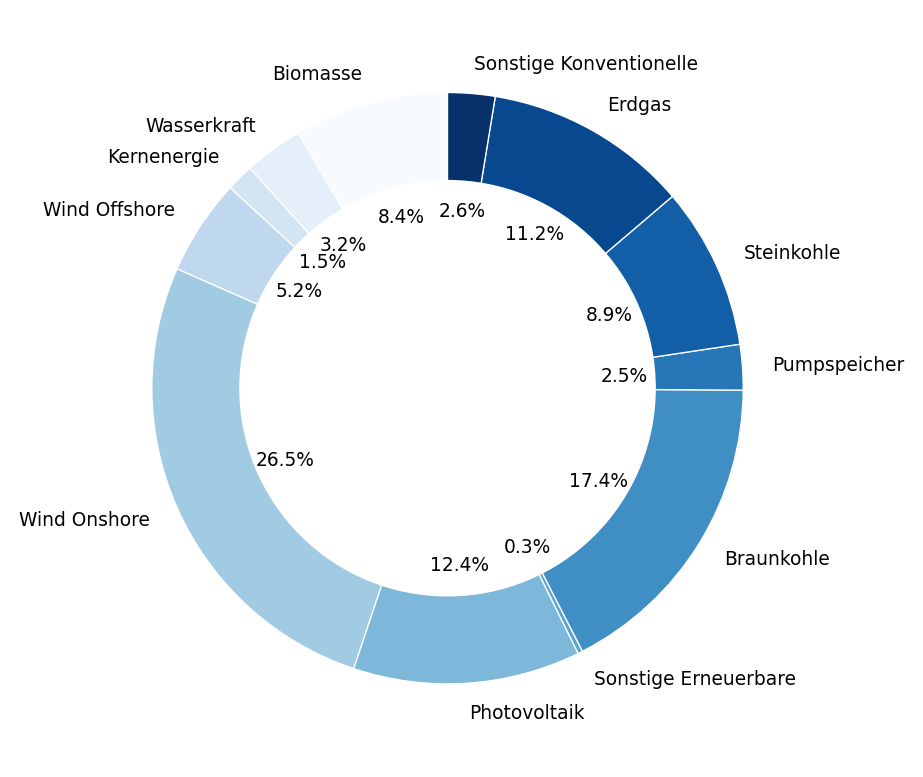

In [12]:
#| output: false

# plot the pie first try - Sonstige Erneuerbare [MWh] overlaps with Kernenergie [MWh] and Pumpspeicher [MWh]
# erzeugung.sum(numeric_only = True).plot.pie(colormap = "Blues", startangle = 90, rotatelabels = True, explode = explosion)

# rearrange columns, remove " [MWh]"
plotting_data = erzeugung.copy()
column_to_move = plotting_data.pop("Kernenergie [MWh]")
plotting_data.insert(4, "Kernenergie [MWh]", column_to_move)

column_to_move = plotting_data.pop("Pumpspeicher [MWh]")
plotting_data.insert(10, "Pumpspeicher [MWh]", column_to_move)

plotting_data.columns = plotting_data.columns.str.replace(pat = " [MWh]", repl = "")

# plot the pie
ax = plotting_data.sum(numeric_only = True).plot.pie(colormap = "Blues", startangle = 90, rotatelabels = False, autopct='%1.1f%%', pctdistance = 0.6, textprops = dict(size = 7, color = 'black'), wedgeprops = {"linewidth": 0.5, "edgecolor": "white"})

# make a donut
circle = plt.Circle((0, 0), radius = 0.7, color = "white")
ax.add_patch(circle)

plt.show()

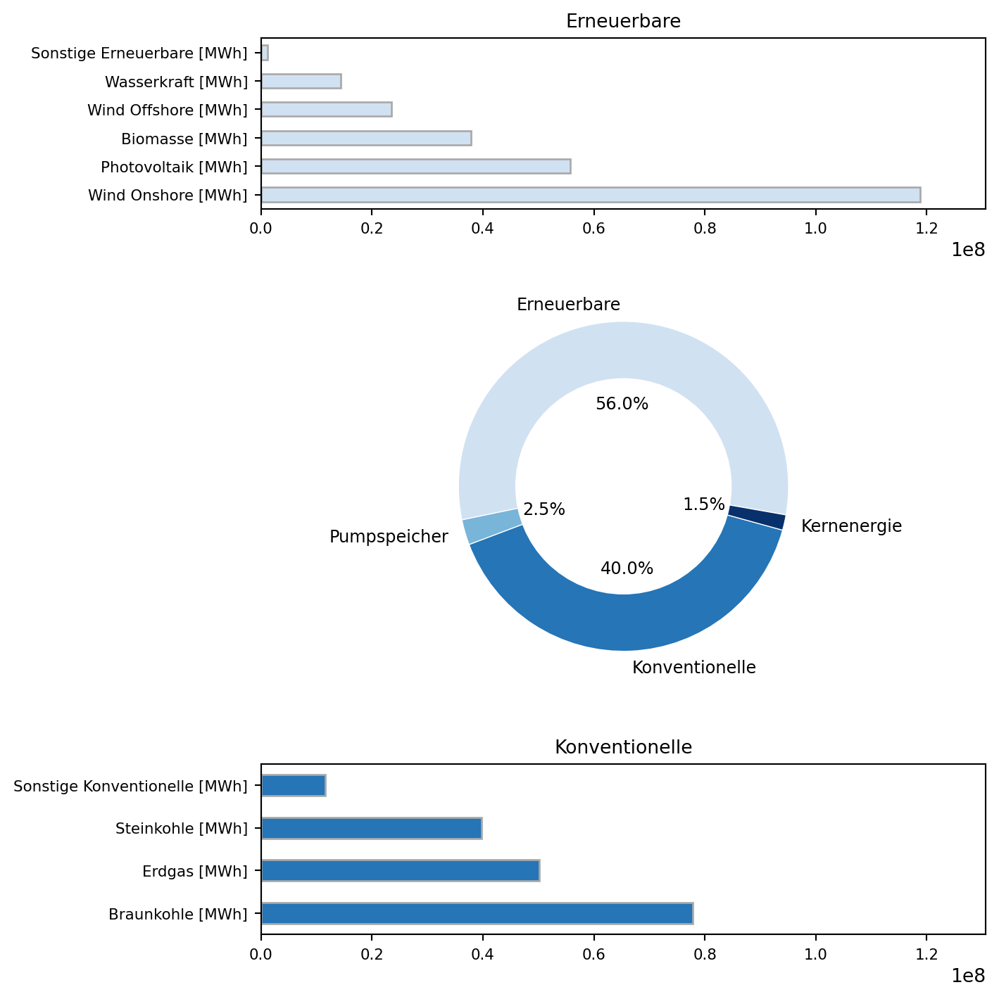

In [13]:
#| echo: false
#| fig-align: center
#| fig-cap: Absolute Stromerzeugung und relative Anteile nach Erzeugungstyp
#| fig-alt: 'Die Grafik besteht aus drei, übereinander angeordneten Teilgrafiken. In der Mitte ist ein Kreisdiagramm der Erzeugungsanteile erneuerbarer Energien (56%), konventioneller Energien (40%) sowie Pumpspeicher (2.5%) und Kernergie (1.5%) zu sehen. Die Kreissegmente sind in Blautönen eingefärbt. Oben ist in einem horizontalen Balkendiagramm die absolute Erzeugung der erneuerbaren Energien von oben nach unten aufsteigend dargestellt. Beginnend mit der geringsten Erzeugung: Sonstige Erneuerbare, Wasserkraft, Wind Offshore, Biomasse, Photovoltaik, Wind Onshore. Unten ist ein einem horizontalen Balkendiagramm die absolute Erzeugung der konventionellen Energie von oben nach unten aufsteigend dargestellt. Beginnend mit der geringsten Erzeugung: Sonstige Konventionelle, Steinkohle, Erdgas, Braunkohle.'

# Erneuerbare und Konventionelle bestimmen, jeweils summieren

## Erneuerbare
plotting_data = erzeugung.copy()
plotting_data.drop(columns = ['Datum von', 'Datum bis', 'Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]',
'Wind Onshore [MWh]', 'Photovoltaik [MWh]',
'Sonstige Erneuerbare [MWh]'], inplace = True) # Datumsspalten entfernen, inplace = False liefert eine Kopie und tut deshalb ohne Objektzuweisung 'nichts'
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]',
'Sonstige Erneuerbare [MWh]']
plotting_data["Erneuerbare"] = erzeugung[erneuerbare].sum(axis = 'columns')

## Konventionelle
plotting_data.drop(columns = ['Braunkohle [MWh]',  'Steinkohle [MWh]', 'Erdgas [MWh]', 'Sonstige Konventionelle [MWh]'], inplace = True)
konventionelle = ['Braunkohle [MWh]',  'Steinkohle [MWh]', 'Erdgas [MWh]', 'Sonstige Konventionelle [MWh]']
plotting_data["Konventionelle"] = erzeugung[konventionelle].sum(axis = 'columns')

# rearrange columns, remove " [MWh]"
plotting_data = plotting_data[['Erneuerbare', 'Pumpspeicher [MWh]', 'Konventionelle', 'Kernenergie [MWh]']]
plotting_data.columns = plotting_data.columns.str.replace(pat = " [MWh]", repl = "")

# zur Kontrolle - axis = columns addiert die Spalten zeilenweise
## print(erneuerbare)
## print(erzeugung[erneuerbare].sum(axis = 'columns'))
## print(plotting_data.columns)
## print(plotting_data[0:3])

# Grafik mit drei subplots erzeugen
plt.figure(figsize = (7.5, 7.5))

nrows = 4
ncols = 2
font_size = 8

# value for shared x-axis on barplots
x_lim = erzeugung.sum(numeric_only = True).max() * 1.1

# array of colors
my_colors = plt.get_cmap('Blues')(np.linspace(0.2, 1, len(plotting_data.sum())))

# plot the pie, use 4 out of 8 panels = middle 2 rows
ax = plt.subplot(nrows, ncols, (3, 6))
plt.pie(x = plotting_data.sum(), colors = my_colors, startangle = 350, labels = list(plotting_data.columns), autopct='%1.1f%%', pctdistance = 0.5, textprops = dict(size = font_size + 1), wedgeprops = {"linewidth": 0.5, "edgecolor": "white"})

# make a donut
circle = plt.Circle((0, 0), radius = 0.65, color = "white")
ax.add_patch(circle)

# top row unstacked barplot 
plt.subplot(nrows, ncols, (1, 2))
erzeugung[erneuerbare].sum().sort_values(ascending = False).plot.barh(fontsize = font_size, xlim = (0, x_lim), color = my_colors[0], edgecolor = 'darkgrey')
plt.title("Erneuerbare", fontsize = font_size + 2)

# bottom row unstacked barplot 
plt.subplot(nrows, ncols, (7, 8))
erzeugung[konventionelle].sum().sort_values(ascending = False).plot.barh(fontsize = font_size, xlim = (0, x_lim), color = my_colors[2], edgecolor = 'darkgrey')
plt.title("Konventionelle", fontsize = font_size + 2)

plt.tight_layout()
plt.show()

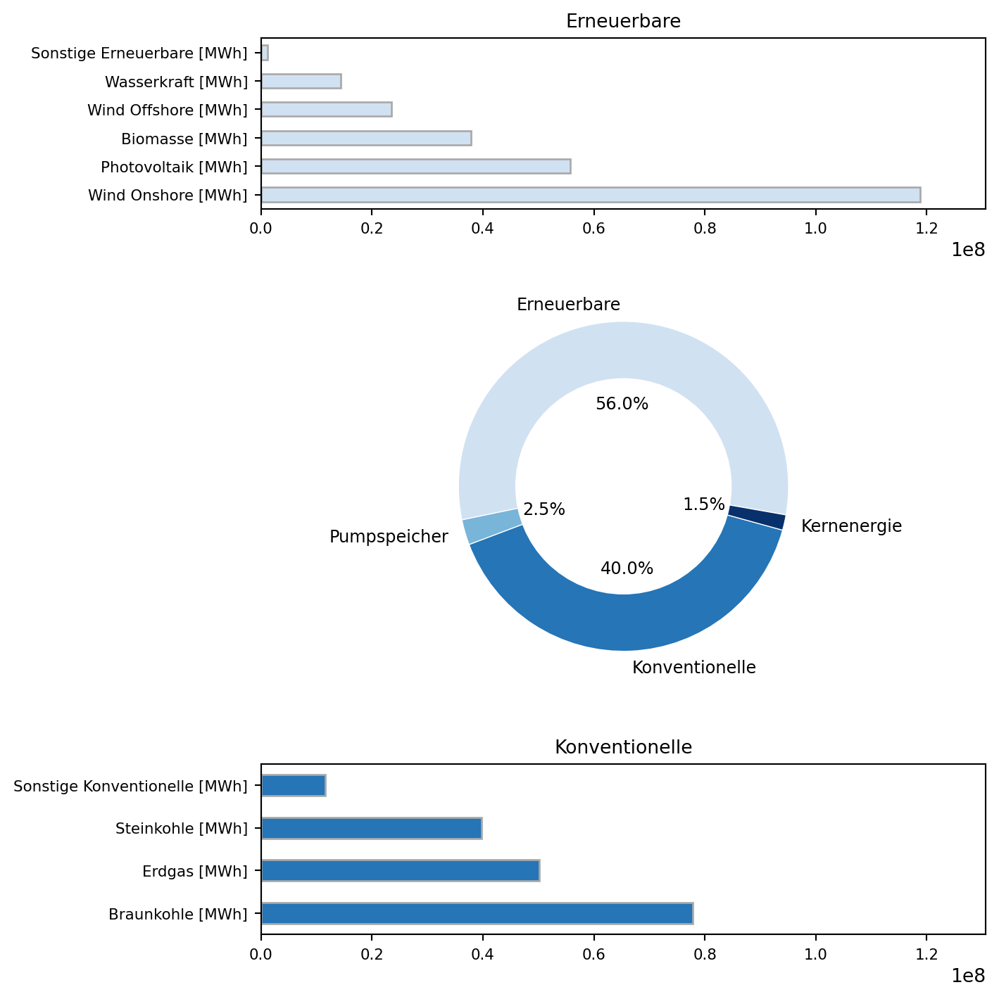

In [14]:
#| output: false

# Erneuerbare und Konventionelle bestimmen, jeweils summieren

## Erneuerbare
plotting_data = erzeugung.copy()
plotting_data.drop(columns = ['Datum von', 'Datum bis', 'Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]',
'Wind Onshore [MWh]', 'Photovoltaik [MWh]',
'Sonstige Erneuerbare [MWh]'], inplace = True) # Datumsspalten entfernen, inplace = False liefert eine Kopie und tut deshalb ohne Objektzuweisung 'nichts'
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]',
'Sonstige Erneuerbare [MWh]']
plotting_data["Erneuerbare"] = erzeugung[erneuerbare].sum(axis = 'columns')

## Konventionelle
plotting_data.drop(columns = ['Braunkohle [MWh]',  'Steinkohle [MWh]', 'Erdgas [MWh]', 'Sonstige Konventionelle [MWh]'], inplace = True)
konventionelle = ['Braunkohle [MWh]',  'Steinkohle [MWh]', 'Erdgas [MWh]', 'Sonstige Konventionelle [MWh]']
plotting_data["Konventionelle"] = erzeugung[konventionelle].sum(axis = 'columns')

# rearrange columns, remove " [MWh]"
plotting_data = plotting_data[['Erneuerbare', 'Pumpspeicher [MWh]', 'Konventionelle', 'Kernenergie [MWh]']]
plotting_data.columns = plotting_data.columns.str.replace(pat = " [MWh]", repl = "")

# zur Kontrolle - axis = columns addiert die Spalten zeilenweise
## print(erneuerbare)
## print(erzeugung[erneuerbare].sum(axis = 'columns'))
## print(plotting_data.columns)
## print(plotting_data[0:3])

# Grafik mit drei subplots erzeugen
plt.figure(figsize = (7.5, 7.5))

nrows = 4
ncols = 2
font_size = 8

# value for shared x-axis on barplots
x_lim = erzeugung.sum(numeric_only = True).max() * 1.1

# array of colors
my_colors = plt.get_cmap('Blues')(np.linspace(0.2, 1, len(plotting_data.sum())))

# plot the pie, use 4 out of 8 panels = middle 2 rows
ax = plt.subplot(nrows, ncols, (3, 6))
plt.pie(x = plotting_data.sum(), colors = my_colors, startangle = 350, labels = list(plotting_data.columns), autopct='%1.1f%%', pctdistance = 0.5, textprops = dict(size = font_size + 1), wedgeprops = {"linewidth": 0.5, "edgecolor": "white"})

# make a donut
circle = plt.Circle((0, 0), radius = 0.65, color = "white")
ax.add_patch(circle)

# top row unstacked barplot 
plt.subplot(nrows, ncols, (1, 2))
erzeugung[erneuerbare].sum().sort_values(ascending = False).plot.barh(fontsize = font_size, xlim = (0, x_lim), color = my_colors[0], edgecolor = 'darkgrey')
plt.title("Erneuerbare", fontsize = font_size + 2)

# bottom row unstacked barplot 
plt.subplot(nrows, ncols, (7, 8))
erzeugung[konventionelle].sum().sort_values(ascending = False).plot.barh(fontsize = font_size, xlim = (0, x_lim), color = my_colors[2], edgecolor = 'darkgrey')
plt.title("Konventionelle", fontsize = font_size + 2)

plt.tight_layout()
plt.show()

In [15]:
#| output: true

print(f"Summe Erzeugung Pumpspeicher: {erzeugung["Pumpspeicher [MWh]"].sum():,.2f}\n"
      f"Summe Verbrauch Pumpspeicher: {verbrauch["Pumpspeicher [MWh]"].sum():,.2f}\n"
      f"{41 * "="}\n"
      f"Wirkungsgrad in Prozent: \t\t\t{( erzeugung["Pumpspeicher [MWh]"].sum() / verbrauch["Pumpspeicher [MWh]"].sum() ) * 100:,.2f}")

Summe Erzeugung Pumpspeicher: 11,149,398.50
Summe Verbrauch Pumpspeicher: 14,095,632.75
Wirkungsgrad in Prozent: 			79.10


In [16]:
#| output: true

print(f"Speicherverluste:\t\t\t{ (speicherverluste := ( verbrauch["Pumpspeicher [MWh]"].sum() - erzeugung["Pumpspeicher [MWh]"].sum() ) / (1000 * 1000) ):>6.2f} TWh\n"
      f"kumulierte Stromerzeugung:\t{ ( kumulierte_erzeugung := erzeugung.sum(numeric_only = True).sum() // (1000 * 1000) ):,.2f} TWh\n"
      f"Summe:\t\t\t\t\t\t{speicherverluste + kumulierte_erzeugung:,.2f} TWh\n\n")

Speicherverluste:			  2.95 TWh
kumulierte Stromerzeugung:	448.00 TWh
Summe:						450.95 TWh




In [17]:
#| eval: false

print(df.iloc[ :, 0:5].describe(include = np.number))
print(df.iloc[ :, 5:10].describe(include = np.number))
print(df.iloc[ :, 10:15].describe(include = np.number))

   Zeit von [CET/CEST]  Zeit bis [CET/CEST]  Wind [MW]  Solar [MW]  \
0  01.01.2023 00:00:00  01.01.2023 00:15:00     1000.0         0.0   
1  01.01.2023 00:15:00  01.01.2023 00:30:00      964.0         0.0   
2  01.01.2023 00:30:00  01.01.2023 00:45:00      956.0         0.0   
3  01.01.2023 00:45:00  01.01.2023 01:00:00      992.0         0.0   
4  01.01.2023 01:00:00  01.01.2023 01:15:00      880.0         0.0   
5  01.01.2023 01:15:00  01.01.2023 01:30:00      888.0         0.0   
6  01.01.2023 01:30:00  01.01.2023 01:45:00      948.0         0.0   
7  01.01.2023 01:45:00  01.01.2023 02:00:00      968.0         0.0   
8  01.01.2023 02:00:00  01.01.2023 02:15:00      956.0         0.0   
9  01.01.2023 02:15:00  01.01.2023 02:30:00      952.0         0.0   

   Biomasse [MW]  Gas [MW]  Kohle [MW]  Öl [MW]  Geothermie [MW]  \
0          240.0      27.6         0.0      0.0             0.07   
1          240.0      27.6         0.0      0.0             0.07   
2          240.0      28.

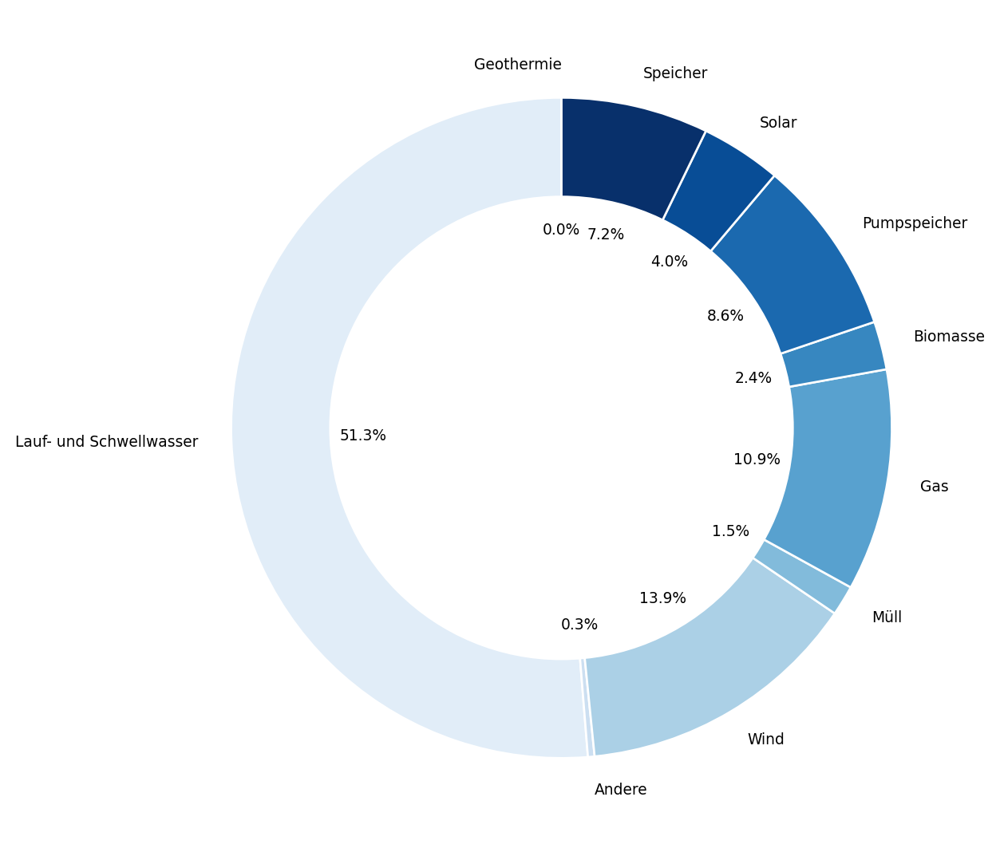

In [18]:
#| fig-align: center
#| fig-cap: Anteil an der Stromerzeugung in Österreich
#| fig-alt: "In einem Ringdiagramm sind die Anteile verschiedener Erzeugungsarten an der Stromerzeugung dargestellt. Die Kreissegmente sind abwechselnd nach Größe sortiert (Größtes, Kleinstes, Zweitgrößtes, Zweitkleinstes usw.)."

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Deklarieren der Anzahl der Nachkommastellen
pd.set_option("display.precision", 2)

# Datensatz wird eingelesen und in der Variable erzeugung0 gespeichert

# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !

erzeugung0_austria_ms = pd.read_csv("aufgaben/01-daten/AGPT_2022-12-31T23_00_00Z_2023-12-31T23_00_00Z_15M_de_2024-06-10T09_32_38Z.csv", 
                                     sep = ";", thousands = ".", decimal = ",", parse_dates = [0, 1], date_format = "%d.%m.%Y")

print(erzeugung0_austria_ms.head(10))

print(f"Der DataFrame erzeugung_austria_ms hat {erzeugung0_austria_ms.shape[0]} Zeilen und {erzeugung0_austria_ms.shape[1]} Spalten.")

# Eckdaten des Datensatzes werden kurz "zusammengefasst"
print(erzeugung0_austria_ms.describe(include = [np.number]))
# Da der Datensatz relativ viele Spalten besitzt, können möglicherweise (je nach Bildschirmauflösung) nicht alle Spalten im Terminal angezeigt werden
# und die mittleren werden daher mit "..." abgekürzt.
# In dem Fall müssen die Spalten passend unterteilt werden, sodass man sich mit der Methode .describe() auch wirklich alle Spalten anschauen und beschreiben lassen kann:
print(erzeugung0_austria_ms.iloc[:, 0:5].describe(include=[np.number]))
print(erzeugung0_austria_ms.iloc[:, 5:10].describe(include=[np.number]))
print(erzeugung0_austria_ms.iloc[:, 10:15].describe(include=[np.number]))

# Kopie des Datensatzes wird angelegt
erzeugung_austria_ms_c = erzeugung0_austria_ms

# Spalten mit den Uhrzeitdaten werden gelöscht
erzeugung_austria_ms_c = erzeugung_austria_ms_c.drop(columns=["Zeit von [CET/CEST]","Zeit bis [CET/CEST]"])
print(erzeugung_austria_ms_c.head(5))
# Die Zeichenkette "[MW]" wird aus den Spalten entfernt
erzeugung_austria_ms_c.columns = erzeugung_austria_ms_c.columns.str.replace(pat=" [MW]", repl="")
print(erzeugung_austria_ms_c.head(5))

# mögliche Plausibilisierung: die .csv Datei in Excel ansehen. Es sollte auffallen, dass sich in der Spalte der Pumpspeicher sowohl
# Positiv- als auch Negativwerte befinden. Sieht man auch, wenn man genau auf die beschriebenen Werte der .describe() Methode achtet
# Nun wird geprüft, ob sich negative Werte in den Erzeugungsleistungen befinden:
check_minus_werte = (erzeugung_austria_ms_c < 0).any().any()
if check_minus_werte == True:
    print("FEHLER: Es befinden sich negative Werte unter den Erzeugungswerten.")

# negative Werte in der Spalte "Pumpspeicher" werden auf 0 gesetzt
erzeugung_austria_ms_c["Pumpspeicher"] = erzeugung_austria_ms_c["Pumpspeicher"].clip(lower=0)

# Spalten mit Summe 0 entfernen
# Ansatz: Jede Spalte wird darauf geprüft, ob die Summe ihrer Werte Null ist. Falls ja, wird diese Spalte mit der .drop Methode aus dem neuen Dataframe gelöscht
# dadurch verschwinden 3 Spalten mit der Summe Null. Geothermie wird immer noch als 0,0 % angezeigt, da der Wert sehr klein ist (nicht erkennbar bei einer Nachkommastelle)
spalten_weg = []
for i in erzeugung_austria_ms_c.columns:
    if erzeugung_austria_ms_c[i].sum() == 0:
        spalten_weg.append(i)
erzeugung_austria_ms_c = erzeugung_austria_ms_c.drop(columns=spalten_weg)
print(erzeugung_austria_ms_c.head(10))

# um die Lesbarkeit der sehr kleinen Teilstücke des Kreisdiagramms zu verbessern, werden die Segmente anders angeordnet.
# Dafür wird die Reihenfolgeder Spalten im Dataframe umsortiert, sodass das größte Segment auf das kleinste Segment der Liste folgt, und so weiter
sortierte_spalten = erzeugung_austria_ms_c.sum().sort_values().index

neue_reihenfolge = []
for i in range(len(sortierte_spalten) // 2):
    neue_reihenfolge.append(sortierte_spalten[i])
    neue_reihenfolge.append(sortierte_spalten[-(i+1)])

# falls eine ungerade Anzahl an Spalten existiert:
if len(sortierte_spalten) % 2 != 0:
    neue_reihenfolge.append(sortierte_spalten[len(sortierte_spalten) // 2])

erzeugung_austria_ms_c = erzeugung_austria_ms_c[neue_reihenfolge]

plt.figure(figsize = (7, 7))
new_plot = erzeugung_austria_ms_c.sum(numeric_only=True).plot.pie(colormap = "Blues", startangle=90, rotatelabels=False, wedgeprops = {"linewidth":1, "edgecolor":"white"}, autopct='%1.1f%%', pctdistance=0.6, textprops=dict(size=7))

# make a donut
circle = plt.Circle((0, 0), radius = 0.7, color = "white")
new_plot.add_patch(circle)

plt.show()

In [19]:
print(verbrauch.sum(numeric_only = True))

Gesamt (Netzlast) [MWh]    4.58e+08
Residuallast [MWh]         2.60e+08
Pumpspeicher [MWh]         1.41e+07
dtype: float64


In [20]:
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]', 'Sonstige Erneuerbare [MWh]']
PV_WindOnshore_WindOffshore = ['Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]'] 

plotting_data = pd.DataFrame()
plotting_data["Netzlast [MWh]"] = verbrauch["Gesamt (Netzlast) [MWh]"].copy() 
plotting_data["volatile EE [MWh]"] = erzeugung[PV_WindOnshore_WindOffshore].sum(axis = "columns").copy()
plotting_data["Erneuerbare [MWh]"] = erzeugung[erneuerbare].sum(axis = "columns").copy()

plotting_data["Residuallast BNetzA [MWh]"] = verbrauch["Residuallast [MWh]"].copy()
plotting_data["Residuallast [MWh]"] = plotting_data["Netzlast [MWh]"] - plotting_data["volatile EE [MWh]"]
plotting_data["Restlast [MWh]"] = plotting_data["Netzlast [MWh]"] - plotting_data["Erneuerbare [MWh]"]

plotting_data.head()

,Netzlast [MWh],volatile EE [MWh],Erneuerbare [MWh],Residuallast BNetzA [MWh],Residuallast [MWh],Restlast [MWh]
0,9720.75,7830.50,9277.00,1890.25,1890.25,443.75
1,9641.25,7902.00,9343.00,1739.25,1739.25,298.25
2,9609.50,8119.50,9559.50,1490.00,1490.00,50.00
3,9565.00,7919.00,9362.25,1646.00,1646.00,202.75
4,9473.50,8107.75,9540.50,1365.75,1365.75,-67.00


In [21]:
#| include: true

plotting_data['Residuallast BNetzA [MWh]'].equals(plotting_data['Residuallast [MWh]'])

True

In [22]:
#| include: true

plotting_data.drop(['Residuallast BNetzA [MWh]'], axis = 'columns', inplace = True)

In [23]:
#| include: false

## mit Pandas
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

## alternativ mit einer Listenoperation

### Position und Inhalt der x-Achsenbeschriftung finden
# monate = erzeugung["Datum von"].dt.month.unique().tolist() # gibt die Zahlen 1-12 aus

# monate_index = []
# monatsnamen = []

# for i in monate:
#   monate_index.append(erzeugung.index[erzeugung["Datum von"].dt.month == i].min())
#   monatsnamen.append(erzeugung["Datum von"].iloc[monate_index[i - 1]].strftime("%B"))

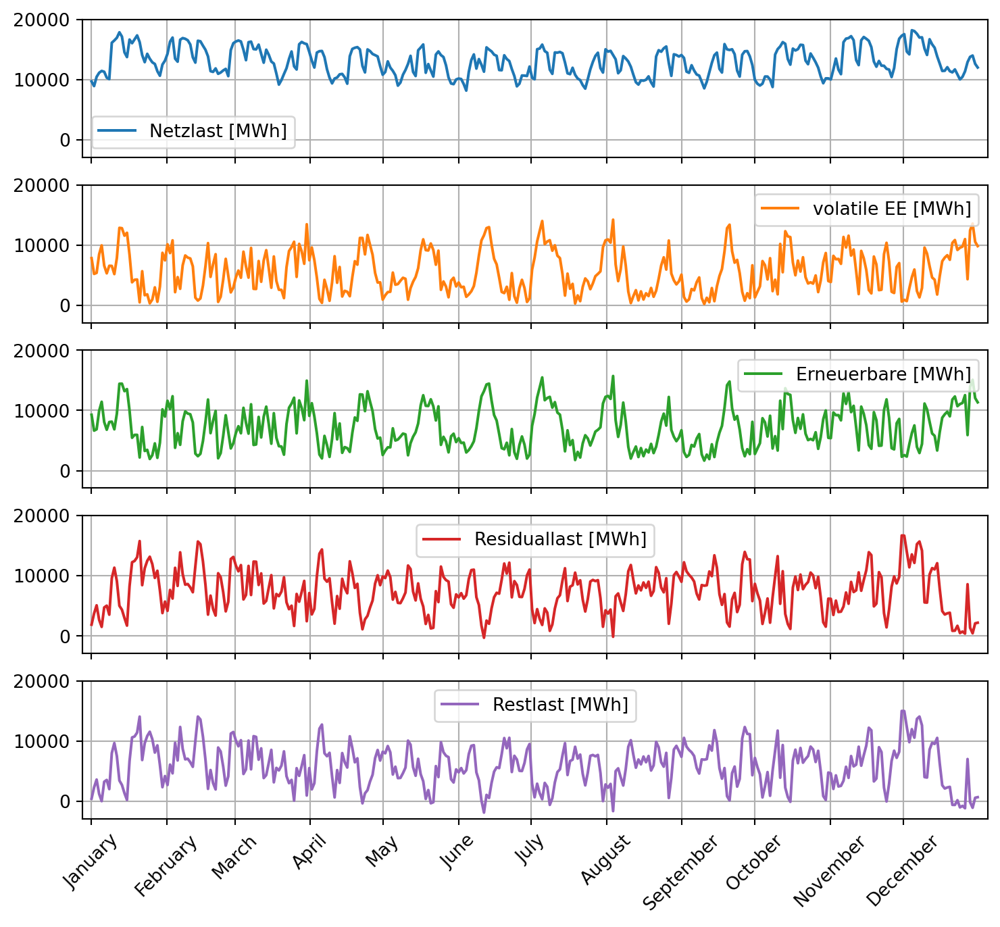

In [24]:
#| echo: false
#| fig-align: center
#| fig-cap: Netzlast im Jahresgang
#| fig-alt: Gemeinsame Darstellung in fünf übereinander angeordneten Teilgrafiken 1. der Netzlast, 2. der kumulierten Erzeugung durch Photovoltaik, Wind Onshore und Wind Offshore, 3. der kumulierten Erzeugung durch erneuerbare Energien, 4. der Residuallast und der 5. Restlast im Jahresverlauf.

# plotten jedes 100. Werts
plotting_data[::100].plot(figsize = (9, 8), subplots = True, sharey = True, xlim = (plotting_data.index.min() - (len(plotting_data.index) / 100), plotting_data.index.max() * 1.01), rot = 45, grid = True)
plt.ylim(top = 20000)
plt.minorticks_off()
plt.xticks(monate_index, monatsnamen);

plt.show()

In [25]:
#| output: true

# Position und Inhalt der x-Achsenbeschriftung finden
monate = erzeugung["Datum von"].dt.month.unique().tolist() # gibt die Zahlen 1-12 aus

## mit Pandas
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

## alternativ mit einer Listenoperation
# monate_index = []
# monatsnamen = []

# for i in monate:
#   monate_index.append(erzeugung.index[erzeugung["Datum von"].dt.month == i].min())
#   monatsnamen.append(erzeugung["Datum von"].iloc[monate_index[i - 1]].strftime("%B"))

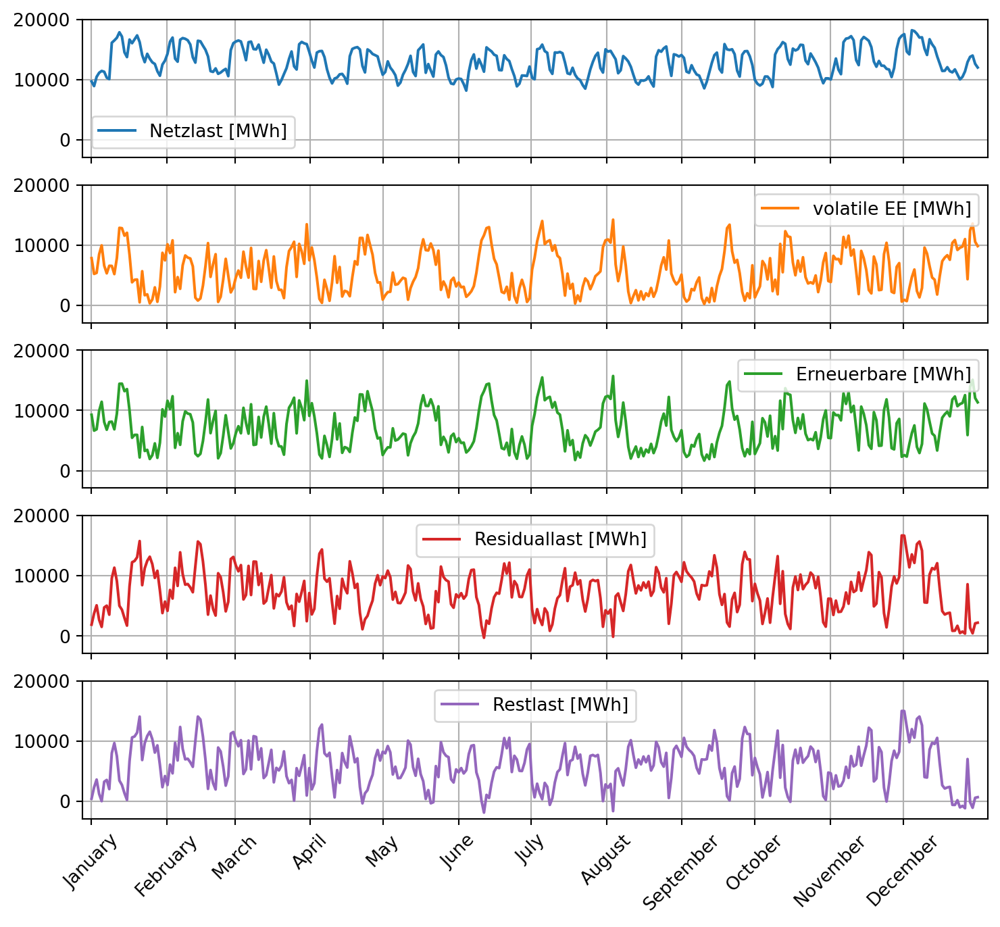

In [26]:
#| output: false

# plotten jedes 100. Werts
plotting_data[::100].plot(figsize = (9, 8), subplots = True, sharey = True, xlim = (plotting_data.index.min() - (len(plotting_data.index) / 100), plotting_data.index.max() * 1.01), rot = 45, grid = True)
plt.ylim(top = 20000)
plt.minorticks_off()
plt.xticks(monate_index, monatsnamen);

plt.show()

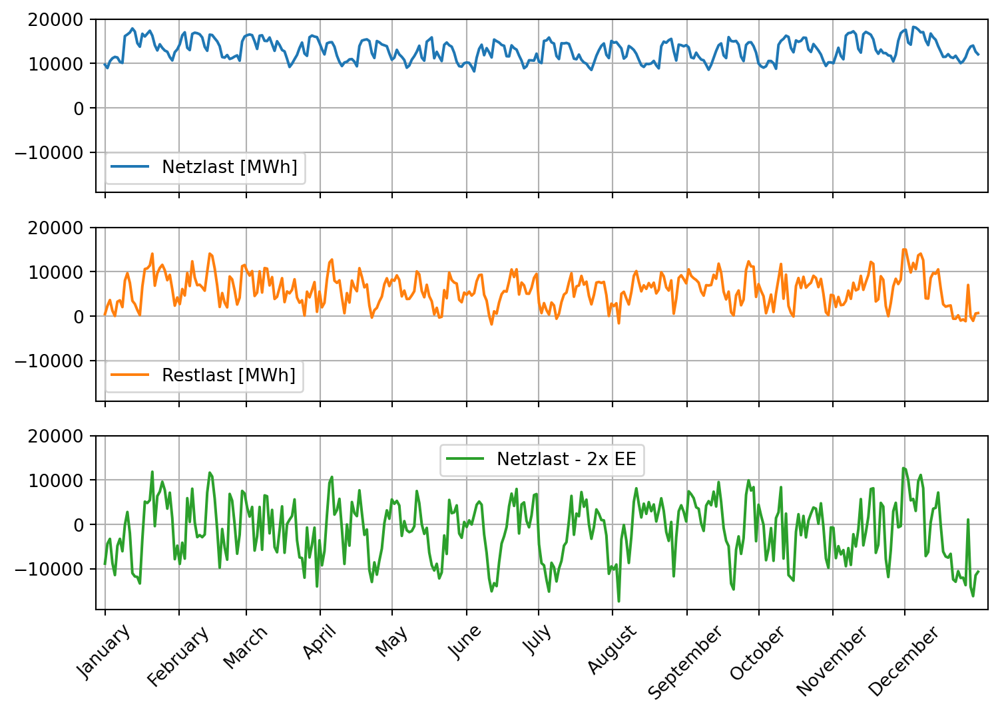

In [27]:
#| echo: false
#| fig-cap: Musterlösung Verdopplung EE
#| fig-alt: "Darstellung der Netzlast und der Netzlast abzüglich der verdoppelten kumulierten Stromerzeugung erneuerbarer Energien im Jahresgang. Die Netzlast abzüglich der verdoppelten erneuerbaren Stromerzeugung nähert sich einer symmetrischen Verteilung um die Nulllinie an. Das heißt, Phasen erneuerbarer Über- und Unterproduktion halten sich ungefähr die Waage."

plotting_data_2EE = plotting_data.copy()
plotting_data_2EE["2x EE"] = plotting_data_2EE["Erneuerbare [MWh]"] * 2
plotting_data_2EE["Netzlast - 2x EE"] = plotting_data_2EE["Netzlast [MWh]"] - plotting_data_2EE["2x EE"]
plotting_data_2EE = plotting_data_2EE[["Netzlast [MWh]", "Restlast [MWh]", "Netzlast - 2x EE"]]

# plotten jedes 100. Werts
plotting_data_2EE[::100].plot(figsize = (9, 6), subplots = True, sharey = True, xlim = (plotting_data_2EE.index.min() - (len(plotting_data_2EE.index)) / 100, plotting_data_2EE.index.max() * 1.01), rot = 45, grid = True)
plt.minorticks_off()
plt.xticks(monate_index, monatsnamen);

plt.show()

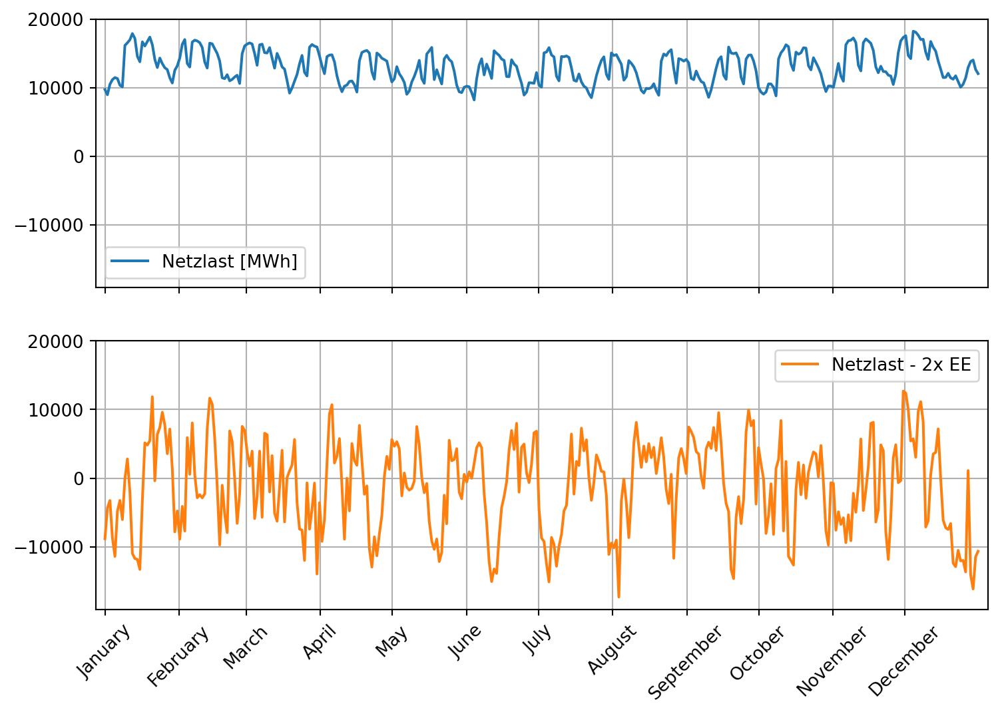

In [28]:
#| output: false
plotting_data_2EE = plotting_data.copy()
plotting_data_2EE["2x EE"] = plotting_data_2EE["Erneuerbare [MWh]"] * 2
plotting_data_2EE["Netzlast - 2x EE"] = plotting_data_2EE["Netzlast [MWh]"] - plotting_data_2EE["2x EE"]
plotting_data_2EE = plotting_data_2EE[["Netzlast [MWh]", "Netzlast - 2x EE"]]

# plotten jedes 100. Werts
plotting_data_2EE[::100].plot(figsize = (9, 6), subplots = True, sharey = True, xlim = (plotting_data_2EE.index.min() - (len(plotting_data_2EE.index)) / 100, plotting_data_2EE.index.max() * 1.01), rot = 45, grid = True)
plt.minorticks_off()
plt.xticks(monate_index, monatsnamen);

plt.show()

In [29]:
# print(f"{erzeugung.sum(numeric_only = True)}\n")
# print(installierte_leistung.sum(numeric_only = True), "\n")

# Für die Division müssen die Indizes zurücksetzt werden
jahresvolllaststunden = erzeugung.sum(numeric_only = True).reset_index(drop = True).divide(installierte_leistung.sum(numeric_only = True).reset_index(drop = True))

# Index neu setzen
jahresvolllaststunden.index = erzeugung.sum(numeric_only = True).index.str.replace(pat = " [MWh]", repl = " [h]")

print(f"\n\nJahresvolllaststunden\n\n{jahresvolllaststunden.sort_values(ascending = False)}")



Jahresvolllaststunden

Biomasse [h]                   4467.41
Braunkohle [h]                 4399.96
Wind Offshore [h]              2893.34
Wasserkraft [h]                2855.83
Sonstige Erneuerbare [h]       2653.47
Steinkohle [h]                 2192.86
Wind Onshore [h]               2062.55
Kernenergie [h]                1661.92
Erdgas [h]                     1576.42
Sonstige Konventionelle [h]    1293.98
Pumpspeicher [h]               1188.76
Photovoltaik [h]                883.48
dtype: float64


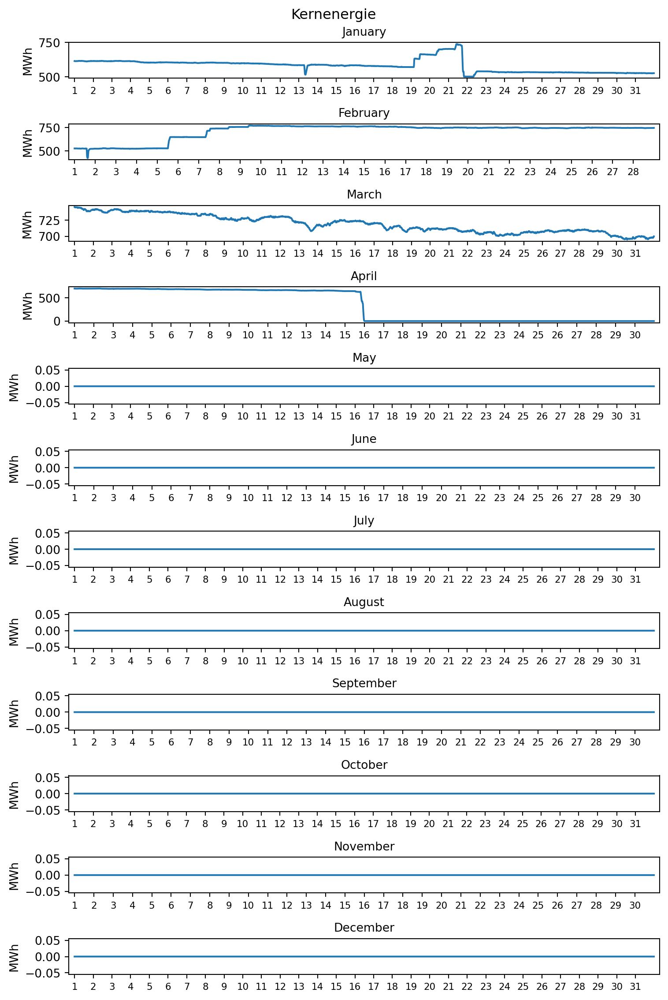

In [30]:
#| output: false
#| fig-cap: Jahresgang Kernenergie
#| fig-alt: "Für jeden Monat stellen 12 Teilgrafiken die Stromerzeugung durch Kernenergie dar. Während die Produktion von Januar bis März in einem engen Band bleibt, sinkt diese am 15. April auf Null."
plotting_data = erzeugung.copy()

erzeuger = "Kernenergie"

fig = plt.figure(figsize = (8, 12))
fig.suptitle(erzeuger, fontsize = 12)
for i in range(1, 13):
  plotting_data_monthly = plotting_data[plotting_data['Datum von'].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MWh")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

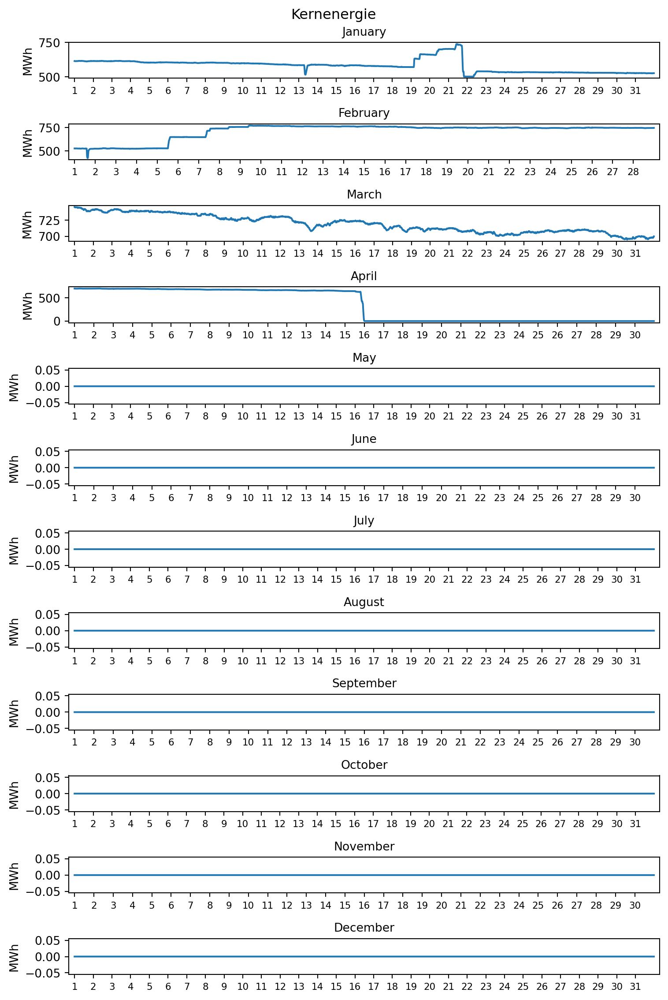

In [31]:
#| echo: false
#| fig-cap: Jahresgang Kernenergie
#| fig-alt: "Für jeden Monat stellen 12 Teilgrafiken die Stromerzeugung durch Kernenergie dar. Während die Produktion von Januar bis März in einem engen Band bleibt, sinkt diese am 15. April auf Null."
plotting_data = erzeugung.copy()

erzeuger = "Kernenergie"

fig = plt.figure(figsize = (8, 12))
fig.suptitle(erzeuger, fontsize = 12)
for i in range(1, 13):
  plotting_data_monthly = plotting_data[plotting_data['Datum von'].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MWh")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

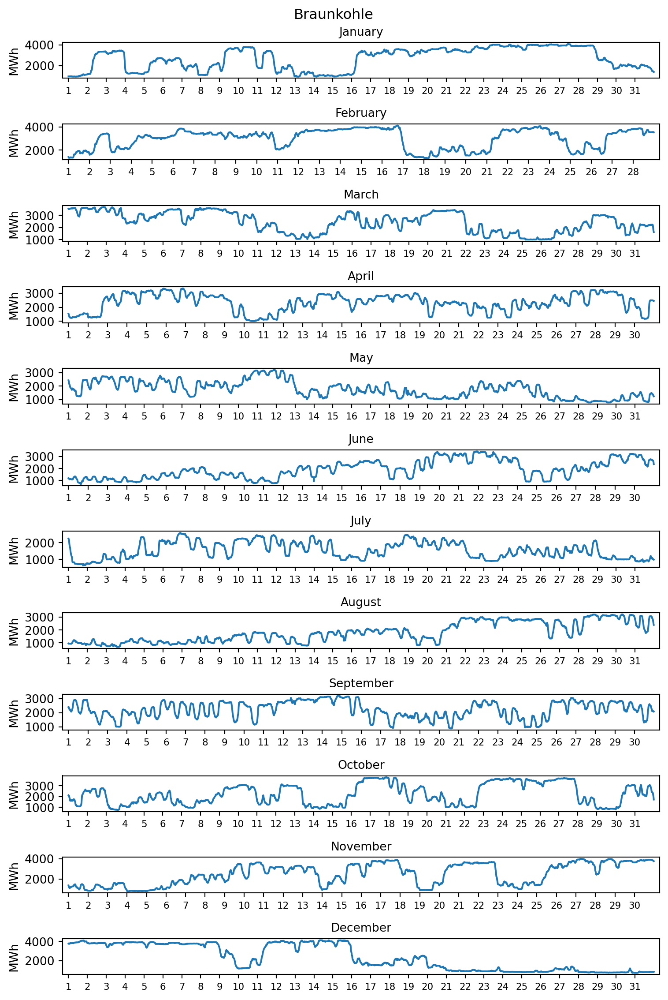

In [32]:
#| echo: false
#| fig-cap: Jahresgang Braunkohle
#| fig-alt: "Der Jahresgang der Stromerzeugung durch Braunkohle wird monatsweise in 12 Grafiken gezeigt. Der Jahresgang ist durch starke Bewegungen gekennzeichnet. Phasen der Volllastproduktion im Bereich von 4000 MWh je Viertelstunde werden nur selten über Perioden von einer Woche gefahren. Häufig werden die Produktionsspitzen nur stundenweise erreicht, um anschließend die Produktion teils stark zu drosseln. Geringe Produktionsniveaus im Bereich von 1000 MWh je Viertelstunde sind keine Seltenheit."
plotting_data = erzeugung.copy()

erzeuger = "Braunkohle"

fig = plt.figure(figsize = (8, 12))
fig.suptitle(erzeuger, fontsize = 12)
for i in range(1, 13):
  plotting_data_monthly = plotting_data[plotting_data['Datum von'].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MWh")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

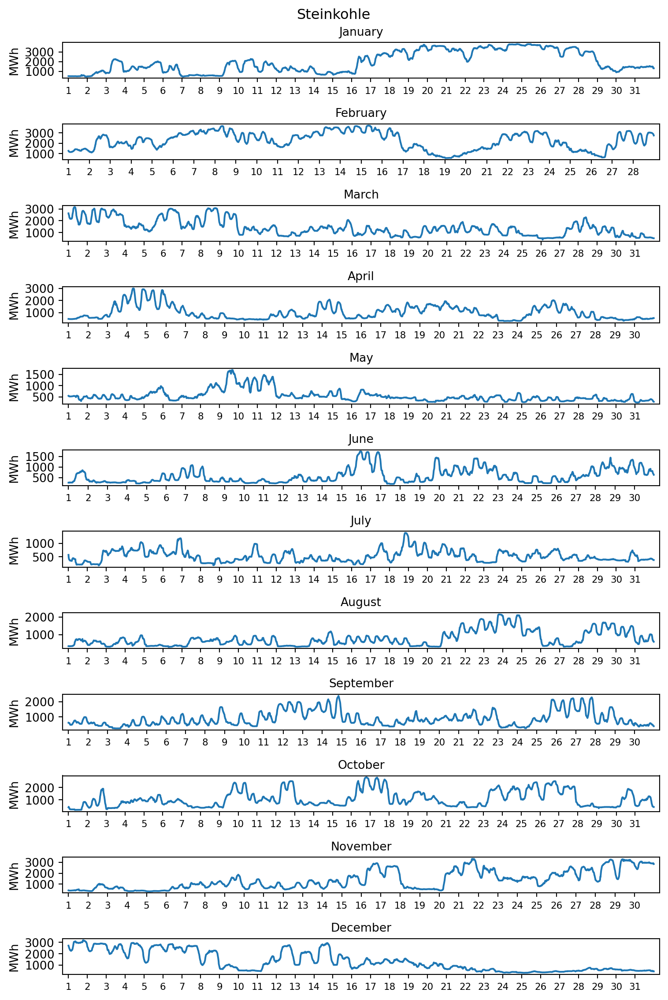

In [33]:
#| echo: false
#| fig-cap: Jahresgang Steinkohle
#| fig-alt: "Der Jahresgang der Stromerzeugung durch Steinkohle wird monatsweise in 12 Grafiken gezeigt. Die Produktionsspitzen erreichen nur selten 3000 MWh je Viertelstunde und dauern nur wenige Stunden an. Es dominieren untertägige An- und Runterfahrzyklen. Häufig sind auch Phasen niedriger Produktion im Bereich von 1000 MWh."
plotting_data = erzeugung.copy()

erzeuger = "Steinkohle"

fig = plt.figure(figsize = (8, 12))
fig.suptitle(erzeuger, fontsize = 12)
for i in range(1, 13):
  plotting_data_monthly = plotting_data[plotting_data['Datum von'].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MWh")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

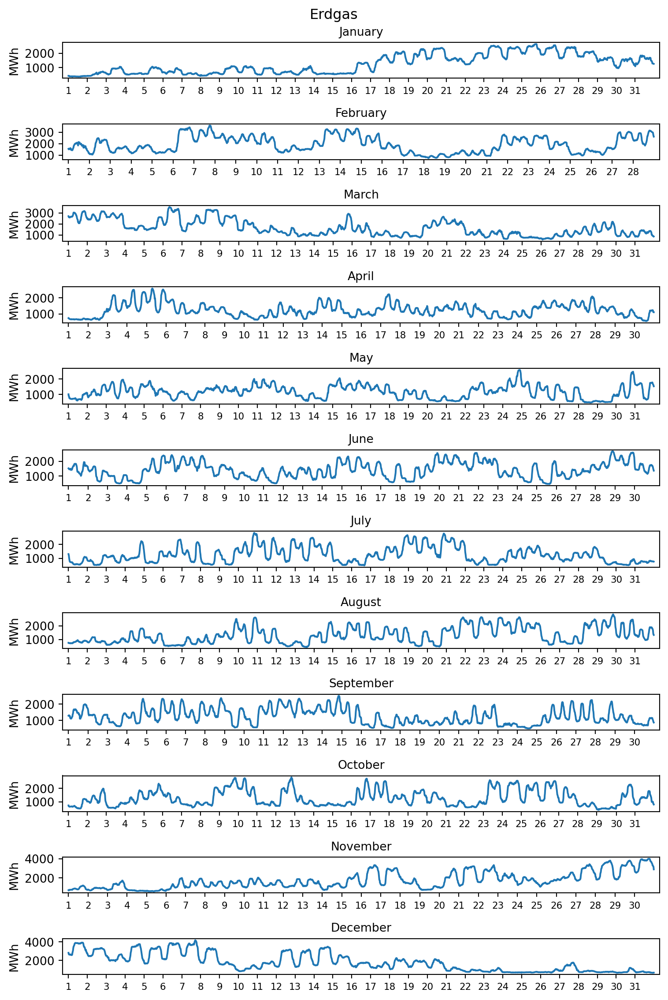

In [34]:
#| echo: false
#| fig-cap: Jahresgang Erdgas
#| fig-alt: "Der Jahresgang der Stromerzeugung durch Erdgas wird monatsweise in 12 Grafiken gezeigt. Der Jahresgang von Erdgas ähnelt der von Steinkohle, wenngleich auf einem deutlich niedrigeren Produktionsniveau. Obwohl die installierte Leistung der Gaskraftwerke um ein Dreiviertel höher ist als die der Braun- und Steinkohlekraftwerke, werden auf Viertelstundenbasis in der Spitze nur 4000 MWh produziert. Typisch sind jedoch Produktionsniveaus unterhalb von 2000 MWh, häufig auch deutlich unterhalb von 1000 MWh."
plotting_data = erzeugung.copy()

erzeuger = "Erdgas"

fig = plt.figure(figsize = (8, 12))
fig.suptitle(erzeuger, fontsize = 12)
for i in range(1, 13):
  plotting_data_monthly = plotting_data[plotting_data['Datum von'].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MWh")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

In [35]:
print(f"Vorwärtssuche: erzeugung['Kernenergie [MWh]'].eq(0).idxmax() - 1\n{erzeugung['Kernenergie [MWh]'].eq(0).idxmax() - 1}\n")

# rückwärts
print(f"Rückwärtssuche: position := erzeugung['Kernenergie [MWh]'].iloc[::-1].gt(0).idxmax()\n{ ( position := erzeugung['Kernenergie [MWh]'].iloc[::-1].gt(0).idxmax() ) }\n")

print(f"erzeugung['Datum bis'].iloc[position].strftime('%d. %B %Y um %H:%M Uhr')\n{erzeugung['Datum bis'].iloc[position].strftime('%d. %B %Y um %H:%M Uhr')}")

Vorwärtssuche: erzeugung['Kernenergie [MWh]'].eq(0).idxmax() - 1
10075

Rückwärtssuche: position := erzeugung['Kernenergie [MWh]'].iloc[::-1].gt(0).idxmax()
10075

erzeugung['Datum bis'].iloc[position].strftime('%d. %B %Y um %H:%M Uhr')
16. April 2023 um 00:00 Uhr


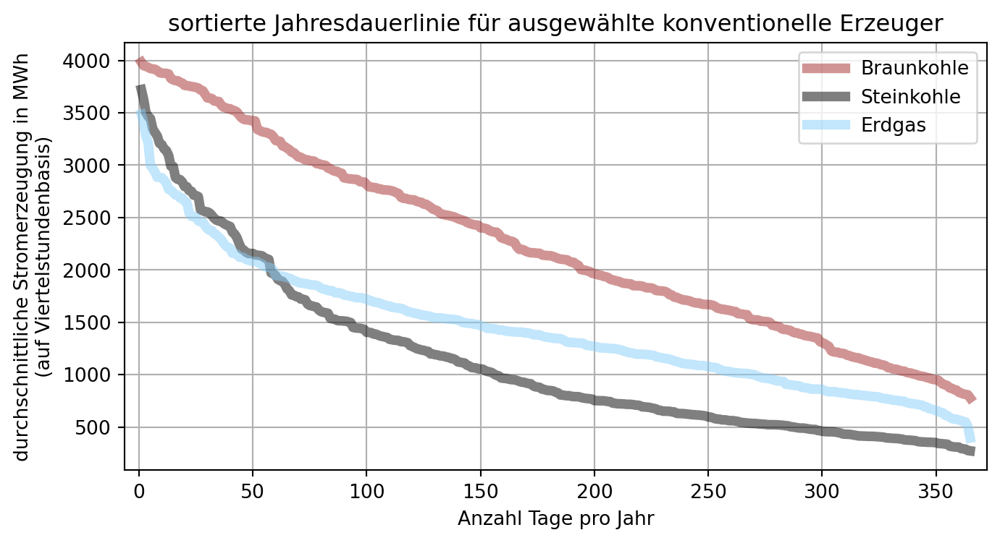

In [36]:
#| echo: false
#| fig-cap: sortierte Jahresdauerlinie ausgewählter konventioneller Erzeuger
#| fig-alt: "Dargestellt werden die sortierten Jahresdauerlinien für Braunkohle, Steinkohle und Erdgas. Während sich für Braunkohle ein fast liniear abfallender Verlauf ergibt, zeigen Erdgas und insbesondere Steinkohle stark abfallende Verläufe, was bedeutet, dass hohe Produktionsniveaus deutlich seltener erreicht werden, als niedrige. Beispielsweise erreicht Braunkohle das Produktionsmaximum von ca. 4000 MWh an einem Tag. Die Hälfte dieses Werts (oder mehr) wird an 200 Tagen im Jahr erreicht. Demgegenüber erreicht Steinkohle das Produktionsmaximum von ca. 3750 MWh an einem Tag. Die Hälfte dieses Werts (oder mehr) wird aber nur an ca. 60 Tagen im Jahr erreicht."

# Daten nach Tag gruppieren und durch Mittelwertbildung auf Tagesbasis aggregieren.
braunkohle_daily = erzeugung['Braunkohle [MWh]'].groupby(erzeugung["Datum von"].dt.dayofyear).mean()
steinkohle_daily = erzeugung['Steinkohle [MWh]'].groupby(erzeugung["Datum von"].dt.dayofyear).mean()
erdgas_daily = erzeugung['Erdgas [MWh]'].groupby(erzeugung["Datum von"].dt.dayofyear).mean()

## Zur Kontrolle
## print(erzeugung["Datum von"].dt.dayofyear)
## print(f"\n\nbraunkohle_daily.head()\n{braunkohle_daily.head()}\n\n"
##       f"Zum Vergleich:\nerzeugung['Braunkohle [MWh]'].iloc[[0, 1, 95, 96]]\n{erzeugung['Braunkohle [MWh]'].iloc[[0, 1, 95, 96]]}\n\n"
##       f"erzeugung['Braunkohle [MWh]'].iloc[0:96].mean()\n{erzeugung['Braunkohle [MWh]'].iloc[0:96].mean()}") 

# Liniendiagramm plotten
# Index um 1 verschieben, weil Index mit 0 beginnt, aber die Anzahl der Tage dargestellt wird.
linienstärke = 5
plt.figure(figsize = (8, 4))

braunkohle_daily = braunkohle_daily.sort_values(ascending = False, ignore_index = True)
braunkohle_daily.index += 1
braunkohle_daily.plot.line(lw = linienstärke, color = 'brown', alpha = 0.5, label = 'Braunkohle')

steinkohle_daily = steinkohle_daily.sort_values(ascending = False, ignore_index = True)
steinkohle_daily.index += 1
steinkohle_daily.plot.line(lw = linienstärke, color = 'black', alpha = 0.5, label = 'Steinkohle')

erdgas_daily = erdgas_daily.sort_values(ascending = False, ignore_index = True)
erdgas_daily.index += 1
erdgas_daily.plot.line(lw = linienstärke, color = 'lightskyblue', alpha = 0.5, label = 'Erdgas')

plt.title(label = "sortierte Jahresdauerlinie für ausgewählte konventionelle Erzeuger")
plt.grid()
plt.legend()
plt.ylabel('durchschnittliche Stromerzeugung in MWh\n(auf Viertelstundenbasis)')
plt.xlabel('Anzahl Tage pro Jahr')

plt.margins(x = 0.02)
plt.show()

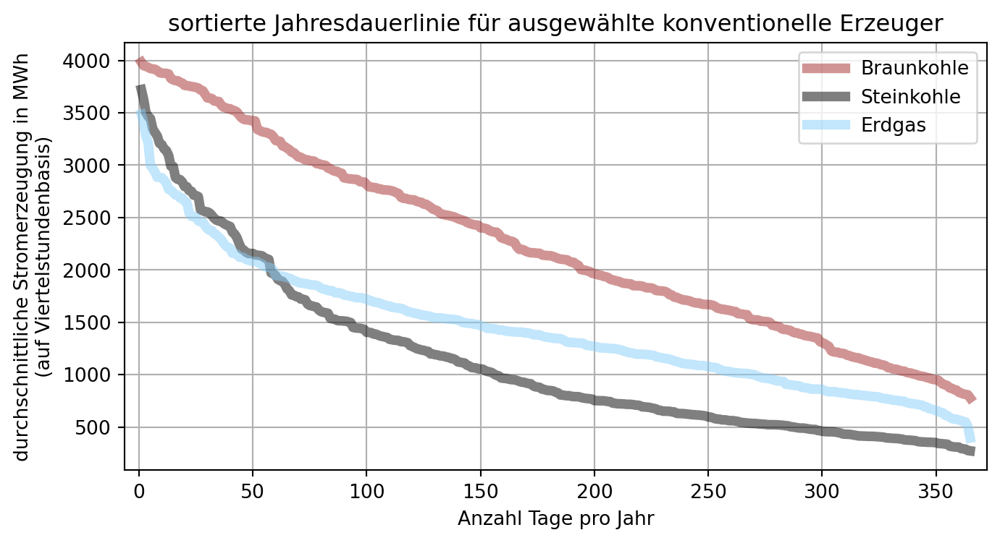

In [37]:
#| output: false

# Daten nach Tag gruppieren und durch Mittelwertbildung auf Tagesbasis aggregieren.
braunkohle_daily = erzeugung['Braunkohle [MWh]'].groupby(erzeugung["Datum von"].dt.dayofyear).mean()
steinkohle_daily = erzeugung['Steinkohle [MWh]'].groupby(erzeugung["Datum von"].dt.dayofyear).mean()
erdgas_daily = erzeugung['Erdgas [MWh]'].groupby(erzeugung["Datum von"].dt.dayofyear).mean()

## Zur Kontrolle
## print(erzeugung["Datum von"].dt.dayofyear)
## print(f"\n\nbraunkohle_daily.head()\n{braunkohle_daily.head()}\n\n"
##       f"Zum Vergleich:\nerzeugung['Braunkohle [MWh]'].iloc[[0, 1, 95, 96]]\n{erzeugung['Braunkohle [MWh]'].iloc[[0, 1, 95, 96]]}\n\n"
##       f"erzeugung['Braunkohle [MWh]'].iloc[0:96].mean()\n{erzeugung['Braunkohle [MWh]'].iloc[0:96].mean()}") 

# Liniendiagramm plotten
# Index um 1 verschieben, weil Index mit 0 beginnt, aber die Anzahl der Tage dargestellt wird.
linienstärke = 5
plt.figure(figsize = (8, 4))

braunkohle_daily = braunkohle_daily.sort_values(ascending = False, ignore_index = True)
braunkohle_daily.index += 1
braunkohle_daily.plot.line(lw = linienstärke, color = 'brown', alpha = 0.5, label = 'Braunkohle')

steinkohle_daily = steinkohle_daily.sort_values(ascending = False, ignore_index = True)
steinkohle_daily.index += 1
steinkohle_daily.plot.line(lw = linienstärke, color = 'black', alpha = 0.5, label = 'Steinkohle')

erdgas_daily = erdgas_daily.sort_values(ascending = False, ignore_index = True)
erdgas_daily.index += 1
erdgas_daily.plot.line(lw = linienstärke, color = 'lightskyblue', alpha = 0.5, label = 'Erdgas')

plt.title(label = "sortierte Jahresdauerlinie für ausgewählte konventionelle Erzeuger")
plt.grid()
plt.legend()
plt.ylabel('durchschnittliche Stromerzeugung in MWh\n(auf Viertelstundenbasis)')
plt.xlabel('Anzahl Tage pro Jahr')

plt.margins(x = 0.02)
plt.show()

            Datum von           Datum bis  Biomasse [MWh]  Wasserkraft [MWh]  \
0 2023-01-01 00:00:00 2023-01-01 00:15:00         1094.25             320.00   
1 2023-01-01 00:15:00 2023-01-01 00:30:00         1091.25             317.50   
2 2023-01-01 00:30:00 2023-01-01 00:45:00         1090.25             317.25   
3 2023-01-01 00:45:00 2023-01-01 01:00:00         1089.25             321.50   
4 2023-01-01 01:00:00 2023-01-01 01:15:00         1085.25             315.25   
5 2023-01-01 01:15:00 2023-01-01 01:30:00         1087.75             304.75   
6 2023-01-01 01:30:00 2023-01-01 01:45:00         1086.50             303.50   
7 2023-01-01 01:45:00 2023-01-01 02:00:00         1085.25             304.25   
8 2023-01-01 02:00:00 2023-01-01 02:15:00         1080.25             308.25   
9 2023-01-01 02:15:00 2023-01-01 02:30:00         1084.25             305.50   

   Wind Offshore [MWh]  Wind Onshore [MWh]  Photovoltaik [MWh]  \
0               684.25             7145.75           

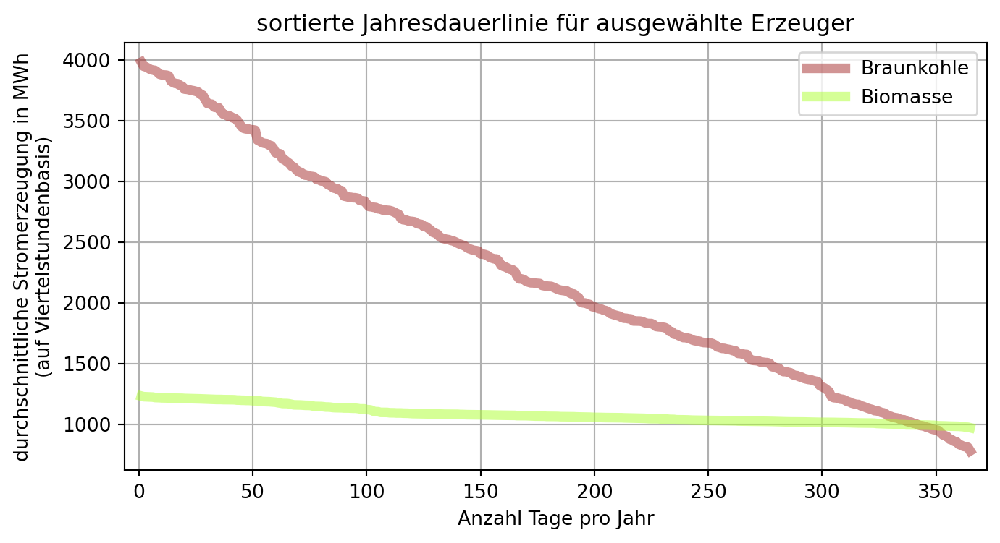

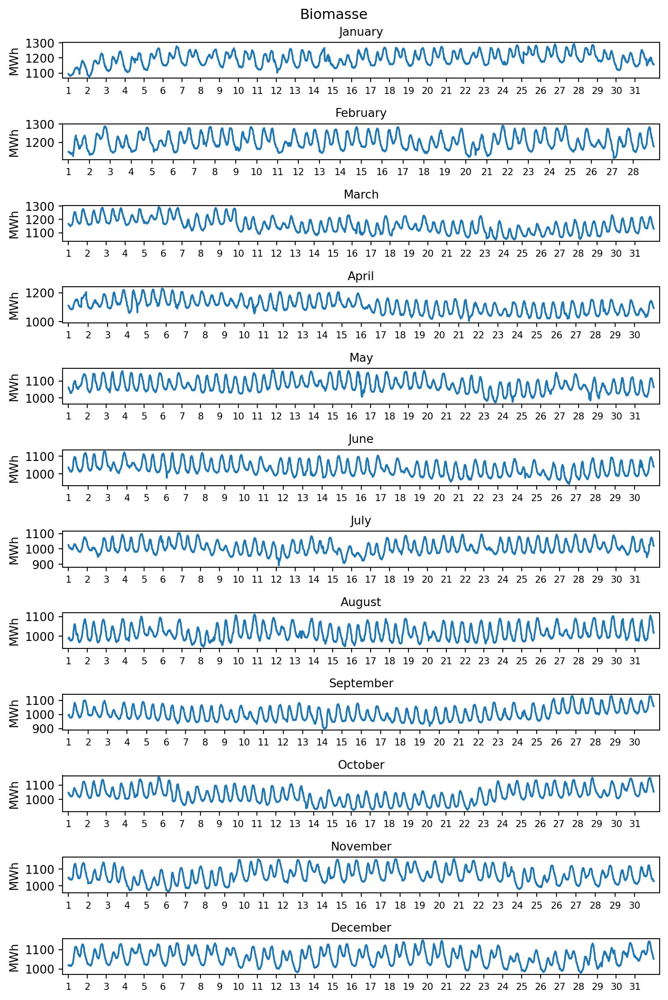

In [38]:
#| output: false

import pandas as pd
import matplotlib.pyplot as plt

# Deklarieren der Anzahl der Nachkommastellen
pd.set_option("display.precision", 2)

# Datensätze werden eingelesen

# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !

erzeugung0_ms = pd.read_csv("skript/01-daten/Realisierte_Erzeugung_202301010000_202401010000_Viertelstunde.csv", \
sep = ";", thousands = ".", decimal = ",", parse_dates =  [0, 1], date_format = "%d.%m.%Y %H:%M")

# Zeichenkette " Originalauflösungen" entfernen
erzeugung0_ms.columns = erzeugung0_ms.columns.str.replace(pat = " Originalauflösungen", repl = "")

print(erzeugung0_ms.head(10))

# Daten der zu betrachtenden Erzeugungsarten nach Tag gruppieren und durch Mittelwertbildung auf Tagesbasis aggregieren
braunkohle_daily_ms = erzeugung0_ms['Braunkohle [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()
biomasse_daily_ms = erzeugung0_ms['Biomasse [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()

# Liniendiagramm plotten
linienstärke = 5
plt.figure(figsize = (8, 4))

braunkohle_daily_ms = braunkohle_daily_ms.sort_values(ascending = False, ignore_index = True)
braunkohle_daily_ms.index += 1
braunkohle_daily_ms.plot.line(lw = linienstärke, color = 'brown', alpha = 0.5, label = 'Braunkohle')

biomasse_daily_ms = biomasse_daily_ms.sort_values(ascending = False, ignore_index = True)
biomasse_daily_ms.index += 1
biomasse_daily_ms.plot.line(lw = linienstärke, color = 'greenyellow', alpha = 0.5, label = 'Biomasse')

plt.title(label = "sortierte Jahresdauerlinie für ausgewählte Erzeuger")
plt.grid()
plt.legend()
plt.ylabel('durchschnittliche Stromerzeugung in MWh\n(auf Viertelstundenbasis)')
plt.xlabel('Anzahl Tage pro Jahr')

plt.margins(x = 0.02)

# Lastgang: Hier den Erzeugungstyp auswählen, je nachdem, welcher Lastgang geplottet werden soll. Der andere wird auskommentiert
erzeuger = "Biomasse"
#erzeuger = "Braunkohle"

fig = plt.figure(figsize = (8, 12))
fig.suptitle(erzeuger, fontsize = 12)
for i in range(1, 13):
  plotting_data_monthly = erzeugung0_ms[erzeugung0_ms['Datum von'].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MWh")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

In [39]:
#| echo: false

# import pandas as pd
# import matplotlib.pyplot as plt

# # Deklarieren der Anzahl der Nachkommastellen
# pd.set_option("display.precision", 2)

# Datensätze werden eingelesen

# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !

# erzeugung0_ms = pd.read_csv("skript/01-daten/Realisierte_Erzeugung_202301010000_202401010000_Viertelstunde.csv", \
# sep = ";", thousands = ".", decimal = ",", parse_dates =  [0, 1], date_format = "%d.%m.%Y %H:%M")

# # Zeichenkette " Originalauflösungen" entfernen
# erzeugung0_ms.columns = erzeugung0_ms.columns.str.replace(pat = " Originalauflösungen", repl = "")

print(erzeugung0_ms.head(10))

# # Daten der zu betrachtenden Erzeugungsarten nach Tag gruppieren und durch Mittelwertbildung auf Tagesbasis aggregieren
# braunkohle_daily_ms = erzeugung0_ms['Braunkohle [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()
# biomasse_daily_ms = erzeugung0_ms['Biomasse [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()

# # Liniendiagramm plotten
# linienstärke = 5
# plt.figure(figsize = (8, 4))

# braunkohle_daily_ms = braunkohle_daily_ms.sort_values(ascending = False, ignore_index = True)
# braunkohle_daily_ms.index += 1
# braunkohle_daily_ms.plot.line(lw = linienstärke, color = 'brown', alpha = 0.5, label = 'Braunkohle')

# biomasse_daily_ms = biomasse_daily_ms.sort_values(ascending = False, ignore_index = True)
# biomasse_daily_ms.index += 1
# biomasse_daily_ms.plot.line(lw = linienstärke, color = 'greenyellow', alpha = 0.5, label = 'Biomasse')

# plt.title(label = "sortierte Jahresdauerlinie für ausgewählte Erzeuger")
# plt.grid()
# plt.legend()
# plt.ylabel('durchschnittliche Stromerzeugung in MWh\n(auf Viertelstundenbasis)')
# plt.xlabel('Anzahl Tage pro Jahr')

# plt.margins(x = 0.02)

# # Lastgang: Hier den Erzeugungstyp auswählen, je nachdem, welcher Lastgang geplottet werden soll. Der andere wird auskommentiert
# erzeuger = "Biomasse"
# #erzeuger = "Braunkohle"

# fig = plt.figure(figsize = (8, 12))
# fig.suptitle(erzeuger, fontsize = 12)
# for i in range(1, 13):
#   plotting_data_monthly = erzeugung0_ms[erzeugung0_ms['Datum von'].dt.month == i]
#   ax = fig.add_subplot(12, 1, i)
#   ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
#   plt.margins(x = 0.01)
#   ax.set_ylabel(ylabel = "MWh")
 
#   # Titel erzeugen
#   plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
#   # xticks erzeugen
#   tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
#   tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
#   plt.xticks(tage_index, tagesnamen, fontsize = 8)

# plt.tight_layout()
# plt.show()

            Datum von           Datum bis  Biomasse [MWh]  Wasserkraft [MWh]  \
0 2023-01-01 00:00:00 2023-01-01 00:15:00         1094.25             320.00   
1 2023-01-01 00:15:00 2023-01-01 00:30:00         1091.25             317.50   
2 2023-01-01 00:30:00 2023-01-01 00:45:00         1090.25             317.25   
3 2023-01-01 00:45:00 2023-01-01 01:00:00         1089.25             321.50   
4 2023-01-01 01:00:00 2023-01-01 01:15:00         1085.25             315.25   
5 2023-01-01 01:15:00 2023-01-01 01:30:00         1087.75             304.75   
6 2023-01-01 01:30:00 2023-01-01 01:45:00         1086.50             303.50   
7 2023-01-01 01:45:00 2023-01-01 02:00:00         1085.25             304.25   
8 2023-01-01 02:00:00 2023-01-01 02:15:00         1080.25             308.25   
9 2023-01-01 02:15:00 2023-01-01 02:30:00         1084.25             305.50   

   Wind Offshore [MWh]  Wind Onshore [MWh]  Photovoltaik [MWh]  \
0               684.25             7145.75           

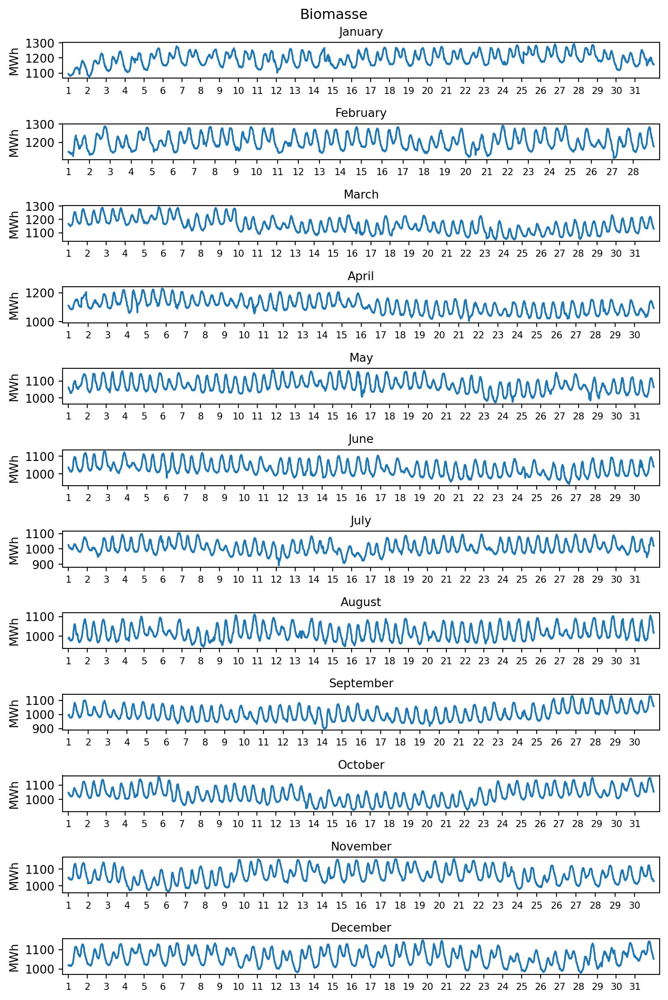

In [40]:
#| echo: false
#| fig-align: center
#| fig-cap: Jahresgang Biomasse
#| fig-alt: "Für jeden Monat stellen 12 Teilgrafiken die Stromerzeugung durch Biomasse dar. Die Stromerzeugung ist ganzjährig oberhalb von 900 MWh je Viertelstunde. Oberhalb dieses Niveaus ist ein häufiges Auf- und Ab- der Stromerzeugung zu sehen. Einerseits scheint die Erzeugung dem Tagesgang der Netzlast zu folgen. Andererseits scheint in der hellen Erzeugung die Produktion in den Mittagsstunden vermindert zu werden."

import pandas as pd
import matplotlib.pyplot as plt

# Deklarieren der Anzahl der Nachkommastellen
pd.set_option("display.precision", 2)

# Datensätze werden eingelesen

# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !

# erzeugung0_ms = pd.read_csv("skript/01-daten/Realisierte_Erzeugung_202301010000_202401010000_Viertelstunde.csv", \
# sep = ";", thousands = ".", decimal = ",", parse_dates =  [0, 1], date_format = "%d.%m.%Y %H:%M")

# # Zeichenkette " Originalauflösungen" entfernen
# erzeugung0_ms.columns = erzeugung0_ms.columns.str.replace(pat = " Originalauflösungen", repl = "")

# print(erzeugung0_ms.head(10))

# # Daten der zu betrachtenden Erzeugungsarten nach Tag gruppieren und durch Mittelwertbildung auf Tagesbasis aggregieren
# braunkohle_daily_ms = erzeugung0_ms['Braunkohle [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()
# biomasse_daily_ms = erzeugung0_ms['Biomasse [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()

# # Liniendiagramm plotten
# linienstärke = 5
# plt.figure(figsize = (8, 4))

# braunkohle_daily_ms = braunkohle_daily_ms.sort_values(ascending = False, ignore_index = True)
# braunkohle_daily_ms.index += 1
# braunkohle_daily_ms.plot.line(lw = linienstärke, color = 'brown', alpha = 0.5, label = 'Braunkohle')

# biomasse_daily_ms = biomasse_daily_ms.sort_values(ascending = False, ignore_index = True)
# biomasse_daily_ms.index += 1
# biomasse_daily_ms.plot.line(lw = linienstärke, color = 'greenyellow', alpha = 0.5, label = 'Biomasse')

# plt.title(label = "sortierte Jahresdauerlinie für ausgewählte Erzeuger")
# plt.grid()
# plt.legend()
# plt.ylabel('durchschnittliche Stromerzeugung in MWh\n(auf Viertelstundenbasis)')
# plt.xlabel('Anzahl Tage pro Jahr')

# plt.margins(x = 0.02)

# Lastgang: Hier den Erzeugungstyp auswählen, je nachdem, welcher Lastgang geplottet werden soll. Der andere wird auskommentiert
erzeuger = "Biomasse"
#erzeuger = "Braunkohle"

fig = plt.figure(figsize = (8, 12))
fig.suptitle(erzeuger, fontsize = 12)
for i in range(1, 13):
  plotting_data_monthly = erzeugung0_ms[erzeugung0_ms['Datum von'].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MWh")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

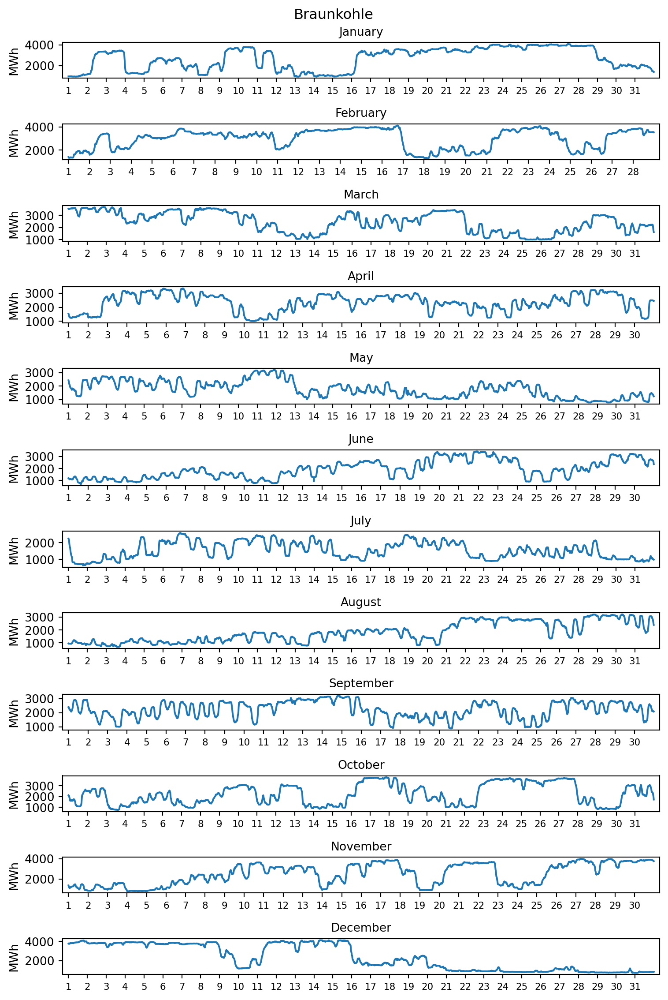

In [41]:
#| echo: false
#| fig-align: center
#| fig-cap: Jahresgang Biomasse
#| fig-alt: "Für jeden Monat stellen 12 Teilgrafiken die Stromerzeugung durch Braunkohle dar. Die Grafik entspricht dem zuvor in diesem Abschnitt gezeigten Jahresgang der Braunkohle."

import pandas as pd
import matplotlib.pyplot as plt

# Deklarieren der Anzahl der Nachkommastellen
pd.set_option("display.precision", 2)

# Datensätze werden eingelesen

# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !

# erzeugung0_ms = pd.read_csv("skript/01-daten/Realisierte_Erzeugung_202301010000_202401010000_Viertelstunde.csv", \
# sep = ";", thousands = ".", decimal = ",", parse_dates =  [0, 1], date_format = "%d.%m.%Y %H:%M")

# # Zeichenkette " Originalauflösungen" entfernen
# erzeugung0_ms.columns = erzeugung0_ms.columns.str.replace(pat = " Originalauflösungen", repl = "")

# print(erzeugung0_ms.head(10))

# # Daten der zu betrachtenden Erzeugungsarten nach Tag gruppieren und durch Mittelwertbildung auf Tagesbasis aggregieren
# braunkohle_daily_ms = erzeugung0_ms['Braunkohle [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()
# biomasse_daily_ms = erzeugung0_ms['Biomasse [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()

# # Liniendiagramm plotten
# linienstärke = 5
# plt.figure(figsize = (8, 4))

# braunkohle_daily_ms = braunkohle_daily_ms.sort_values(ascending = False, ignore_index = True)
# braunkohle_daily_ms.index += 1
# braunkohle_daily_ms.plot.line(lw = linienstärke, color = 'brown', alpha = 0.5, label = 'Braunkohle')

# biomasse_daily_ms = biomasse_daily_ms.sort_values(ascending = False, ignore_index = True)
# biomasse_daily_ms.index += 1
# biomasse_daily_ms.plot.line(lw = linienstärke, color = 'greenyellow', alpha = 0.5, label = 'Biomasse')

# plt.title(label = "sortierte Jahresdauerlinie für ausgewählte Erzeuger")
# plt.grid()
# plt.legend()
# plt.ylabel('durchschnittliche Stromerzeugung in MWh\n(auf Viertelstundenbasis)')
# plt.xlabel('Anzahl Tage pro Jahr')

# plt.margins(x = 0.02)

# Lastgang: Hier den Erzeugungstyp auswählen, je nachdem, welcher Lastgang geplottet werden soll. Der andere wird auskommentiert
#erzeuger = "Biomasse"
erzeuger = "Braunkohle"

fig = plt.figure(figsize = (8, 12))
fig.suptitle(erzeuger, fontsize = 12)
for i in range(1, 13):
  plotting_data_monthly = erzeugung0_ms[erzeugung0_ms['Datum von'].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MWh")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

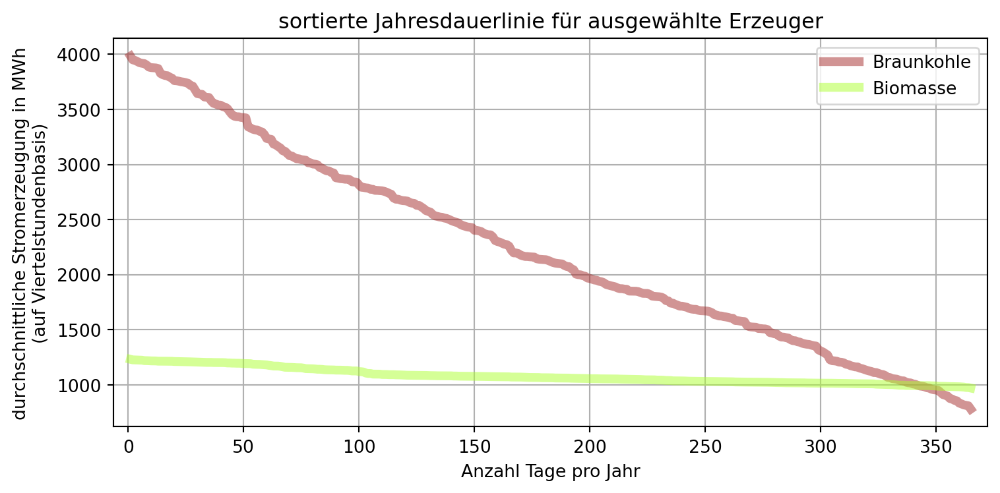

In [42]:
#| echo: false
#| fig-align: center
#| fig-cap: Sortierte Jahresdauerlinien für ausgewählte Erzeuger
#| fig-alt: "Dargestellt werden die sortierten Jahresdauerlinien für Braunkohle und Biomasse. Die sortierte Jahresdauerlinie der Braunkohle entspricht der in diesem Abschnitt zuvor gezeigten (fast liniear abfallend). Dagegen verläuft die sortierte Jahresdauerlinie der Biomasse fast parallel zur x-Achse, was auf eine konstant hohe Erzeugung hinweist."

import pandas as pd
import matplotlib.pyplot as plt

# Deklarieren der Anzahl der Nachkommastellen
pd.set_option("display.precision", 2)

# Datensätze werden eingelesen

# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !

# erzeugung0_ms = pd.read_csv("skript/01-daten/Realisierte_Erzeugung_202301010000_202401010000_Viertelstunde.csv", \
# sep = ";", thousands = ".", decimal = ",", parse_dates =  [0, 1], date_format = "%d.%m.%Y %H:%M")

# # Zeichenkette " Originalauflösungen" entfernen
# erzeugung0_ms.columns = erzeugung0_ms.columns.str.replace(pat = " Originalauflösungen", repl = "")

# print(erzeugung0_ms.head(10))

# Daten der zu betrachtenden Erzeugungsarten nach Tag gruppieren und durch Mittelwertbildung auf Tagesbasis aggregieren
braunkohle_daily_ms = erzeugung0_ms['Braunkohle [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()
biomasse_daily_ms = erzeugung0_ms['Biomasse [MWh]'].groupby(erzeugung0_ms["Datum von"].dt.dayofyear).mean()

# Liniendiagramm plotten
linienstärke = 5
plt.figure(figsize = (8, 4))

braunkohle_daily_ms = braunkohle_daily_ms.sort_values(ascending = False, ignore_index = True)
braunkohle_daily_ms.index += 1
braunkohle_daily_ms.plot.line(lw = linienstärke, color = 'brown', alpha = 0.5, label = 'Braunkohle')

biomasse_daily_ms = biomasse_daily_ms.sort_values(ascending = False, ignore_index = True)
biomasse_daily_ms.index += 1
biomasse_daily_ms.plot.line(lw = linienstärke, color = 'greenyellow', alpha = 0.5, label = 'Biomasse')

plt.title(label = "sortierte Jahresdauerlinie für ausgewählte Erzeuger")
plt.grid()
plt.legend()
plt.ylabel('durchschnittliche Stromerzeugung in MWh\n(auf Viertelstundenbasis)')
plt.xlabel('Anzahl Tage pro Jahr')

plt.margins(x = 0.02)

# # Lastgang: Hier den Erzeugungstyp auswählen, je nachdem, welcher Lastgang geplottet werden soll. Der andere wird auskommentiert
# erzeuger = "Biomasse"
# #erzeuger = "Braunkohle"

# fig = plt.figure(figsize = (8, 12))
# fig.suptitle(erzeuger, fontsize = 12)
# for i in range(1, 13):
#   plotting_data_monthly = erzeugung0_ms[erzeugung0_ms['Datum von'].dt.month == i]
#   ax = fig.add_subplot(12, 1, i)
#   ax.plot(plotting_data_monthly[erzeuger + " [MWh]"])
#   plt.margins(x = 0.01)
#   ax.set_ylabel(ylabel = "MWh")
 
#   # Titel erzeugen
#   plt.title(label = plotting_data_monthly['Datum von'].head(1).dt.strftime('%B').item(), fontsize = 10)
  
#   # xticks erzeugen
#   tage_index = plotting_data_monthly[~plotting_data_monthly["Datum von"].dt.day.duplicated()].index
#   tagesnamen = plotting_data_monthly["Datum von"].dt.day.unique() 
#   plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

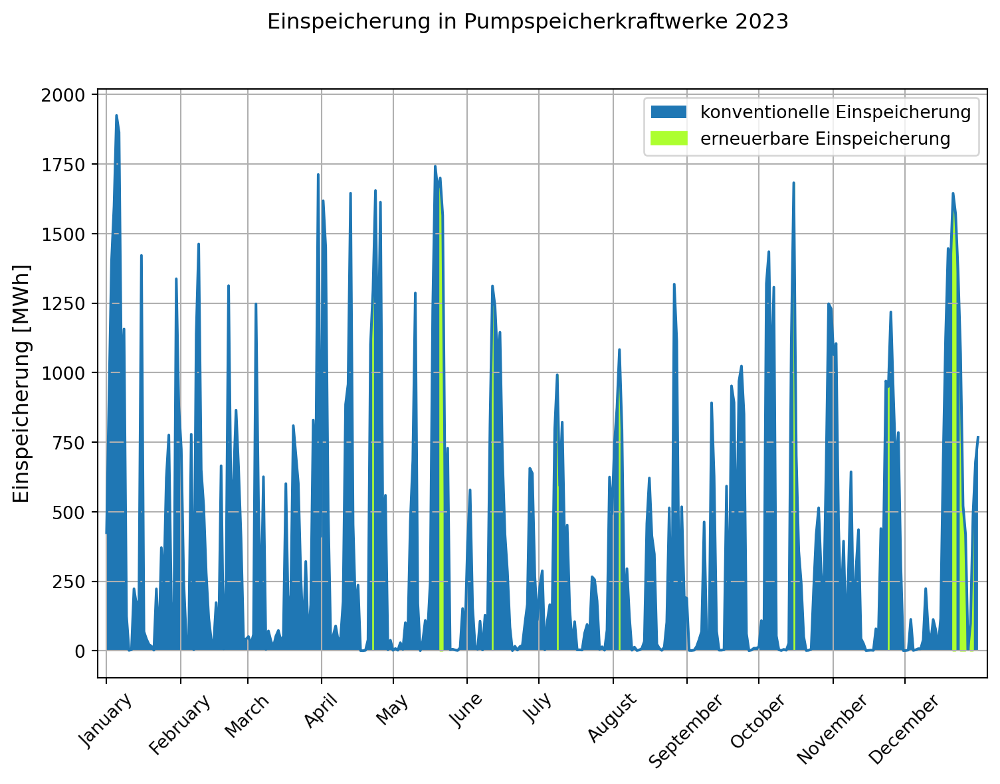

In [43]:
#| echo: false
#| fig-alt: "Dargestellt ist der Jahresgang der Einspeicherung in Pumpspeicherkraftwerke. Farblich unterschieden sind dabei die stark überwiegenden Phasen konventioneller Einspeicherung durch Kraftwerke im Lastfolgebetrieb und seltene Phasen erneuerbarer Einspeicherung. Eine erneuerbare Einspeicherung fand fast ausschließlich während der Weihnachtsfeiertage statt."
#| fig-cap: Einspeicherung in Pumpspeicherkraftwerke 2023

# Restlast berechnen
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]', 'Sonstige Erneuerbare [MWh]']

restlast = pd.DataFrame()
restlast["Netzlast [MWh]"] = verbrauch["Gesamt (Netzlast) [MWh]"].copy() 
restlast["Erneuerbare [MWh]"] = erzeugung[erneuerbare].sum(axis = "columns").copy()
restlast["Restlast [MWh]"] = restlast["Netzlast [MWh]"] - restlast["Erneuerbare [MWh]"]
restlast = restlast["Restlast [MWh]"]

# xticks berechnen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# plotten jedes n. Werts
schritt = 100
verbrauch['Pumpspeicher [MWh]'][::schritt].plot(figsize = (9, 6), xlim = (verbrauch.index.min() - (len(verbrauch.index) / 100), verbrauch.index.max() * 1.01), rot = 45, grid = True, label = "")
plt.ylabel('Einspeicherung [MWh]', fontsize = 12)
plt.suptitle('Einspeicherung in Pumpspeicherkraftwerke 2023')

# xticks eintragen
plt.minorticks_off()
plt.xticks(monate_index, monatsnamen);

# Kurve unterlegen: plt.fill_between bietet einen praktischen Parameter where
plt.fill_between(x = verbrauch['Pumpspeicher [MWh]'].index[::schritt], y1 = verbrauch['Pumpspeicher [MWh]'][::schritt], label = 'konventionelle Einspeicherung') # , where = restlast[::schritt] > 0 führt zu weißen Stellen
plt.fill_between(x = verbrauch['Pumpspeicher [MWh]'].index[::schritt], y1 = verbrauch['Pumpspeicher [MWh]'][::schritt], where = restlast[::schritt] <= 0, color = 'greenyellow', label = 'erneuerbare Einspeicherung')

plt.legend()
plt.show()

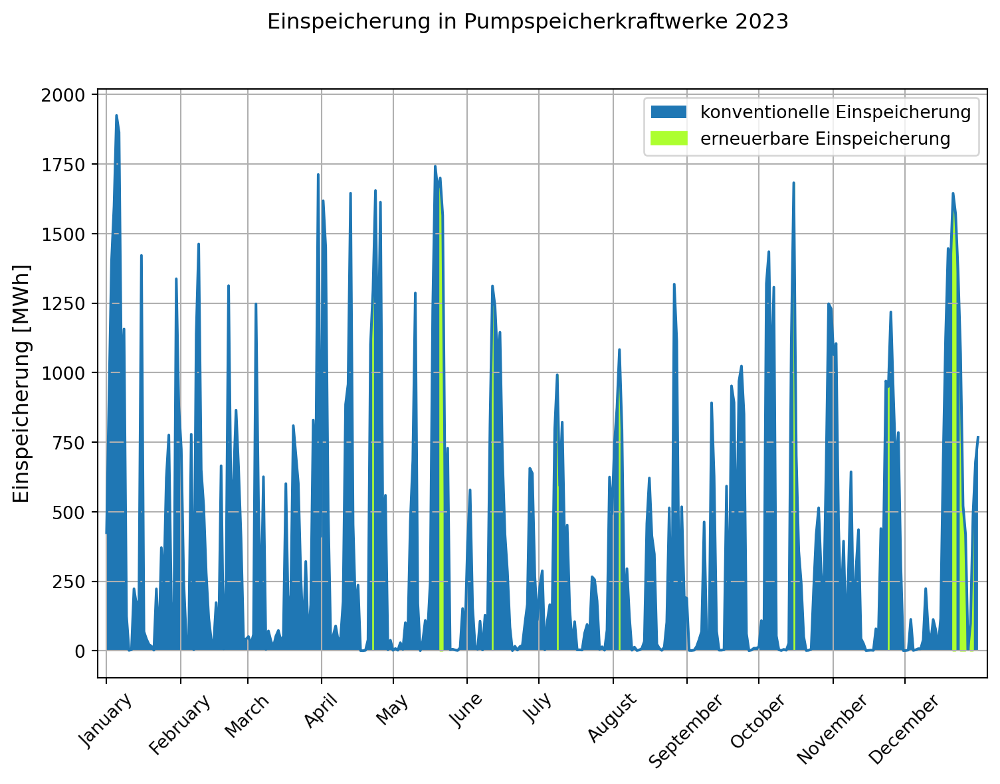

In [44]:
#| output: false

# Restlast berechnen
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]', 'Sonstige Erneuerbare [MWh]']

restlast = pd.DataFrame()
restlast["Netzlast [MWh]"] = verbrauch["Gesamt (Netzlast) [MWh]"].copy() 
restlast["Erneuerbare [MWh]"] = erzeugung[erneuerbare].sum(axis = "columns").copy()
restlast["Restlast [MWh]"] = restlast["Netzlast [MWh]"] - restlast["Erneuerbare [MWh]"]
restlast = restlast["Restlast [MWh]"]

# xticks berechnen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# plotten jedes n. Werts
schritt = 100
verbrauch['Pumpspeicher [MWh]'][::schritt].plot(figsize = (9, 6), xlim = (verbrauch.index.min() - (len(verbrauch.index) / 100), verbrauch.index.max() * 1.01), rot = 45, grid = True, label = "")
plt.ylabel('Einspeicherung [MWh]', fontsize = 12)
plt.suptitle('Einspeicherung in Pumpspeicherkraftwerke 2023')

# xticks eintragen
plt.minorticks_off()
plt.xticks(monate_index, monatsnamen);

# Kurve unterlegen: plt.fill_between bietet einen praktischen Parameter where
plt.fill_between(x = verbrauch['Pumpspeicher [MWh]'].index[::schritt], y1 = verbrauch['Pumpspeicher [MWh]'][::schritt], label = 'konventionelle Einspeicherung') # , where = restlast[::schritt] > 0 führt zu weißen Stellen
plt.fill_between(x = verbrauch['Pumpspeicher [MWh]'].index[::schritt], y1 = verbrauch['Pumpspeicher [MWh]'][::schritt], where = restlast[::schritt] <= 0, color = 'greenyellow', label = 'erneuerbare Einspeicherung')

plt.legend()
plt.show()

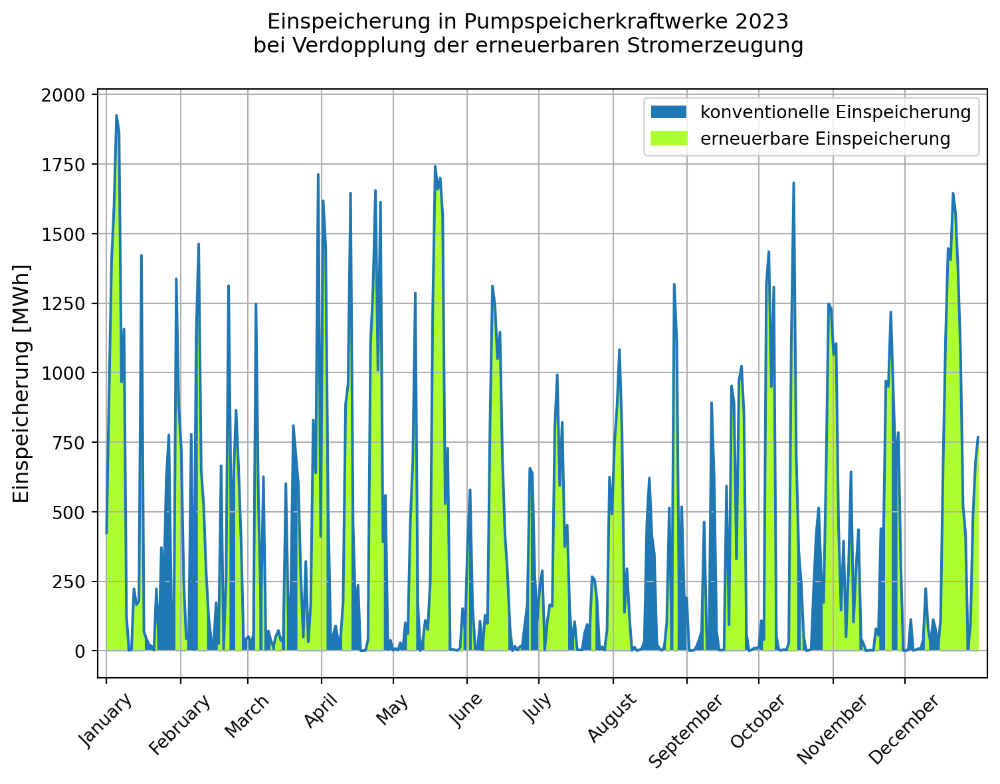

In [45]:
#| echo: false
#| fig-alt: "Dargestellt ist der Jahresgang der Einspeicherung in Pumpspeicherkraftwerke bei Verdopplung der erneuerbaren Stromproduktion. Farblich unterschieden sind dabei die Phasen konventioneller Einspeicherung durch Kraftwerke im Lastfolgebetrieb und deutlich häufigere Phasen erneuerbarer Einspeicherung."
#| fig-cap: Einspeicherung in Pumpspeicherkraftwerke 2023

# Restlast berechnen
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]', 'Sonstige Erneuerbare [MWh]']

restlast = pd.DataFrame()
restlast["Netzlast [MWh]"] = verbrauch["Gesamt (Netzlast) [MWh]"].copy() 
restlast["Erneuerbare [MWh]"] = erzeugung[erneuerbare].sum(axis = "columns").copy()
restlast["Restlast [MWh]"] = restlast["Netzlast [MWh]"] - 2 * restlast["Erneuerbare [MWh]"]
restlast = restlast["Restlast [MWh]"]

# xticks berechnen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# plotten jedes n. Werts
schritt = 100
verbrauch['Pumpspeicher [MWh]'][::schritt].plot(figsize = (9, 6), xlim = (verbrauch.index.min() - (len(verbrauch.index) / 100), verbrauch.index.max() * 1.01), rot = 45, grid = True, label = "")
plt.ylabel('Einspeicherung [MWh]', fontsize = 12)
plt.suptitle('Einspeicherung in Pumpspeicherkraftwerke 2023\nbei Verdopplung der erneuerbaren Stromerzeugung')

# xticks eintragen
plt.minorticks_off()
plt.xticks(monate_index, monatsnamen);

# Kurve unterlegen: plt.fill_between bietet einen praktischen Parameter where
plt.fill_between(x = verbrauch['Pumpspeicher [MWh]'].index[::schritt], y1 = verbrauch['Pumpspeicher [MWh]'][::schritt], label = 'konventionelle Einspeicherung') # , where = restlast[::schritt] > 0 führt zu weißen Stellen
plt.fill_between(x = verbrauch['Pumpspeicher [MWh]'].index[::schritt], y1 = verbrauch['Pumpspeicher [MWh]'][::schritt], where = restlast[::schritt] <= 0, color = 'greenyellow', label = 'erneuerbare Einspeicherung')

plt.legend()
plt.show()

In [46]:
erzeugung_austria = pd.read_csv(filepath_or_buffer = "skript/01-daten/AGPT_2022-12-31T23_00_00Z_2023-12-31T23_00_00Z_15M_de_2024-06-10T09_32_38Z.csv",
                            sep = ";", decimal = ",", thousands = ".")

# string replace & als Datum einlesen
## Spalte Zeit von [CET/CEST]
erzeugung_austria['Zeit von [CET/CEST]'] = erzeugung_austria['Zeit von [CET/CEST]'].str.replace(pat = '2A', repl = '02')
erzeugung_austria['Zeit von [CET/CEST]'] = erzeugung_austria['Zeit von [CET/CEST]'].str.replace(pat = '2B', repl = '02')

erzeugung_austria['Zeit von [CET/CEST]'] = pd.to_datetime(erzeugung_austria['Zeit von [CET/CEST]'], format = "%d.%m.%Y %H:%M:%S")

## Spalte Zeit bis [CET/CEST]
erzeugung_austria['Zeit bis [CET/CEST]'] = erzeugung_austria['Zeit bis [CET/CEST]'].str.replace(pat = '2A', repl = '02')
erzeugung_austria['Zeit bis [CET/CEST]'] = erzeugung_austria['Zeit bis [CET/CEST]'].str.replace(pat = '2B', repl = '02')

erzeugung_austria['Zeit bis [CET/CEST]'] = pd.to_datetime(erzeugung_austria['Zeit bis [CET/CEST]'], format = "%d.%m.%Y %H:%M:%S")

print(erzeugung_austria.dtypes)

Zeit von [CET/CEST]             datetime64[ns]
Zeit bis [CET/CEST]             datetime64[ns]
Wind [MW]                              float64
Solar [MW]                             float64
Biomasse [MW]                          float64
Gas [MW]                               float64
Kohle [MW]                             float64
Öl [MW]                                float64
Geothermie [MW]                        float64
Pumpspeicher [MW]                      float64
Lauf- und Schwellwasser [MW]           float64
Speicher [MW]                          float64
Sonstige Erneuerbare [MW]              float64
Müll [MW]                              float64
Andere [MW]                            float64
dtype: object


Zeit von [CET/CEST]             datetime64[ns]
Zeit bis [CET/CEST]             datetime64[ns]
Wind [MW]                              float64
Solar [MW]                             float64
Biomasse [MW]                          float64
Gas [MW]                               float64
Kohle [MW]                             float64
Öl [MW]                                float64
Geothermie [MW]                        float64
Pumpspeicher [MW]                      float64
Lauf- und Schwellwasser [MW]           float64
Speicher [MW]                          float64
Sonstige Erneuerbare [MW]              float64
Müll [MW]                              float64
Andere [MW]                            float64
dtype: object
  Zeit von [CET/CEST] Zeit bis [CET/CEST]  Wind [MW]  Solar [MW]  \
0 2023-01-01 00:00:00 2023-01-01 00:15:00     1000.0         0.0   
1 2023-01-01 00:15:00 2023-01-01 00:30:00      964.0         0.0   
2 2023-01-01 00:30:00 2023-01-01 00:45:00      956.0         0.0   
3 2023-01

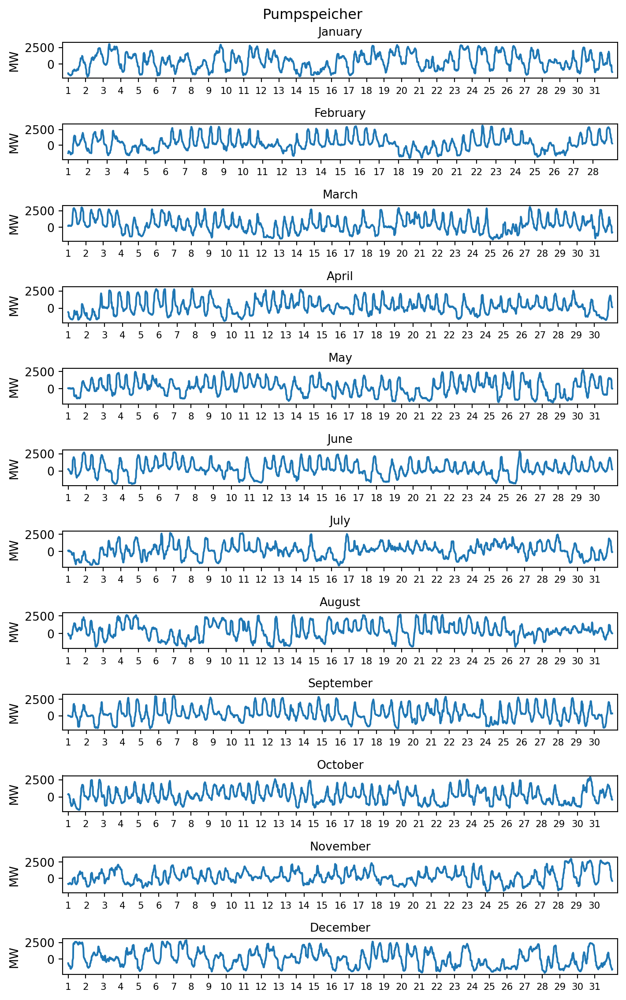

In [47]:
#| output: false

import pandas as pd
import matplotlib.pyplot as plt

# Deklarieren der Anzahl der Nachkommastellen
pd.set_option("display.precision", 2)

# Datensatz wird eingelesen und in der Variable erzeugung0_austria_ms gespeichert

# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !
erzeugung0_austria_ms = pd.read_csv("aufgaben/01-daten/AGPT_2022-12-31T23_00_00Z_2023-12-31T23_00_00Z_15M_de_2024-06-10T09_32_38Z.csv", 
                                     sep = ";", thousands = ".", decimal = ",", parse_dates = [0, 1], date_format = "%d.%m.%Y %H:%M")
                                     
# string replace & als Datum einlesen
## Spalte Zeit von [CET/CEST]
erzeugung0_austria_ms['Zeit von [CET/CEST]'] = erzeugung0_austria_ms['Zeit von [CET/CEST]'].str.replace(pat = '2A', repl = '02')
erzeugung0_austria_ms['Zeit von [CET/CEST]'] = erzeugung0_austria_ms['Zeit von [CET/CEST]'].str.replace(pat = '2B', repl = '02')

erzeugung0_austria_ms['Zeit von [CET/CEST]'] = pd.to_datetime(erzeugung0_austria_ms['Zeit von [CET/CEST]'], format = "%d.%m.%Y %H:%M:%S")

## Spalte Zeit bis [CET/CEST]
erzeugung0_austria_ms['Zeit bis [CET/CEST]'] = erzeugung0_austria_ms['Zeit bis [CET/CEST]'].str.replace(pat = '2A', repl = '02')
erzeugung0_austria_ms['Zeit bis [CET/CEST]'] = erzeugung0_austria_ms['Zeit bis [CET/CEST]'].str.replace(pat = '2B', repl = '02')

erzeugung0_austria_ms['Zeit bis [CET/CEST]'] = pd.to_datetime(erzeugung0_austria_ms['Zeit bis [CET/CEST]'], format = "%d.%m.%Y %H:%M:%S")

print(erzeugung0_austria_ms.dtypes)
print(erzeugung0_austria_ms.head(10))

# Kopie des Datensatzes wird angelegt
erzeugung_c_austria_ms = erzeugung0_austria_ms.copy()

plotting_data_ms = erzeugung_c_austria_ms.copy()

erzeuger = "Pumpspeicher"

fig = plt.figure(figsize = (7.5, 12))
fig.suptitle(erzeuger, fontsize = 12)

for i in range(1, 13):
  plotting_data_monthly_ms = plotting_data_ms[plotting_data_ms["Zeit von [CET/CEST]"].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly_ms[erzeuger + " [MW]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MW")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly_ms["Zeit von [CET/CEST]"].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly_ms[~plotting_data_monthly_ms["Zeit von [CET/CEST]"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly_ms["Zeit von [CET/CEST]"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

Zeit von [CET/CEST]             datetime64[ns]
Zeit bis [CET/CEST]             datetime64[ns]
Wind [MW]                              float64
Solar [MW]                             float64
Biomasse [MW]                          float64
Gas [MW]                               float64
Kohle [MW]                             float64
Öl [MW]                                float64
Geothermie [MW]                        float64
Pumpspeicher [MW]                      float64
Lauf- und Schwellwasser [MW]           float64
Speicher [MW]                          float64
Sonstige Erneuerbare [MW]              float64
Müll [MW]                              float64
Andere [MW]                            float64
dtype: object
  Zeit von [CET/CEST] Zeit bis [CET/CEST]  Wind [MW]  Solar [MW]  \
0 2023-01-01 00:00:00 2023-01-01 00:15:00     1000.0         0.0   
1 2023-01-01 00:15:00 2023-01-01 00:30:00      964.0         0.0   
2 2023-01-01 00:30:00 2023-01-01 00:45:00      956.0         0.0   
3 2023-01

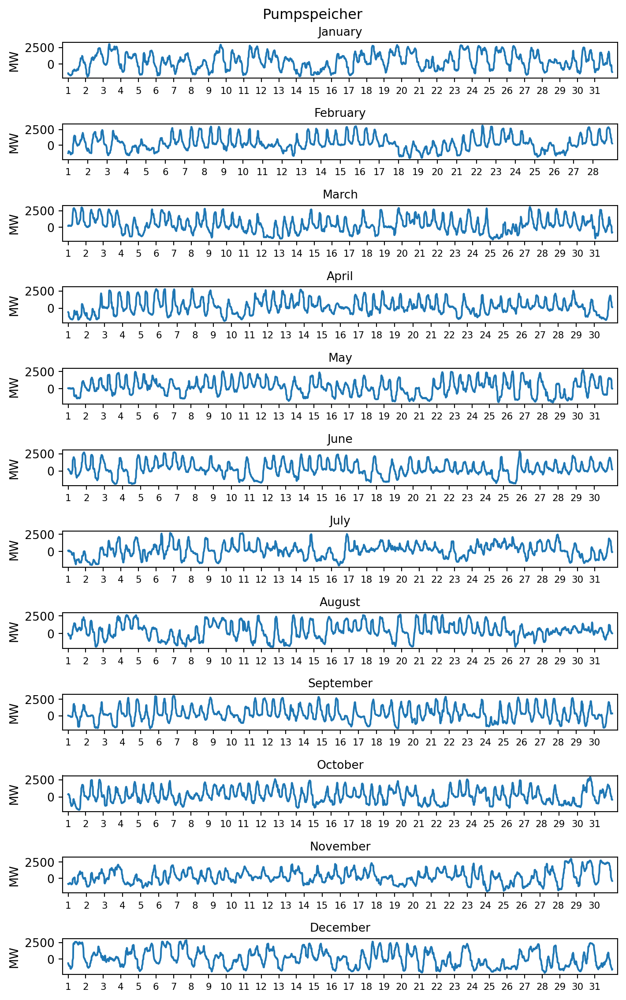

In [48]:
#| echo: false
#| fig-align: center
#| fig-cap: Jahresgang der Pumpspeicher in Österreich 2023 
#| fig-alt: "In 12 Teilgrafiken ist monatsweise der Jahresgang der Pumpspeicher in Österreich im Jahr 2023 dargestellt. Auf der x-Achse sind die Tage jedes Monats abgetragen, auf der y-Achse die ein- bzw. ausgespeicherte Leistung. Die Leistungskurve ist sehr volatil. An vielen Tagen liefern die Pumpspeicher Leistungen nahe des Maximums im Bereich von 2500 MW, die aber nur stundenweise erreicht werden. Regelmäßig werden negative Leistungen im Bereich von 1000 MW erreicht, d. h. die Pumpsspeicher pumpen Wasser in die Speicherbecken. Leistungsniveaus von Null oder negative Leistungen werden während der Wintermonate tendenziell während der Nachtstunden erreicht, während des Sommers eher gegen den Mittag."

# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !
erzeugung0_austria_ms = pd.read_csv("aufgaben/01-daten/AGPT_2022-12-31T23_00_00Z_2023-12-31T23_00_00Z_15M_de_2024-06-10T09_32_38Z.csv", 
                                     sep = ";", thousands = ".", decimal = ",", parse_dates = [0, 1], date_format = "%d.%m.%Y %H:%M")
                                     
# string replace & als Datum einlesen
## Spalte Zeit von [CET/CEST]
erzeugung0_austria_ms['Zeit von [CET/CEST]'] = erzeugung0_austria_ms['Zeit von [CET/CEST]'].str.replace(pat = '2A', repl = '02')
erzeugung0_austria_ms['Zeit von [CET/CEST]'] = erzeugung0_austria_ms['Zeit von [CET/CEST]'].str.replace(pat = '2B', repl = '02')

erzeugung0_austria_ms['Zeit von [CET/CEST]'] = pd.to_datetime(erzeugung0_austria_ms['Zeit von [CET/CEST]'], format = "%d.%m.%Y %H:%M:%S")

## Spalte Zeit bis [CET/CEST]
erzeugung0_austria_ms['Zeit bis [CET/CEST]'] = erzeugung0_austria_ms['Zeit bis [CET/CEST]'].str.replace(pat = '2A', repl = '02')
erzeugung0_austria_ms['Zeit bis [CET/CEST]'] = erzeugung0_austria_ms['Zeit bis [CET/CEST]'].str.replace(pat = '2B', repl = '02')

erzeugung0_austria_ms['Zeit bis [CET/CEST]'] = pd.to_datetime(erzeugung0_austria_ms['Zeit bis [CET/CEST]'], format = "%d.%m.%Y %H:%M:%S")

print(erzeugung0_austria_ms.dtypes)
print(erzeugung0_austria_ms.head(10))

# Kopie des Datensatzes wird angelegt
erzeugung_c_austria_ms = erzeugung0_austria_ms.copy()

plotting_data_ms = erzeugung_c_austria_ms.copy()

erzeuger = "Pumpspeicher"

fig = plt.figure(figsize = (7.5, 12))
fig.suptitle(erzeuger, fontsize = 12)

for i in range(1, 13):
  plotting_data_monthly_ms = plotting_data_ms[plotting_data_ms["Zeit von [CET/CEST]"].dt.month == i]
  ax = fig.add_subplot(12, 1, i)
  ax.plot(plotting_data_monthly_ms[erzeuger + " [MW]"])
  plt.margins(x = 0.01)
  ax.set_ylabel(ylabel = "MW")
 
  # Titel erzeugen
  plt.title(label = plotting_data_monthly_ms["Zeit von [CET/CEST]"].head(1).dt.strftime('%B').item(), fontsize = 10)
  
  # xticks erzeugen
  tage_index = plotting_data_monthly_ms[~plotting_data_monthly_ms["Zeit von [CET/CEST]"].dt.day.duplicated()].index
  tagesnamen = plotting_data_monthly_ms["Zeit von [CET/CEST]"].dt.day.unique() 
  plt.xticks(tage_index, tagesnamen, fontsize = 8)

plt.tight_layout()
plt.show()

In [49]:
print(f"Wind an Land 2030:\t{( zubaufaktor_windonshore_2030 := 115 / (installierte_leistung['Wind Onshore [MW]'].sum() / 1000) ):,.2f}\n"
      f"Wind auf See 2030:\t{( zubaufaktor_windoffshore_2030 := 30 / (installierte_leistung['Wind Offshore [MW]'].sum() / 1000) ):,.2f}\n"
      f"Solar 2030:\t\t\t{( zubaufaktor_solar_2030 := 215 / (installierte_leistung['Photovoltaik [MW]'].sum() / 1000) ):,.2f}\n"
      f"Biomasse 2030:\t\t{8.4 / (installierte_leistung['Biomasse [MW]'].sum() / 1000):,.2f}")

print(f"\n\nWind an Land 2035:\t{( zubaufaktor_windonshore_2035 := 157 / (installierte_leistung['Wind Onshore [MW]'].sum() / 1000) ):,.2f}\n"
      f"Wind auf See 2035:\t{( zubaufaktor_windoffshore_2035 := 40 / (installierte_leistung['Wind Offshore [MW]'].sum() / 1000) ):,.2f}\n"
      f"Solar 2035:\t\t\t{( zubaufaktor_solar_2035 := 309 / (installierte_leistung['Photovoltaik [MW]'].sum() / 1000) ):,.2f}\n"
      f"Biomasse 2035:\t\t{8.4 / (installierte_leistung['Biomasse [MW]'].sum() / 1000):,.2f}")

Wind an Land 2030:	2.00
Wind auf See 2030:	3.69
Solar 2030:			3.41
Biomasse 2030:		0.99


Wind an Land 2035:	2.73
Wind auf See 2035:	4.92
Solar 2035:			4.90
Biomasse 2035:		0.99


In [50]:
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]', 'Sonstige Erneuerbare [MWh]']

restlast = pd.DataFrame()
restlast["Netzlast [MWh]"] = verbrauch["Gesamt (Netzlast) [MWh]"].copy() 
restlast["Erneuerbare [MWh]"] = erzeugung[erneuerbare].sum(axis = "columns").copy()
restlast["Restlast [MWh]"] = restlast["Netzlast [MWh]"] - restlast["Erneuerbare [MWh]"]
restlast = restlast["Restlast [MWh]"]

In [51]:
pumpspeicherkapazität_MWh = 37.4 * 1000

In [52]:
import random as rd

random_data = []
for i in range(10):
  random_data.append(rd.randint(a = -20, b = 20))

random_data = pd.Series(random_data, dtype = 'float')
print(f"random_data: {list(random_data)}\nSumme random_data: {random_data.sum()}\n")

static_data = pd.Series([8, -14, -7, 1, 3, -6, 5, -20, -2, 12], dtype = 'float')

random_data: [0.0, 6.0, -3.0, 16.0, -16.0, -13.0, 19.0, -17.0, 19.0, -12.0]
Summe random_data: -1.0



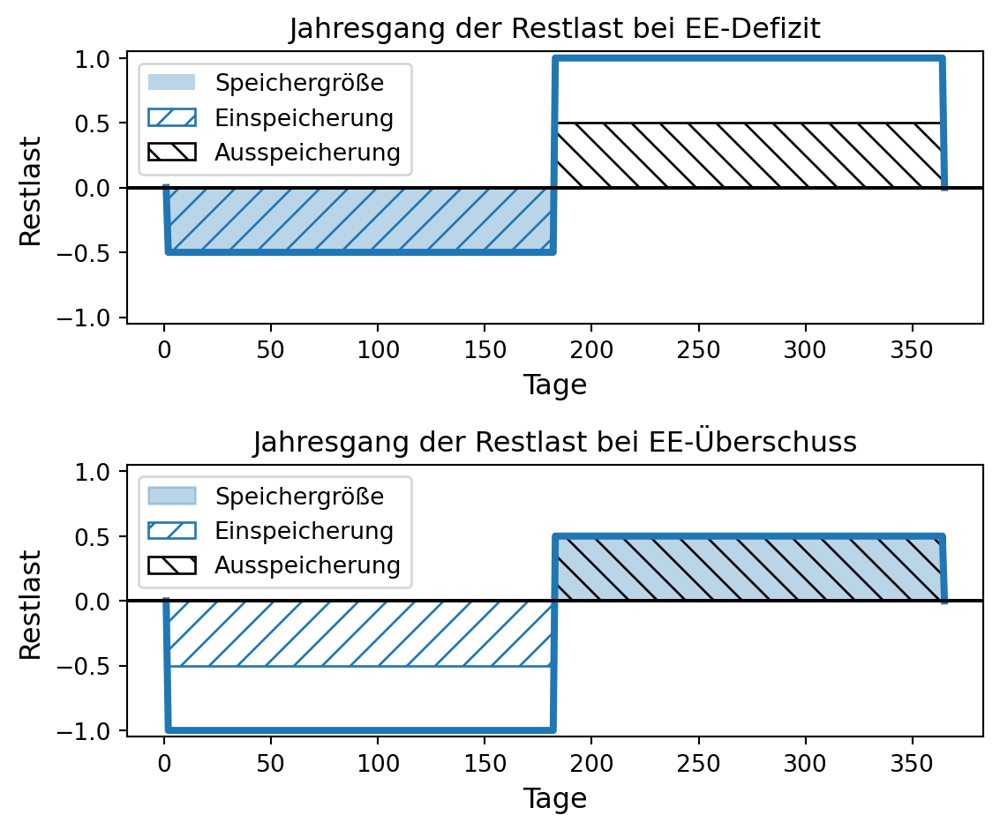

In [53]:
#| echo: false
#| fig-alt: "In zwei Grafiken sind zwei vereinfachte, aus je zwei Balken bestehende Restlastkurven im Jahresgang dargestellt. Auf der x-Achse sind die 365 Tage des Jahres dargestellt, auf der y-Achse die Restlast von minus 1 bis 1. In der oberen Grafik ist der Jahresgang bei einem Defizit erneuerbarer Energieerzeugung dargestellt. In der ersten Jahreshälfte ist die Restlast negativ in Höhe von minus 0.5, in der zweiten Jahreshälfte positiv in Höhe von 1. Dies ist durch jeweils einen Balken in entsprechender Höhe dargestellt. Der erste Balken mit den negativen Werten ist eingefärbt und nach links oben aufsteigend schraffiert. Die Färbung zeigt die erforderliche Speichergröße an, die aufsteigende Schraffierung die Phase der Einspeicherung. Der zweite Balken mit den positiven Werten ist bis zur halben Höhe 0.5 nach rechts unten absteigend schraffiert - dies zeigt die Phase der Ausspeicherung an. Der Bereich von 0.5 bis 1 ist unausgefüllt - dieser entspricht der durch Lastfolgekraftwerke zu bedienenden Restlast. In der unteren Grafik ist der Jahresgang bei einem Überschuss der erneuerbaren Energieerzeugung dargestellt. In der ersten Jahreshälfte ist die Restlast negativ in Höhe von minus 1, in der zweiten Jahreshälfte positiv in Höhe von 0.5. Der erste Balken mit den negativen Werten ist nicht eingefärbt und nur bis zur halben Höhe minus 0.5 zur Kennzeichnung der Einspeicherung aufsteigend schraffiert. Der zweite Balken mit den positiven Werten in Höhe von 0.5 ist zur Kennzeichnung der erforderlichen Speichergröße eingefärbt und zur kennzeichnung der Ausspeicherung absteigend schraffiert."

# plot Parameter setzen
## eventuell yticks vorgeben mit (my_yticks = [1, 0.5, 0, -0.5, -1])
my_bottom = -1.05
my_top = 1.05
my_linewidth = 3
my_title = 'Jahresgang der Restlast'
my_alpha = 0.3
my_color = 'C0'
my_label = 'Speichergröße'
my_xlabel = 'Tage'
my_ylabel = 'Restlast'
my_axislabel_fontsize = 12

# erneuerbare Unterproduktion
## dummy Daten erzeugen
dummy_index = np.linspace(1, 365, 365)
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-0.5, -0.5, 365 // 2 - 1), np.linspace(1, 1, 365 // 2), np.linspace(0, 0, 1)])

## plotten
plt.subplot(2, 1, 1)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

# plot the fill
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), alpha = my_alpha,  label = my_label)

# plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(0.5, 0.5, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title + ' bei EE-Defizit');
plt.legend()
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

# erneuerbare Überproduktion
## dummy Daten erzeugen
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-1, -1, 365 // 2 - 1), np.linspace(0.5, 0.5, 365 // 2), np.linspace(0, 0, 1)])

## plotten
plt.subplot(2, 1, 2)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

# plot the fill
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(0.5, 0.5, 365 // 2), color = my_color, alpha = my_alpha, label = my_label)

# plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(0.5, 0.5, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title + ' bei EE-Überschuss');
plt.legend()
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

plt.tight_layout()
plt.show()

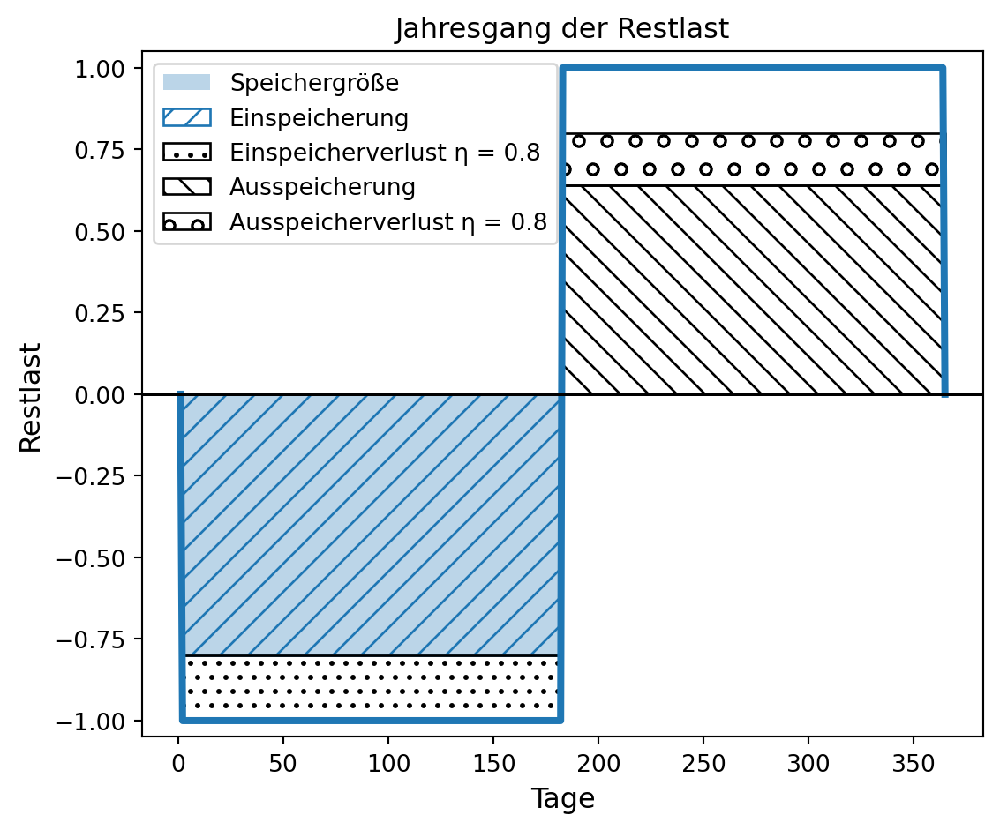

In [54]:
#| echo: false
#| fig-alt: "Eine Grafik zeigt mit zwei Balken einen vereinfachten Jahresgang der Restlast mit Ein- und Ausspeicherwirkungsgrad. Auf der x-Achse sind die 365 Tage des Jahres dargestellt, auf der y-Achse die Restlast von minus 1 bis 1. In der ersten Jahreshälfte ist die Restlast negativ in Höhe von minus 1, in der zweiten Jahreshälfte positiv in Höhe von 1. Der erste Balken mit den negativen Werten ist bis zu einer Höhe von minus 0.8 gefärbt und aufsteigend schraffiert, um die Speichergröße und die Phase der Einspeicherung zu kennzeichnen. Der Bereich von minus 0.8 bis minus 1 ist gepunktet, was die Einspeicherverluste bei einem Wirkungsgrad von 0.8 kennzeichnet. Der zweite Balken mit den positiven Werten ist bis zu einer Höhe von 0.64 absteigend schraffiert, um die Phase der Ausspeicherung zu kennzeichnen. Der Bereich von 0.64 bis 0.8 ist großgepunktet, um die Ausspeicherverluste bei einem Wirkungsgrad von 0.8 zu kennzeichnen. Die Fläche von 0.8 bis 1 ist ungekennzeichnet weiß und entspricht, ebenso wie der Bereich der Ausspeicherverluste, der durch Lastfolgekraftwerke zu bedienenden Restlast."

# Ein- und Ausspeicherwirkungsgrad
## dummy Daten erzeugen
dummy_index = np.linspace(1, 365, 365)
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-1, -1, 365 // 2 - 1), np.linspace(1, 1, 365 // 2), np.linspace(0, 0, 1)])

## plotten
# plt.subplot(2, 1, 1)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

# plot the fill
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-0.8, -0.8, 365 // 2), alpha = my_alpha,  label = my_label)

# plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-0.8, -0.8, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-0.8, -0.8, 365 // 2), y2 = np.linspace(-1, -1, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = '..', label = 'Einspeicherverlust η = 0.8')

plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(0.64, 0.64, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(0.64, 0.64, 365 // 2), y2 = np.linspace(0.8, 0.8, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = 'o', label = 'Ausspeicherverlust η = 0.8')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title);
plt.legend()
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

plt.tight_layout()
plt.show()

In [55]:
# EE-Überschuss feststellen
## Eingabe: data = pd.Series(data, dtype = 'float')
## Verarbeitung: über die pd.Series wird die Summe gebildet
## Ausgabe: zurückgegeben wird der Wahrheitswert von data.sum() < 0

def prüfe_EE_Überschuss(data):
  
  return data.sum() < 0

prüfe_EE_Überschuss(restlast)

np.False_

In [56]:
# EE-Überschuss feststellen, gegeben einen Ein- und Ausspeicherungswirkungsgrad
## Eingabe: data = pd.Series(data, dtype = 'float'), einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1
## Verarbeitung: Werte kleiner 0 werden mit dem Einspeicherwirkungsgrad multipliziert
## Verarbeitung: Werte größer 0 werden durch den Ausspeicherwirkungsgrad geteilt
## Verarbeitung: über die pd.Series wird die Summe gebildet
## Ausgabe: zurückgegeben wird der Wahrheitswert von data_wirkungsgrad_bereinigt.sum() < 0

def prüfe_EE_Überschuss(data, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1):
  data_wirkungsgrad_bereinigt = data.copy()

  data_wirkungsgrad_bereinigt[data_wirkungsgrad_bereinigt < 0] = data_wirkungsgrad_bereinigt[data_wirkungsgrad_bereinigt < 0] * einspeicherwirkungsgrad
  data_wirkungsgrad_bereinigt[data_wirkungsgrad_bereinigt > 0] = data_wirkungsgrad_bereinigt[data_wirkungsgrad_bereinigt > 0] / ausspeicherwirkungsgrad
  
  return data_wirkungsgrad_bereinigt.sum() < 0

prüfe_EE_Überschuss(restlast, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.9)

np.False_

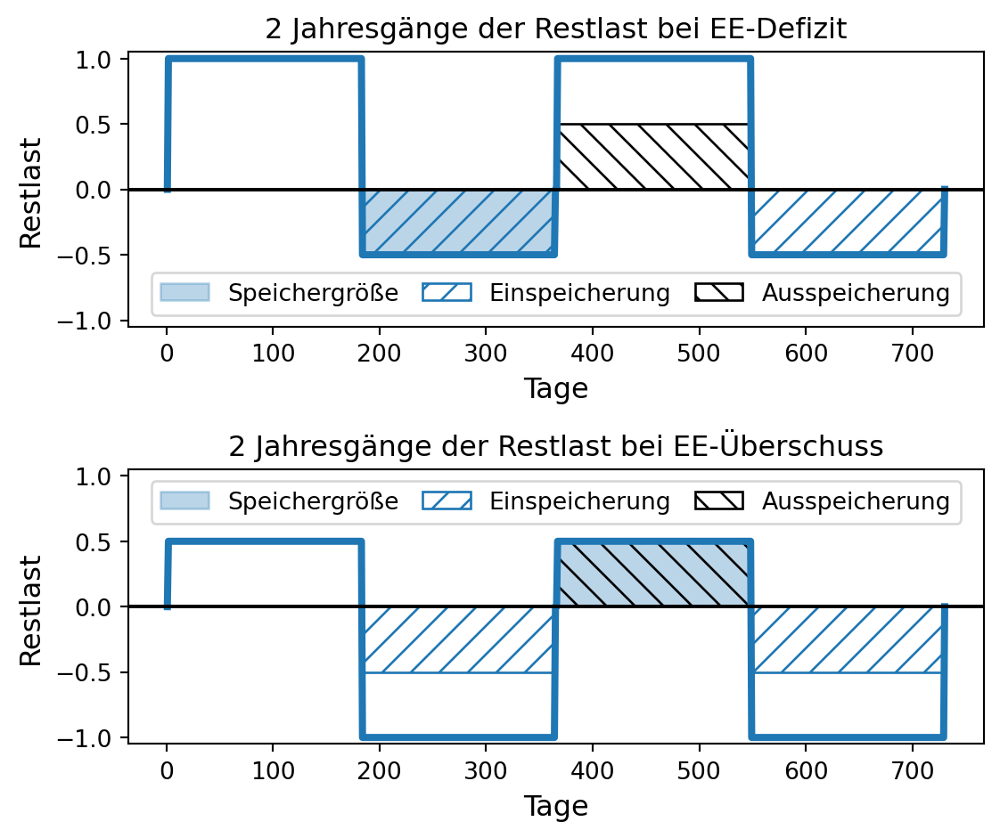

In [57]:
#| echo: false
#| fig-alt: "In zwei Grafiken sind zwei vereinfachte, aus je vier Balken bestehende Restlastkurven für zwei aufeinanderfolgende Jahresgänge dargestellt. Auf der x-Achse sind die 730 Tage der zwei aufeinanderfolgenden Jahre dargestellt, auf der y-Achse die Restlast von minus 1 bis 1. In der oberen Grafik ist der Zweijahresgang der Restlast bei einem Defizit an erneuerbarer Überschussproduktion dargestellt. Im ersten Halbjahr beträgt die positive Restlast 1, die noch nicht durch eingespeicherten Strom gedeckt werden kann. Im zweiten Halbjahr beträgt die Restlast minus 0.5. Dieser Balken ist eingefärbt und aufsteigend schraffiert. Die Färbung zeigt die erforderliche Speichergröße an, die aufsteigende Schraffierung die Phase der Einspeicherung. Im zweiten Jahr wiederholt sich der Jahresgang. Im dritten Halbjahr beträgt die positive Restlast somit erneut 1. Der dritte Balken mit den positiven Werten in Höhe von 1 ist bis zur halben Höhe 0.5 nach rechts unten absteigend schraffiert - dies zeigt die Phase der Ausspeicherung an. Der Bereich von 0.5 bis 1 ist unausgefüllt - dieser entspricht der durch Lastfolgekraftwerke zu bedienenden Restlast. Im vierten Halbjahr beträgt die negative Restlast erneut minus 0.5. Der Balken ist aufsteigend schraffiert, um die erneute Einspeicherung in den Speicher anzuzeigen. In der unteren Grafik ist der Zweijahresgang der Restlast bei einem Überschuss an erneuerbarer Überschussproduktion dargestellt. Im ersten Halbjahr beträgt die positive Restlast 0.5, die noch nicht durch eingespeicherten Strom gedeckt werden kann. Im zweiten Halbjahr beträgt die Restlast minus 1. Dieser Balken ist bis zur Höhe minus 0.5 aufsteigend schraffiert, um die Phase der Einspeicherung zu kennzeichnen. Der Bereich von minus 0.5 bis minus 1 ist unmarkiert weiß, dieser entspricht dem ungenutzten erneuerbaren Überschuss. Im zweiten Jahr wiederholt sich der Jahresgang. Im dritten Halbjahr beträgt die positive Restlast erneut 0.5. Der dritte Balken mit den positiven Werten in Höhe von 0.5 ist eingefärbt und nach rechts unten absteigend schraffiert - dies zeigt die benötigte Speichergröße und die Phase der Ausspeicherung an. Im vierten Halbjahr beträgt die Restlast minus 1. Dieser Balken ist bis zur Höhe minus 0.5 aufsteigend schraffiert, um die Phase der Einspeicherung zu kennzeichnen. Der Bereich von minus 0.5 bis minus 1 ist unmarkiert weiß, dieser entspricht dem ungenutzten erneuerbaren Überschuss."

# Reihenfolgeabhängigkeit erneuerbare Unterproduktion 1 Jahr
## dummy Daten erzeugen
dummy_index = np.linspace(1, 365, 365)
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(1, 1, 365 // 2), np.linspace(-0.5, -0.5, 365 // 2 - 1), np.linspace(0, 0, 1)])

# Reihenfolgeabhängigkeit erneuerbare Unterproduktion 2 Jahre
## dummy Daten erzeugen
dummy_index = np.linspace(1, 365 * 2, 365 * 2)
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(1, 1, 365 // 2), np.linspace(-0.5, -0.5, 365 // 2 - 1), np.linspace(0, 0, 1), np.linspace(0, 0, 1), np.linspace(1, 1, 365 // 2), np.linspace(-0.5, -0.5, 365 // 2 - 1), np.linspace(0, 0, 1)])

## plotten
plt.subplot(2, 1, 1)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

# plot the fill
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), color = my_color, alpha = my_alpha, label = my_label)

# plot the hatches
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2 + 365, 365 + 365, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//')
plt.fill_between(x = np.linspace(365, 365 // 2 + 365, 365 // 2), y1 = np.linspace(0.5, 0.5, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = '2 Jahresgänge der Restlast' + ' bei EE-Defizit');
plt.legend(loc = 'lower center', ncols = 3, columnspacing = 1)
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

# Reihenfolgeabhängigkeit erneuerbare Überproduktion 2 Jahre
## dummy Daten erzeugen
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(0.5, 0.5, 365 // 2), np.linspace(-1, -1, 365 // 2 - 1),np.linspace(0, 0, 1), np.linspace(0, 0, 1), np.linspace(0.5, 0.5, 365 // 2), np.linspace(-1, -1, 365 // 2 - 1),np.linspace(0, 0, 1)])

## plotten
plt.subplot(2, 1, 2)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

# plot the fill
plt.fill_between(x = np.linspace(1 + 365, 365 // 2 + 365, 365 // 2), y1 = np.linspace(0.5, 0.5, 365 // 2), color = my_color, alpha = my_alpha, label = my_label)

# plot the hatches
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2 + 365, 365 + 365, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//')

plt.fill_between(x = np.linspace(365, 365 + 365 // 2, 365 // 2), y1 = np.linspace(0.5, 0.5, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = '2 Jahresgänge der Restlast' + ' bei EE-Überschuss');
plt.legend(loc = 'upper center', ncols = 3, columnspacing = 1)
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

plt.tight_layout()
plt.show()

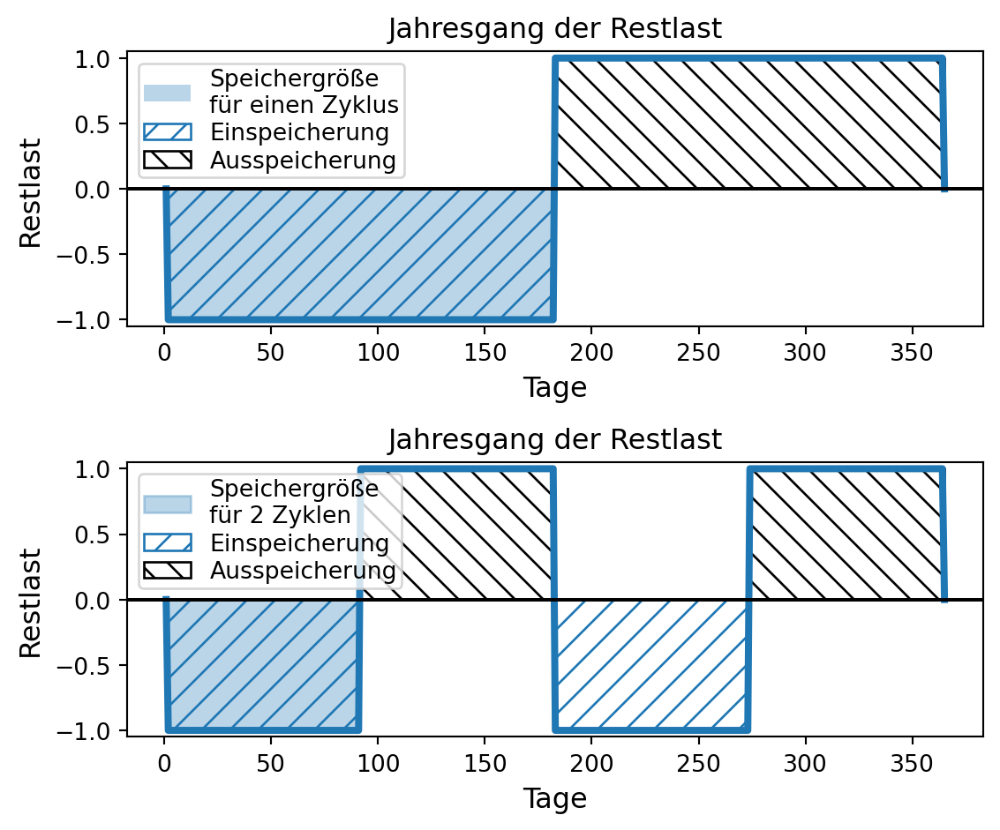

In [58]:
#| echo: false
#| fig-alt: "In zwei Grafiken sind zwei vereinfachte Jahresgänge der Restlast dargestellt. Auf der x-Achse sind die 365 Tage des Jahres dargestellt, auf der y-Achse die Restlast von minus 1 bis 1. In der oberen Grafik ist der Jahresgang der Restlast für einen Vollzyklus aus kompletter Ladung und Entladung mit zwei Balken dargestellt. Im ersten Halbjahr beträgt die Restlast minus 1, der Balken ist eingefärbt und aufsteigend schraffiert. Die Färbung zeigt die erforderliche Speichergröße an, die aufsteigende Schraffierung die Phase der Einspeicherung. Im zweiten Halbjahr beträgt die positive Restlast 1. Dieser Balken ist zur Kennzeichnung der Ausspeicherung nach rechts unten absteigend schraffiert. In der unteren Grafik ist der Jahresgang der Restlast für zwei Vollzyklen mit vier Balken dargestellt. Im ersten Vierteljahr beträgt die Restlast minus 1, der Balken ist eingefärbt und aufsteigend schraffiert. Die Färbung zeigt die erforderliche Speichergröße, die halb so groß wie in der oberen Grafik ist, an, die aufsteigende Schraffierung die Phase der Einspeicherung. Im zweiten Vierteljahr beträgt die positive Restlast 1. Dieser Balken ist zur Kennzeichnung der Ausspeicherung nach rechts unten absteigend schraffiert. Im zweiten Halbjahr wiederholt sich die Abfolge von Ein- und Ausspeicherung in Höhe von 1."

# ein Vollzyklus
## dummy Daten erzeugen
dummy_index = np.linspace(1, 365, 365)
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-1, -1, 365 // 2 - 1), np.linspace(1, 1, 365 // 2), np.linspace(0, 0, 1)])

## plotten
# plt.figure(figsize = (4, 5))
plt.subplot(2, 1, 1)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

## plot the fill
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-1, -1, 365 // 2), alpha = my_alpha, label = my_label + '\nfür einen Zyklus')

## plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-1, -1, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(1, 1, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title);
plt.legend(loc = 'upper left', borderpad = 0.2, labelspacing = 0.2)
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

## 2 Vollzyklen
## dummy Daten erzeugen
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-1, -1, 365 // 4 - 1), np.linspace(1, 1, 365 // 4), np.linspace(-1, -1, 365 // 4), np.linspace(1, 1, 365 // 4), np.linspace(0, 0, 1)])

## plotten
plt.subplot(2, 1, 2)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

## plot the fill
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-1, -1, 365 // 4), alpha = my_alpha, color = my_color, label = my_label + '\nfür 2 Zyklen')

## plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-1, -1, 365 // 4), color = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, (365 * 3) // 4, 365 // 4), y1 = np.linspace(-1, -1, 365 // 4), color = 'None', edgecolor = my_color, hatch = '//')

plt.fill_between(x = np.linspace(365 // 4, 365 // 2, 365 // 4), y1 = np.linspace(1, 1, 365 // 4), color = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')
plt.fill_between(x = np.linspace((365 * 3) // 4, 365, 365 // 4), y1 = np.linspace(1, 1, 365 // 4), color = 'None', edgecolor = 'black', hatch = r'\\')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title);
plt.legend(loc = 'upper left', borderpad = 0.2, labelspacing = 0.2)
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

plt.tight_layout()
plt.show()

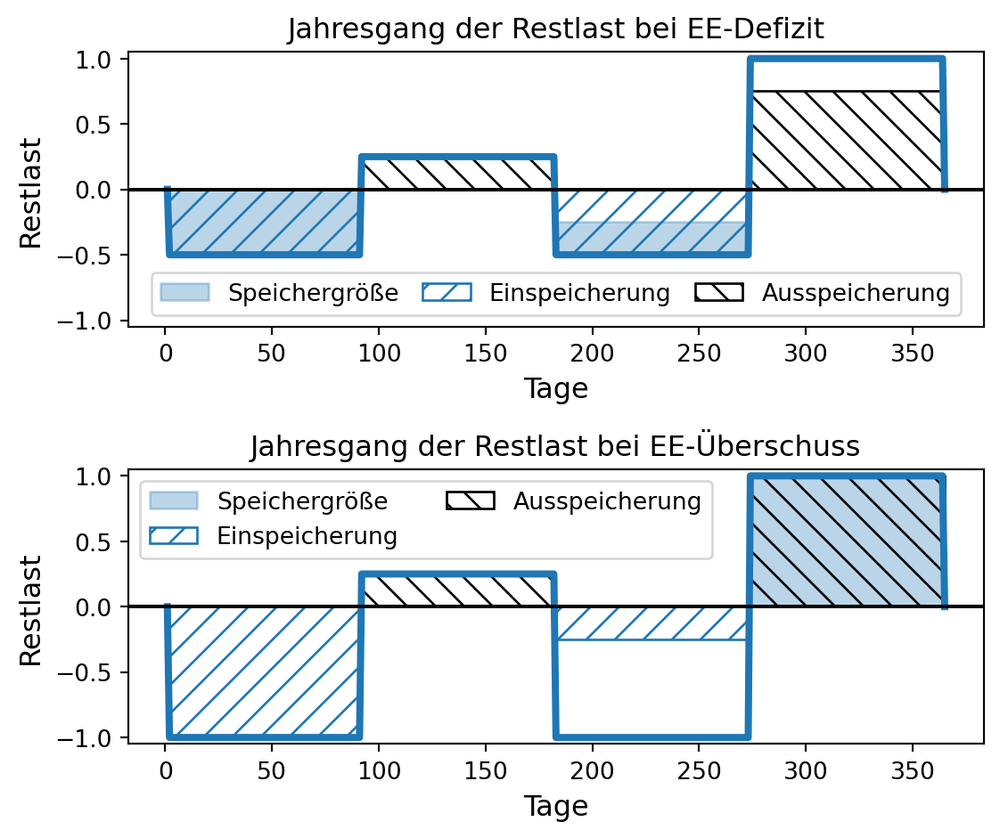

In [59]:
#| echo: false
#| fig-alt: "In zwei Grafiken sind zwei vereinfachte Jahresgänge der Restlast mit Teilzyklen dargestellt. Auf der x-Achse sind die 365 Tage des Jahres dargestellt, auf der y-Achse die Restlast von minus 1 bis 1. In der oberen Grafik ist der Jahresgang der Restlast bei einem Defizit an erneuerbarer Überschussproduktion mit vier Balken dargestellt. Im ersten Vierteljahr beträgt die negative Restlast minus 0.5, der Balken ist eingefärbt und aufsteigend schraffiert. Die Färbung zeigt die erforderliche Speichergröße an, die aufsteigende Schraffierung die Phase der Einspeicherung. Im zweiten Vierteljahr beträgt die positive Restlast 0.25 - hier beginnt die teilweise Ausspeicherung, weshalb der Balken absteigend schraffiert ist. Im dritten Vierteljahr beträgt die negative Restlast erneut minus 0.5. Der Balken ist schraffiert, um die Phase der Einspeicherung anzuzeigen. Der Bereich von 0 bis minus 0.25 ist nicht gefärbt - hier beginnt die teilweise Einspeicherung, es wird zunächst die zuvor entnommene Strommenge im Speicher wieder aufgefüllt. Der Bereich von minus 0.25 bis minus 0.5 ist gefärbt, diese Strommenge wird zusätzlich in den Speicher gefüllt. Die eingespeicherte Strommenge beträgt nun insgesamt 0.75. Im vierten Vierteljahr beträgt die positive Restlast 1. Der Bereich von 0 bis 0.75 ist absteigend schraffiert, der Speicher wird entleert. Der Bereich von 0.75 bis 1 ist nicht markiert weiß - dies ist die durch Lastfolgekraftwerke zu deckende Restlast. In der unteren Grafik ist der Jahresgang der Restlast bei einem Überschuss an erneuerbarer Überschussproduktion mit vier Balken dargestellt. Im ersten Vierteljahr beträgt die negative Restlast minus 1, der Balken ist aufsteigend schraffiert, um die Phase der Einspeicherung zu markieren. Im zweiten Vierteljahr beträgt die positive Restlast 0.25 - hier beginnt die teilweise Ausspeicherung, weshalb der Balken absteigend schraffiert ist. Im dritten Vierteljahr beträgt die negative Restlast erneut minus 1. Der Balken ist bis zu einer Höhe von minus 0.25 aufsteigend schraffiert, um die Phase der Einspeicherung anzuzeigen - der zuvor dem Speicher entnommene Strom wird wieder aufgefüllt. Der Bereich von minus 0.25 bis minus 1 ist nicht markiert, dieser Überschussstrom wird nicht eingespeichert. Im vierten Vierteljahr beträgt die positive Restlast 1. Dieser Balken ist gefärbt, um die benötigte Speichergröße anzuzeigen, und absteigend schraffiert, um die Phase der Ausspeicherung anzuzeigen."

# Teilzyklen bei erneuerbarer Unterproduktion
## dummy Daten erzeugen
dummy_index = np.linspace(1, 365, 365)
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-0.5, -0.5, 365 // 4 - 1), np.linspace(0.25, 0.25, 365 // 4), np.linspace(-0.5, -0.5, 365 // 4), np.linspace(1, 1, 365 // 4), np.linspace(0, 0, 1)])

## plotten
plt.subplot(2, 1, 1)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

## plot the fill
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-0.5, -0.5, 365 // 4), color = my_color, alpha = my_alpha, label = my_label)
plt.fill_between(x = np.linspace(365 // 2, (365 * 3) // 4, 365 // 4), y2 = np.linspace(-0.25, -0.25, 365 // 4), y1 = np.linspace(-0.5, -0.5, 365 // 4),  color = my_color, alpha = my_alpha)

## plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-0.5, -0.5, 365 // 4), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, (365 * 3) // 4, 365 // 4), y1 = np.linspace(-0.5, -0.5, 365 // 4), facecolor = 'None', edgecolor = my_color, hatch = '//')

plt.fill_between(x = np.linspace(365 // 4, 365 // 2, 365 // 4), y1 = np.linspace(0.25, 0.25, 365 // 4),facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')
plt.fill_between(x = np.linspace((365 * 3) // 4, 365, 365 // 4), y1 = np.linspace(0.75, 0.75, 365 // 4), facecolor = 'None', edgecolor = 'black', hatch = r'\\')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title + ' bei EE-Defizit');
plt.legend(loc = 'lower center', ncols = 3, columnspacing = 1)
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

# Teilzyklen bei erneuerbarer Überproduktion
## dummy Daten erzeugen
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-1, -1, 365 // 4 - 1), np.linspace(0.25, 0.25, 365 // 4), np.linspace(-1, -1, 365 // 4), np.linspace(1, 1, 365 // 4), np.linspace(0, 0, 1)])

## plotten
plt.subplot(2, 1, 2)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

## plot the fill
plt.fill_between(x = np.linspace((365 * 3) // 4, 365, 365 // 4), y1 = np.linspace(1, 1, 365 // 4), color = my_color, alpha = my_alpha, label = my_label)

## plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-1, -1, 365 // 4), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, (365 * 3) // 4, 365 // 4), y1 = np.linspace(-0.25, -0.25, 365 // 4), hatch = '//', facecolor = 'None', edgecolor = my_color)

plt.fill_between(x = np.linspace(365 // 4, 365 // 2, 365 // 4), y1 = np.linspace(0.25, 0.25, 365 // 4), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')
plt.fill_between(x = np.linspace((365 * 3) // 4, 365, 365 // 4), y1 = np.linspace(1, 1, 365 // 4), facecolor = 'None', edgecolor = 'black', hatch = r'\\')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title + ' bei EE-Überschuss');
plt.legend(loc = 'upper left', ncols = 2)
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

plt.tight_layout()
plt.show()

In [60]:
# Speichergröße berechnen
## Eingabe: data = pd.Series(data, dtype = 'float'), output = False
## Verarbeitung: aufrufen der Funktion prüfe_EE_Überschuss, um zwischen oberer Grenze = 0 (Speicher ist leer) und unterer Grenze = 0 (Speicher ist überdimensioniert) zu unterscheiden
## Verarbeitung: data wird zwei mal zu data_x2 verkettet. Für data_x2 wird die bei 0 gekappte kumulierte Summe berechnet und die Speichergröße berechnet.
## Ausgabe: wenn output = False wird die Speichergröße (float) zurückgegeben, wenn output = True werden die Summe von data und die Speichergröße mit print() ausgegeben

def berechne_speichergröße(data, output = False):

  data_x2 = pd.concat([data, data])

  überschuss = prüfe_EE_Überschuss(data)
  
  if überschuss:
    
    # gekappte kumulierte Summe berechnen
    capped_cumsum = []
    summe = 0

    for i in data_x2:
      summe += i 

      # Untergrenze prüfen
      if summe < 0:
        summe = 0
      
      capped_cumsum.append(summe)

    speichergröße = max(capped_cumsum)
  
  else:

    # gekappte kumulierte Summe berechnen
    capped_cumsum = []
    summe = 0

    for i in data_x2:
      summe += i

      # Obergrenze prüfen
      if summe > 0:
        summe = 0
      
      capped_cumsum.append(summe)

    speichergröße = abs(min(capped_cumsum))

  if output: # output = True

    print(f"\nSumme data: {data.sum()}\nSpeichergröße: {speichergröße}")
    
  else: # output = False
    return speichergröße
  
speicher_2023 = berechne_speichergröße(restlast, output = False)

print(f"erforderliche Speichergröße 2023: {speicher_2023:,.1f} MWh\nDies entspricht {speicher_2023 / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")

erforderliche Speichergröße 2023: 119,667.0 MWh
Dies entspricht 3.2 Pumpspeicheräquivalenten.


In [61]:
# Speichergröße berechnen
## Eingabe: data = pd.Series(data, dtype = 'float'), einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, output = False
## Verarbeitung: aufrufen der Funktion prüfe_EE_Überschuss, um zwischen oberer Grenze = 0 (Speicher ist leer) und unterer Grenze = 0 (Speicher ist überdimensioniert) zu unterscheiden
## Verarbeitung: data wird zwei mal zu data_x2 verkettet. Für data_x2 wird die bei 0 gekappte kumulierte Summe berechnet und die Speichergröße berechnet.
## Ausgabe: wenn output = False wird die Speichergröße (float) zurückgegeben, wenn output = True werden die Summe von data und die Speichergröße mit print() ausgegeben

def berechne_speichergröße(data, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, output = False):

  data_x2 = pd.concat([data, data])

  überschuss = prüfe_EE_Überschuss(data, einspeicherwirkungsgrad, ausspeicherwirkungsgrad)
  
  if überschuss:
    
    # gekappte kumulierte Summe berechnen
    capped_cumsum = []
    summe = 0

    for i in data_x2:
      if i < 0:
        summe += i * einspeicherwirkungsgrad
      else:
        summe += i / ausspeicherwirkungsgrad

      # Untergrenze prüfen
      if summe < 0:
        summe = 0
      
      capped_cumsum.append(summe)

    speichergröße = max(capped_cumsum)
  
  else: # Unterproduktion

    # gekappte kumulierte Summe berechnen
    capped_cumsum = []
    summe = 0

    for i in data_x2:
      if i < 0:
        summe += i * einspeicherwirkungsgrad
      else:
        summe += i / ausspeicherwirkungsgrad

      # Obergrenze prüfen
      if summe > 0:
        summe = 0
      
      capped_cumsum.append(summe)

    speichergröße = abs(min(capped_cumsum))

  if output: # output = True

    print(f"\nSumme data: {data.sum()}\nSpeichergröße: {speichergröße}")

  else: # output = False
    return speichergröße

speicher_2023 = berechne_speichergröße(restlast, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.9, output = False)

print(f"erforderliche Speichergröße 2023: {speicher_2023:,.1f} MWh\nDies entspricht {speicher_2023 / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")   

erforderliche Speichergröße 2023: 102,674.5 MWh
Dies entspricht 2.7 Pumpspeicheräquivalenten.


In [62]:
# Jahresgang des Speichers berechnen
## Eingabe: data = pd.Series(data, dtype = 'float'), speichergröße = -1, output = False
## Verarbeitung: Wenn speichergröße = -1 wird die Speichergröße mit der Funktion berechne_speichergröße(data) ermittelt
## Verarbeitung: data wird zwei mal zu data_x2 verkettet.
## Verarbeitung: Anhand der Speichergröße werden der Ladestand und die freie Kapazität des Speichers für alle Werte von data für Jahr1 und alle Folgejahre berechnet.
## Ausgabe: Wenn output False ist, wird ein Tupel aus speichergröße (float), Ladestand Jahr1 (pd.Series), Ladestand Jahr2 (pd.Series) zurückgegeben.
## Ausgabe: Wenn output True, werden die kumulierte Summe der Restlast, die Speichergröße, die Restlastkurve, die Ladestände und freie Kapazität des Speichers im Jahresgang für Jahr 1 und Jahr 2 mit ausgegeben

def jahresgang_speicher_berechnen(data, speichergröße = -1, output = False):

  data_x2 = pd.concat([data, data])

  if speichergröße == -1:
    speichergröße = berechne_speichergröße(data) 

# Jahresgang des Speichers berechnen
  jahresgang_speicher = []
  ladestand_speicher = []
  freie_speicherkapazität = speichergröße # der speicher ist leer
  for i in data_x2:

    if (speichergröße - freie_speicherkapazität) - i < 0: # last ohne vorherige Einspeicherung kann nicht bedient werden
      freie_speicherkapazität = speichergröße

    elif freie_speicherkapazität + i < 0: # wenn der Speicher voll ist, muss Überschuss verworfen werden.
      freie_speicherkapazität = 0
      
    else: # Ein-/Ausspeicherung
      freie_speicherkapazität += i

    jahresgang_speicher.append(freie_speicherkapazität)
    ladestand_speicher.append(speichergröße - freie_speicherkapazität)

  if output: # output = True

    dataset = pd.DataFrame({'Restlast': data, 'Ladestand Jahr1': ladestand_speicher[ : len(jahresgang_speicher) // 2 ], 'freie Kapazität Jahr1': jahresgang_speicher[ : len(jahresgang_speicher) // 2 ], 'Ladestand Folgejahre': ladestand_speicher[ len(jahresgang_speicher) // 2 : ], 'freie Kapazität Folgejahre': jahresgang_speicher[ len(jahresgang_speicher) // 2 : ]})

    print(f"\nSumme data: {data.sum()}\nSpeichergröße: {speichergröße}")
    print(dataset)

  else: # output = False
    return speichergröße, pd.Series(ladestand_speicher[ : len(jahresgang_speicher) // 2 ]), pd.Series(ladestand_speicher[ len(jahresgang_speicher) // 2 : ])

speicher_2023 = jahresgang_speicher_berechnen(restlast, output = False)

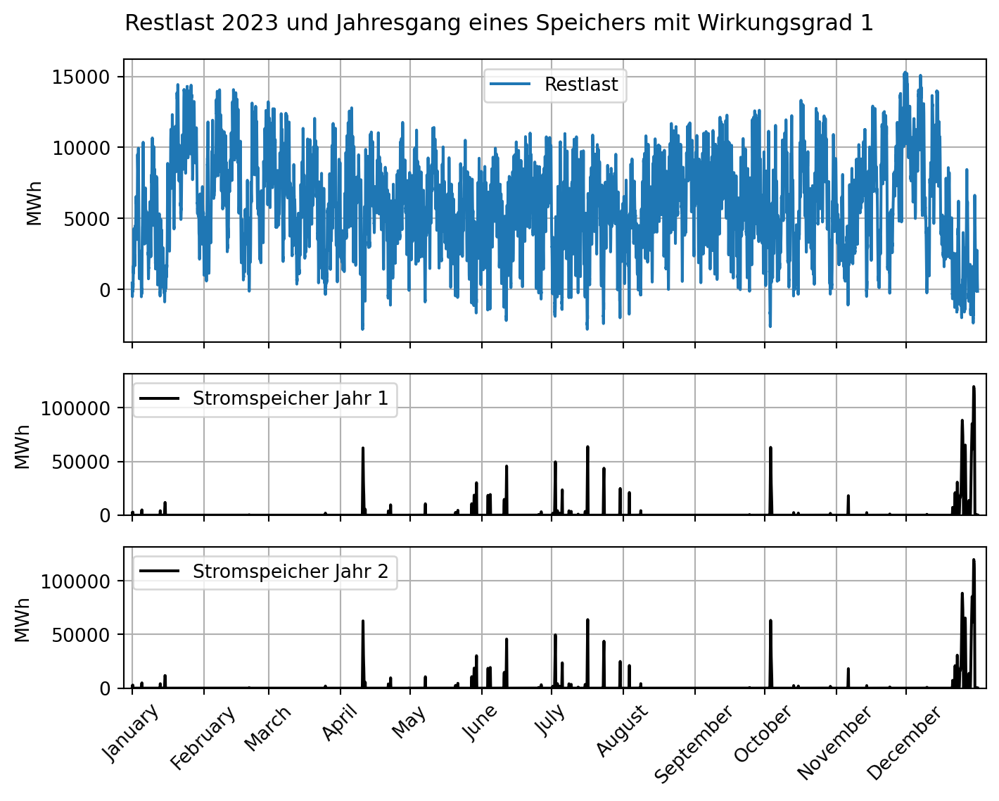

In [63]:
#| echo: false
#| fig-alt: "In der Grafik ist zum einen die Restlast für das Jahr 2023 dargestellt. Diese ist zumeist positiv und nur an wenigen Zeitpunkten im Jahr negativ. Um die Weihnachtsfeiertage besteht ein längerer Zeitraum negativer Restlast. Zum anderen ist der Jahresgang des Speichers dargestellt, um alle erneuerbaren Produktionsüberschüsse einzuspeichern und bei positiver Restlast wieder auszuspeichern. Die Interpretation des Jahresgangs folgt im weiteren Text."
#| fig-cap: Restlast 2023 und Jahresgang eines Speichers mit Wirkungsgrad 1

# Daten einlesen
jahresgang_speicher_jahr1 = speicher_2023[1]
jahresgang_speicher_jahr2 = speicher_2023[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
font_size = 10

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2023 und Jahresgang eines Speichers mit Wirkungsgrad 1')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.1))

## plot restlast
ax1.plot(restlast, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

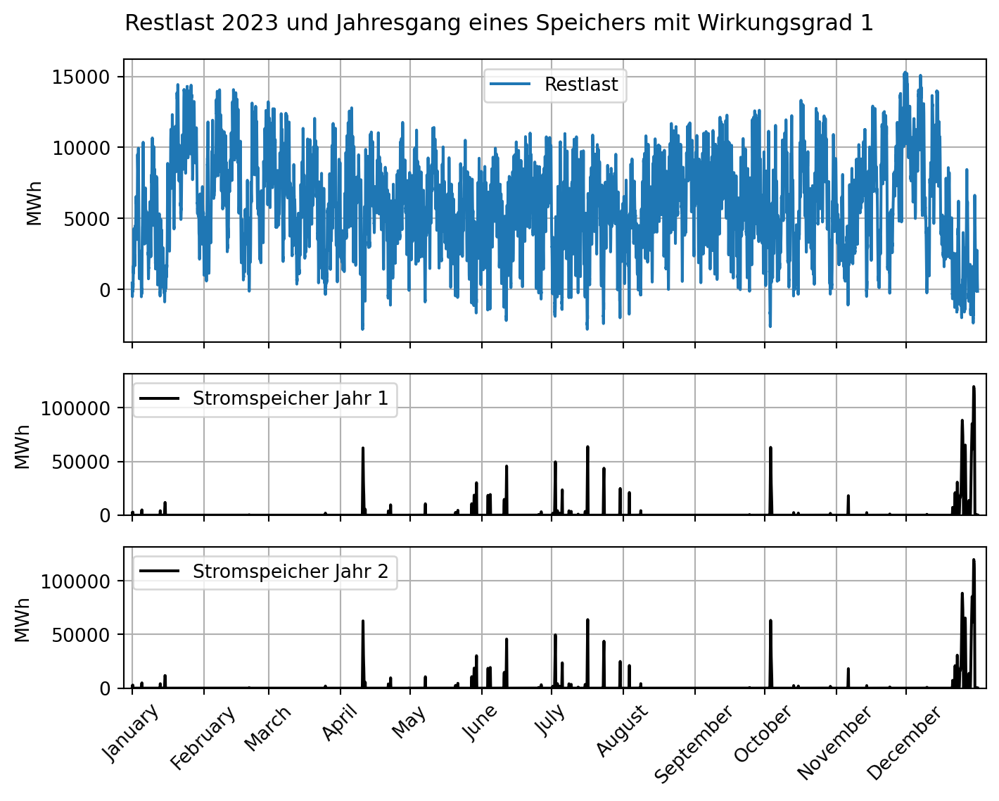

In [64]:
#| output: false

# Daten einlesen
jahresgang_speicher_jahr1 = speicher_2023[1]
jahresgang_speicher_jahr2 = speicher_2023[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
font_size = 10

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2023 und Jahresgang eines Speichers mit Wirkungsgrad 1')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.1))

## plot restlast
ax1.plot(restlast, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

In [65]:
# Jahresgang des Speichers berechnen
## Eingabe: data = pd.Series(data, dtype = 'float'), speichergröße = -1, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, output = False
## Verarbeitung: Wenn speichergröße = -1 wird die Speichergröße mit der Funktion berechne_speichergröße(data) ermittelt
## Verarbeitung: data wird zwei mal zu data_x2 verkettet.
## Verarbeitung: Anhand der Speichergröße werden der Ladestand und die freie Kapazität des Speichers für alle Werte von data für Jahr1 und alle Folgejahre berechnet.
## Ausgabe: Wenn output False ist, wird ein Tupel aus speichergröße (float), Ladestand Jahr1 (pd.Series), Ladestand Jahr2 (pd.Series) zurückgegeben.
## Ausgabe: Wenn output True, werden die kumulierte Summe der Restlast, die Speichergröße, die Restlastkurve, die Ladestände und freie Kapazität des Speichers im Jahresgang für Jahr 1 und Jahr 2 mit ausgegeben

def jahresgang_speicher_berechnen(data, speichergröße = -1, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, output = False):

  data_x2 = pd.concat([data, data])

  if speichergröße == -1:
    speichergröße = berechne_speichergröße(data, einspeicherwirkungsgrad, ausspeicherwirkungsgrad) 

  jahresgang_speicher = []
  ladestand_speicher = []
  freie_speicherkapazität = speichergröße # der speicher ist leer 
  for i in data_x2:

    if i > 0: # Restlast

      # last ohne entsprechende vorherige Einspeicherung kann nicht vollständig bedient werden, der Speicher ist dann leer
      if (speichergröße - freie_speicherkapazität) - i / ausspeicherwirkungsgrad < 0:
        freie_speicherkapazität = speichergröße

      else: # Ausspeicherung
        freie_speicherkapazität += i / ausspeicherwirkungsgrad # hier kann zu viel ausgespeichert werden
        if freie_speicherkapazität > speichergröße:
          freie_speicherkapazität = speichergröße
    
    else: # i <= 0 EE-Überschuss
      
      # wenn der Speicher voll ist, muss Überschuss verworfen werden.
      if freie_speicherkapazität + i * einspeicherwirkungsgrad < 0: 
        freie_speicherkapazität = 0
      
      else: # Einspeicherung
        freie_speicherkapazität += i * einspeicherwirkungsgrad

    jahresgang_speicher.append(freie_speicherkapazität)
    ladestand_speicher.append(speichergröße - freie_speicherkapazität)

  if output: # output = True

    dataset = pd.DataFrame({'Restlast': data, 'Ladestand Jahr1': ladestand_speicher[ : len(jahresgang_speicher) // 2 ], 'freie Kapazität Jahr1': jahresgang_speicher[ : len(jahresgang_speicher) // 2 ], 'Ladestand Folgejahre': ladestand_speicher[ len(jahresgang_speicher) // 2 : ], 'freie Kapazität Folgejahre': jahresgang_speicher[ len(jahresgang_speicher) // 2 : ]})

    print(f"\nSumme data: {data.sum()}\nSpeichergröße: {speichergröße}")
    print(dataset)

  else: # output = False
    return speichergröße, pd.Series(ladestand_speicher[ : len(jahresgang_speicher) // 2 ]), pd.Series(ladestand_speicher[ len(jahresgang_speicher) // 2 : ])

speicher_2023_wirkungsgrad_90_90 = jahresgang_speicher_berechnen(restlast, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.9, output = False)

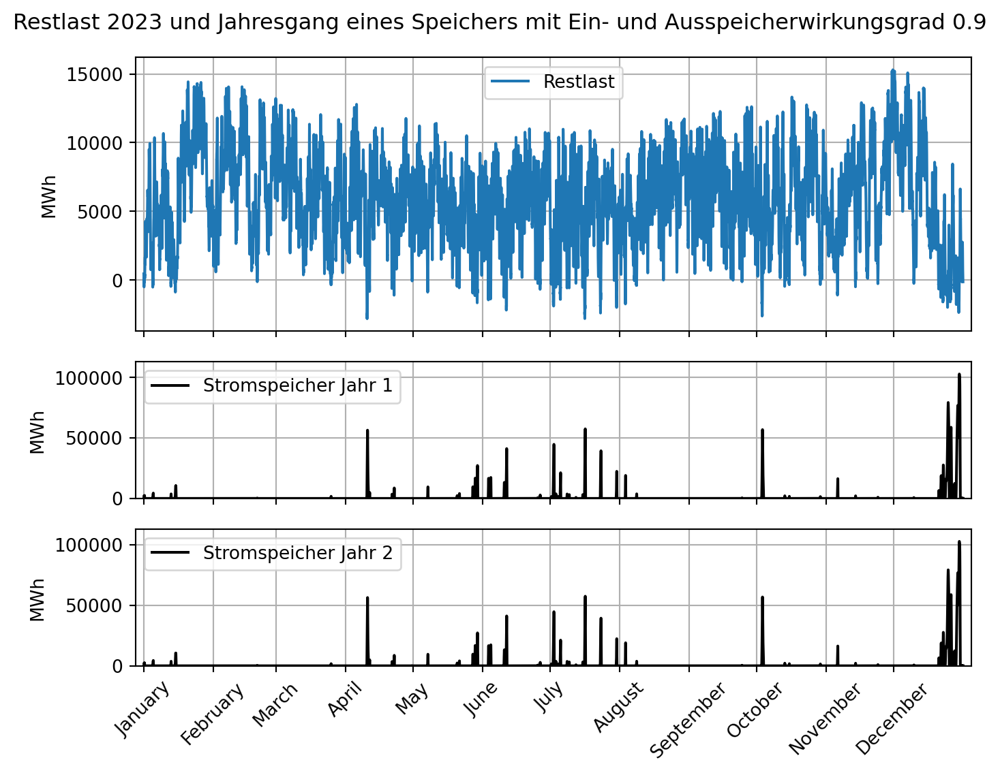

In [66]:
#| echo: false
#| fig-alt: "In der Grafik ist zum einen die Restlast für das Jahr 2023 dargestellt. Diese ist zumeist positiv und nur an wenigen Zeitpunkten im Jahr negativ. Um die Weihnachtsfeiertage besteht ein längerer Zeitraum negativer Restlast. Zum anderen ist der Jahresgang des Speichers mit einem Ein- und Ausspeicherwirkungsgrad von 0.9 dargestellt, um alle erneuerbaren Produktionsüberschüsse einzuspeichern und bei positiver Restlast wieder auszuspeichern. Die Interpretation des Jahresgangs folgt im weiteren Text."
#| fig-cap: Restlast 2023 und Jahresgang eines Speichers mit Ein- und Ausspeicherwirkungsgrad 0.9

# Daten einlesen
jahresgang_speicher_jahr1 = speicher_2023_wirkungsgrad_90_90[1]
jahresgang_speicher_jahr2 = speicher_2023_wirkungsgrad_90_90[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
font_size = 10

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2023 und Jahresgang eines Speichers mit Ein- und Ausspeicherwirkungsgrad 0.9')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.1))

## plot restlast
ax1.plot(restlast, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

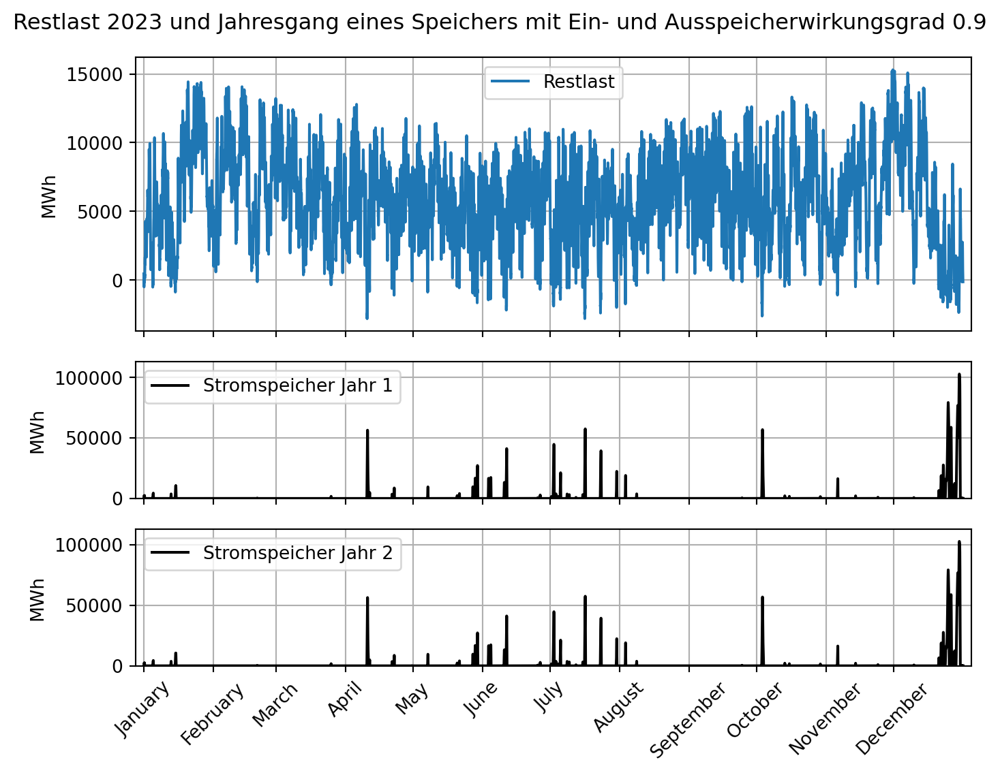

In [67]:
#| output: false

# Daten einlesen
jahresgang_speicher_jahr1 = speicher_2023_wirkungsgrad_90_90[1]
jahresgang_speicher_jahr2 = speicher_2023_wirkungsgrad_90_90[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
font_size = 10

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2023 und Jahresgang eines Speichers mit Ein- und Ausspeicherwirkungsgrad 0.9')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.1))

## plot restlast
ax1.plot(restlast, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

In [68]:
# Zyklenzahl berechnen
## Eingabe: data = pd.Series(data, dtype = 'float'), output = False
## Eingabe: Wenn die Eingabe ein Tupel {'Speichergröße': float, 'jahresgang_speicher_jahr1': pd.Series, 'jahresgang_speicher_jahr2': pd.Series} ist, wird die Zyklenzahl direkt berechnet.
## Eingabe: Wenn die Eingabe data = pd.Series(data, dtype = 'float') ist, wird jahresgang_speicher_berechnen(data, speichergröße = -1, output = False) aufgerufen
## Verarbeitung: Elementweise wird für Jahr 1 und Jahr 2 die Differenz aufeinanderfolgender Werte gebildet, absolut gesetzt und aufsummiert
## Verarbeitung: Für die gleitende Differenzberechnung muss dem Jahresgang in Jahr 1 eine Null vorangestellt werden, dem Jahresgang in Jahr 2 der letzte Wert aus Jahr 1
## Verarbeitung: Die Summe der Speicherladungen und -entladungen wird durch die Speichergröße und durch 2 geteilt.
## Ausgabe: Zyklenzahl für Jahr 1 und Jahr 2 - wenn output = False als Rückgabewert (Tupel), wenn output = True mit print()

def zyklenzahl_berechnen(data, output = False):
  
  if type(data) is tuple: # Speichergröße und Jahresgänge wurden übergeben
    speichergröße = data[0]
    jahresgang_speicher_jahr1 = data[1]
    jahresgang_speicher_jahr2 = data[2]
  
  else: # Restlast wurde übergeben
    ergebnis = jahresgang_speicher_berechnen(data, speichergröße = -1, output = False)
    speichergröße = ergebnis[0]
    jahresgang_speicher_jahr1 = ergebnis[1]
    jahresgang_speicher_jahr2 = ergebnis[2]
  
  # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
  jahresgang_speicher_jahr1 = pd.concat([pd.Series(0), jahresgang_speicher_jahr1])
  jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

  # Zyklenzahl berechnen
  zyklenzahl_jahr1 = jahresgang_speicher_jahr1.diff().abs().sum() / (speichergröße * 2) # ein Zyklus = vollständiges Be- und Entladen --> durch 2 teilen
  zyklenzahl_jahr2 = jahresgang_speicher_jahr2.diff().abs().sum() / (speichergröße * 2) # ein Zyklus = vollständiges Be- und Entladen --> durch 2 teilen
  
  if output:
    print(f"Zyklenzahl Jahr 1: {zyklenzahl_jahr1:,.2f}\n"
          f"Zyklenzahl Jahr 2: {zyklenzahl_jahr2:,.2f}")
  
  else:
    return zyklenzahl_jahr1, zyklenzahl_jahr2
  
zyklenzahl_berechnen(speicher_2023, output = True)

Zyklenzahl Jahr 1: 8.38
Zyklenzahl Jahr 2: 8.38


In [69]:
# Zyklenzahl berechnen mit Wirkungsgrad
## Eingabe: data = pd.Series(data, dtype = 'float'), einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, output = False
## Eingabe: Wenn die Eingabe ein Tupel {'Speichergröße': float, 'jahresgang_speicher_jahr1': pd.Series, 'jahresgang_speicher_jahr2': pd.Series} ist, wird die Zyklenzahl direkt berechnet.
## Eingabe: Wenn die Eingabe data = pd.Series(data, dtype = 'float') ist, wird jahresgang_speicher_berechnen(data, speichergröße = -1, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, output = False) aufgerufen
## Verarbeitung: Elementweise wird für Jahr 1 und Jahr 2 die Differenz aufeinanderfolgender Werte gebildet, absolut gesetzt und aufsummiert
## Verarbeitung: Für die gleitende Differenzberechnung muss dem Jahresgang in Jahr 1 eine Null vorangestellt werden, dem Jahresgang in Jahr 2 der letzte Wert aus Jahr 1
## Verarbeitung: Die Summe der Speicherladungen und -entladungen wird durch die Speichergröße und durch 2 geteilt.
## Ausgabe: Zyklenzahl für Jahr 1 und Jahr 2 - wenn output = False als Rückgabewert (Tupel), wenn output = True mit print()

def zyklenzahl_berechnen(data, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, output = False):
  
  if type(data) is tuple: # Speichergröße und Jahresgänge wurden übergeben
    speichergröße = data[0]
    jahresgang_speicher_jahr1 = data[1]
    jahresgang_speicher_jahr2 = data[2]
  
  else: # Restlast wurde übergeben
    ergebnis = jahresgang_speicher_berechnen(data, speichergröße = -1, einspeicherwirkungsgrad = einspeicherwirkungsgrad, ausspeicherwirkungsgrad = ausspeicherwirkungsgrad, output = False)
    speichergröße = ergebnis[0]
    jahresgang_speicher_jahr1 = ergebnis[1]
    jahresgang_speicher_jahr2 = ergebnis[2]
  
  # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
  jahresgang_speicher_jahr1 = pd.concat([pd.Series(0), jahresgang_speicher_jahr1])
  jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

  # Zyklenzahl berechnen  
  zyklenzahl_jahr1 = jahresgang_speicher_jahr1.diff().abs().sum() / (speichergröße * 2) # ein Zyklus = vollständiges Be- und Entladen --> durch 2 teilen
  zyklenzahl_jahr2 = jahresgang_speicher_jahr2.diff().abs().sum() / (speichergröße * 2) # ein Zyklus = vollständiges Be- und Entladen --> durch 2 teilen
  
  if output:
    print(f"Zyklenzahl Jahr 1: {zyklenzahl_jahr1:,.2f}\n"
          f"Zyklenzahl Jahr 2: {zyklenzahl_jahr2:,.2f}")
  
  else:
    return zyklenzahl_jahr1, zyklenzahl_jahr2
  
zyklenzahl_berechnen(restlast, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.9, output = True)

Zyklenzahl Jahr 1: 8.79
Zyklenzahl Jahr 2: 8.79


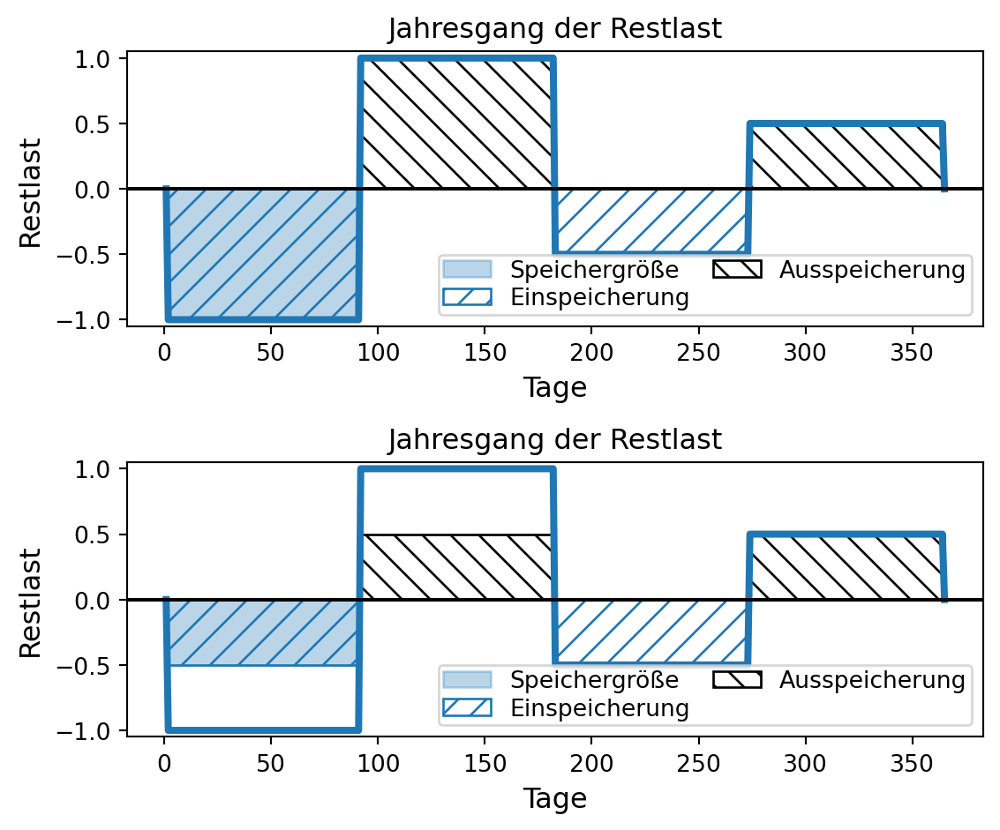

In [70]:
#| echo: false
#| fig-alt: "In zwei Grafiken sind zwei vereinfachte, aus je vier Balken bestehende Restlastkurven im Jahresgang dargestellt. Auf der x-Achse sind die 365 Tage des Jahres dargestellt, auf der y-Achse die Restlast von minus 1 bis 1. In der oberen Grafik ist der Jahresgang eines Speicher ohne Kappung von Erzeugungsspitzen dargestellt. Im ersten Vierteljahr ist die Restlast negativ in Höhe von minus 1. Der erste Balken ist eingefärbt und nach links oben aufsteigend schraffiert. Die Färbung zeigt die erforderliche Speichergröße an, die aufsteigende Schraffierung die Phase der Einspeicherung. Im zweiten Vierteljahr ist die Restlast positiv in Höhe von 1, die Ausspeicherung ist durch eine absteigende Schraffierung gekennzeichnet. Es folgen im dritten und vierten Vierteljahr Phasen der Ein- bzw. Ausspeicherung in Höhe von minus bzw. plus 0.5, die entsprechend schraffiert sind. Auf diese Weise werden 1,5 Ein- und Ausspeicherzyklen realisiert. In der unteren Grafik ist der gleiche Jahresgang dargestellt, allerdings wird die Speichergröße auf 0.5 begrenzt. Im ersten Vierteljahr mit einer Restlast in Höhe von -1 werden deshalb nur -0.5 eingespeichert. Dies ist durch eine Einfärbung und aufsteigende Schraffierung des Bereichs zwischen 0 und 0.5 dargestellt. Der Bereich von minus 0.5 bis minus 1 ist ungekennzeichnet weiß. Dieser Überschussstrom wird nicht eingespeichert. Ebenso wird im zweiten Vierteljahr die Restlast in Höhe von 1 nur zur Hälfte aus dem Speicher bedient. Die Restlast im Bereich 0.5 bis 1 muss durch Lastfolgekraftwerke gedeckt werden. Die folgenden Phasen der Ein- bzw. Ausspeicherung im dritten und vierten Vierteljahr entsprechen der Restlast in Höhe von minus bzw. plus 0.5. Der auf 0.5 begrenzte Speicher erreicht dadurch 2 Ein- und Ausspeicherzyklen."

# ohne Kappung
## dummy Daten erzeugen
dummy_index = np.linspace(1, 365, 365)
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-1, -1, 365 // 4 - 1), np.linspace(1, 1, 365 // 4), np.linspace(-0.5, -0.5, 365 // 4), np.linspace(0.5, 0.5, 365 // 4), np.linspace(0, 0, 1)])

## plotten
plt.subplot(2, 1, 1)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

## plot the fill
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-1, -1, 365 // 4), color = my_color, alpha = my_alpha, label = my_label)

## plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-1, -1, 365 // 4), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, (365 * 3) // 4, 365 // 4), y1 = np.linspace(-0.5, -0.5, 365 // 4), facecolor = 'None', edgecolor = my_color, hatch = '//')

plt.fill_between(x = np.linspace(365 // 4, 365 // 2, 365 // 4), y1 = np.linspace(1, 1, 365 // 4), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')
plt.fill_between(x = np.linspace((365 * 3) // 4, 365, 365 // 4), y1 = np.linspace(0.5, 0.5, 365 // 4), facecolor = 'None', edgecolor = 'black', hatch = r'\\')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title);
plt.legend(loc = 'lower right', ncols = 2, columnspacing = 1, borderpad = 0.2, labelspacing = 0.2)
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

# mit Kappung
## plotten
plt.subplot(2, 1, 2)
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

## plot the fill
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-0.5, -0.5, 365 // 4), color = my_color, alpha = my_alpha, label = my_label)

## plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 4, 365 // 4), y1 = np.linspace(-0.5, -0.5, 365 // 4), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, (365 * 3) // 4, 365 // 4), y1 = np.linspace(-0.5, -0.5, 365 // 4), facecolor = 'None', edgecolor = my_color, hatch = '//')

plt.fill_between(x = np.linspace(365 // 4, 365 // 2, 365 // 4), y1 = np.linspace(0.5, 0.5, 365 // 4), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')
plt.fill_between(x = np.linspace((365 * 3) // 4, 365, 365 // 4), y1 = np.linspace(0.5, 0.5, 365 // 4), facecolor = 'None', edgecolor = 'black', hatch = r'\\')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = my_title);
plt.legend(loc = 'lower right', ncols = 2, columnspacing = 1, borderpad = 0.2, labelspacing = 0.2)
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize)
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize)

plt.tight_layout()
plt.show()

In [71]:
# Kappung berechnen: Wie viel EE wird verworfen, wenn die Speichergröße begrenzt wird?
## Eingabe: Restlastkurve data = pd.Series(data, dtype = 'float', neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = False)
## Verarbeitung: Für data werden mit der Funktion jahresgang_speicher_berechnen() die Speichergröße und die Jahresgänge Jahr 1 und Jahr 2 ohne zusätzliche Kappung bestimmt
## Verarbeitung: Für data wird mit der Funktion zyklenzahl_berechnen() die Zyklenzahl in Jahr 1 und Jahr 2 ohne zusätzliche Kappung bestimmt
## Verarbeitung: Anhand der Jahresgänge wird die eingespeicherte Strommenge ohne zusätzliche Kappung bestimmt
## Verarbeitung: Die Verarbeitungsschritte werden für alle übergebenen Elemente in der Variablen neue_speichergrößen wiederholt
## Verarbeitung: Die Speichergröße der Basisrestlastkurve data wird dafür mit den in neue_speichergrößen übergebenen Werten multipliziert
## Verarbeitung: Aus der Differenz der eingespeicherten Strommengen für jede neue Speichergröße zum Basisjahr wird die gekappte Strommenge bestimmt
## Ausgabe: Wenn output = False wird ein DataFrame mit drei Spalten zurückgegeben. Die Spalte mit Index 0 enthält die relative Speichergröße, Die Spalten 1 und 2 die gekappten Strommengen in Jahr 1 und Jahr 2.
## Ausgabe: Wenn output = True wird der dreispaltige DataFrame mit print() ausgegeben.
## Ausgabe: Zusätzlich wird ein fünfspaltiger DataFrame mit den Zwischenergebnissen (inklusive Basisjahr) mit print() ausgegeben.
## Ausgabe: (Indexangaben): 0 = absolute Speichergröße, 1 = eingespeicherte Strommenge Jahr 1, 2 = Zyklenzahl Jahr 1, 3 = eingespeicherte Strommenge Jahr 2, 4 = Zyklenzahl Jahr 2

def effekt_kappung_berechnen(data, neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = False):

  # Speichergröße im Basisjahr bestimmen
  ergebnis = jahresgang_speicher_berechnen(data, speichergröße = -1, output = False)
  speichergröße0 = ergebnis[0]
  jahresgang_speicher_jahr1 = ergebnis[1]
  jahresgang_speicher_jahr2 = ergebnis[2]

  # Zyklenzahl im Basisjahr bestimmen, Tupel übergeben
  zyklen = zyklenzahl_berechnen(ergebnis, output = False)
  zyklen_jahr1 = zyklen[0]
  zyklen_jahr2 = zyklen[1]
  
  # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
  jahresgang_speicher_jahr1 = pd.concat([pd.Series([0]), jahresgang_speicher_jahr1])
  jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

  # eingespeicherte Strommenge im Basisjahr bestimmen
  einspeicherung_jahr1 = jahresgang_speicher_jahr1.diff().clip(lower = 0).sum()
  einspeicherung_jahr2 = jahresgang_speicher_jahr2.diff().clip(lower = 0).sum()

  # Ergebnisse in DataFrame speichern
  dataframe = pd.DataFrame({'Speichergröße': [speichergröße0], 'Einspeicherung Jahr1': [einspeicherung_jahr1], 'Zyklen Jahr1': zyklen_jahr1, 'Einspeicherung Jahr2': [einspeicherung_jahr2], 'Zyklen Jahr2': zyklen_jahr2})
  
  # eingespeicherte Strommenge bei alternativen Speichergrößen bestimmen
  count = 1

  for i in range(len(neue_speichergrößen)):

    speichergröße_neu = speichergröße0 * neue_speichergrößen[i]
    
    ergebnis = jahresgang_speicher_berechnen(data, speichergröße = speichergröße_neu, output = False)
    jahresgang_speicher_jahr1 = ergebnis[1]
    jahresgang_speicher_jahr2 = ergebnis[2]

    # Zyklenzahl im Basisjahr bestimmen, Tupel übergeben
    zyklen = zyklenzahl_berechnen(ergebnis, output = False)
    zyklen_jahr1 = zyklen[0]
    zyklen_jahr2 = zyklen[1]

    # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
    jahresgang_speicher_jahr1 = pd.concat([pd.Series([0]), jahresgang_speicher_jahr1])
    jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

    # eingespeicherte Strommenge mit neuer Speichergröße bestimmen
    einspeicherung_jahr1 = jahresgang_speicher_jahr1.diff().clip(lower = 0).sum()
    einspeicherung_jahr2 = jahresgang_speicher_jahr2.diff().clip(lower = 0).sum()

    neue_Zeile = [speichergröße_neu, einspeicherung_jahr1, zyklen_jahr1, einspeicherung_jahr2, zyklen_jahr2]
    dataframe.loc[count] = neue_Zeile
  
    count += 1
  
  # gekappte Menge berechnen data.sub(data[0]).drop(0)
  gekappte_einspeicherung_jahr1 = dataframe['Einspeicherung Jahr1'].sub(dataframe['Einspeicherung Jahr1'][0]).abs().drop(0).reset_index(drop = True)
  gekappte_einspeicherung_jahr2 = dataframe['Einspeicherung Jahr2'].sub(dataframe['Einspeicherung Jahr2'][0]).abs().drop(0).reset_index(drop = True)
  dataset = pd.DataFrame({'relative Speichergröße': pd.Series(neue_speichergrößen), 'gekappte Einspeicherung Jahr1': gekappte_einspeicherung_jahr1, 'gekappte Einspeicherung Jahr2': gekappte_einspeicherung_jahr2})
  
  if output:

    print(dataframe)
    print("\n")
    print(dataset)

  else:
    return dataset

effekt_kappung_berechnen(restlast, output = True)

   Speichergröße  Einspeicherung Jahr1  Zyklen Jahr1  Einspeicherung Jahr2  \
0       119667.0              1.00e+06          8.38              1.00e+06   
1       107700.3              9.91e+05          9.20              9.91e+05   
2        95733.6              9.79e+05         10.23              9.79e+05   
3        83766.9              9.63e+05         11.49              9.63e+05   
4        71800.2              9.39e+05         13.07              9.39e+05   
5        59833.5              8.99e+05         15.03              8.99e+05   

   Zyklen Jahr2  
0          8.38  
1          9.20  
2         10.23  
3         11.49  
4         13.07  
5         15.03  


   relative Speichergröße  gekappte Einspeicherung Jahr1  \
0                     0.9                        11966.7   
1                     0.8                        23933.4   
2                     0.7                        40443.7   
3                     0.6                        64377.1   
4                     0.5

In [72]:
# Kappung berechnen: Wie viel EE wird verworfen, wenn die Speichergröße begrenzt wird?
## Eingabe: Restlastkurve data = pd.Series(data, dtype = 'float', einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = False)
## Verarbeitung: Für data werden mit der Funktion jahresgang_speicher_berechnen() die Speichergröße und die Jahresgänge Jahr 1 und Jahr 2 ohne zusätzliche Kappung bestimmt
## Verarbeitung: Für data wird mit der Funktion zyklenzahl_berechnen() die Zyklenzahl in Jahr 1 und Jahr 2 ohne zusätzliche Kappung bestimmt
## Verarbeitung: Anhand der Jahresgänge wird die eingespeicherte Strommenge ohne zusätzliche Kappung bestimmt
## Verarbeitung: Die Verarbeitungsschritte werden für alle übergebenen Elemente in der Variablen neue_speichergrößen wiederholt
## Verarbeitung: Die Speichergröße der Basisrestlastkurve data wird dafür mit den in neue_speichergrößen übergebenen Werten multipliziert
## Verarbeitung: Aus der Differenz der eingespeicherten Strommengen für jede neue Speichergröße zum Basisjahr wird die gekappte Strommenge bestimmt
## Ausgabe: Wenn output = False wird ein DataFrame mit drei Spalten zurückgegeben. Die Spalte mit Index 0 enthält die relative Speichergröße, Die Spalten 1 und 2 die gekappten Strommengen in Jahr 1 und Jahr 2.
## Ausgabe: Wenn output = True wird der dreispaltige DataFrame mit print() ausgegeben.
## Ausgabe: Zusätzlich wird ein fünfspaltiger DataFrame mit den Zwischenergebnissen (inklusive Basisjahr) mit print() ausgegeben.
## Ausgabe: (Indexangaben): 0 = absolute Speichergröße, 1 = eingespeicherte Strommenge Jahr 1, 2 = Zyklenzahl Jahr 1, 3 = eingespeicherte Strommenge Jahr 2, 4 = Zyklenzahl Jahr 2

def effekt_kappung_berechnen(data, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = False):

  # Speichergröße im Basisjahr bestimmen
  ergebnis = jahresgang_speicher_berechnen(data, speichergröße = -1, einspeicherwirkungsgrad = einspeicherwirkungsgrad, ausspeicherwirkungsgrad = ausspeicherwirkungsgrad, output = False)
  speichergröße0 = ergebnis[0]
  jahresgang_speicher_jahr1 = ergebnis[1]
  jahresgang_speicher_jahr2 = ergebnis[2]

  # Zyklenzahl im Basisjahr bestimmen, Tupel übergeben
  zyklen = zyklenzahl_berechnen(ergebnis, einspeicherwirkungsgrad = einspeicherwirkungsgrad, ausspeicherwirkungsgrad = ausspeicherwirkungsgrad, output = False)
  zyklen_jahr1 = zyklen[0]
  zyklen_jahr2 = zyklen[1]
  
  # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
  jahresgang_speicher_jahr1 = pd.concat([pd.Series([0]), jahresgang_speicher_jahr1])
  jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

  # eingespeicherte Strommenge im Basisjahr bestimmen
  einspeicherung_jahr1 = jahresgang_speicher_jahr1.diff().clip(lower = 0).sum()
  einspeicherung_jahr2 = jahresgang_speicher_jahr2.diff().clip(lower = 0).sum()

  # Ergebnisse in DataFrame speichern
  dataframe = pd.DataFrame({'Speichergröße': [speichergröße0], 'Einspeicherung Jahr1': [einspeicherung_jahr1], 'Zyklen Jahr1': zyklen_jahr1, 'Einspeicherung Jahr2': [einspeicherung_jahr2], 'Zyklen Jahr2': zyklen_jahr2})
  
  # eingespeicherte Strommenge bei alternativen Speichergrößen bestimmen
  count = 1

  for i in range(len(neue_speichergrößen)):

    speichergröße_neu = speichergröße0 * neue_speichergrößen[i]
    
    ergebnis = jahresgang_speicher_berechnen(data, speichergröße = speichergröße_neu, einspeicherwirkungsgrad = einspeicherwirkungsgrad, ausspeicherwirkungsgrad = ausspeicherwirkungsgrad, output = False)
    jahresgang_speicher_jahr1 = ergebnis[1]
    jahresgang_speicher_jahr2 = ergebnis[2]

    # Zyklenzahl im Basisjahr bestimmen, Tupel übergeben
    zyklen = zyklenzahl_berechnen(ergebnis, einspeicherwirkungsgrad = einspeicherwirkungsgrad, ausspeicherwirkungsgrad = ausspeicherwirkungsgrad, output = False)
    zyklen_jahr1 = zyklen[0]
    zyklen_jahr2 = zyklen[1]

    # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
    jahresgang_speicher_jahr1 = pd.concat([pd.Series([0]), jahresgang_speicher_jahr1])
    jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

    # eingespeicherte Strommenge mit neuer Speichergröße bestimmen
    einspeicherung_jahr1 = jahresgang_speicher_jahr1.diff().clip(lower = 0).sum()
    einspeicherung_jahr2 = jahresgang_speicher_jahr2.diff().clip(lower = 0).sum()

    neue_Zeile = [speichergröße_neu, einspeicherung_jahr1, zyklen_jahr1, einspeicherung_jahr2, zyklen_jahr2]
    dataframe.loc[count] = neue_Zeile
  
    count += 1
  
  # gekappte Menge berechnen data.sub(data[0]).drop(0)
  gekappte_einspeicherung_jahr1 = dataframe['Einspeicherung Jahr1'].sub(dataframe['Einspeicherung Jahr1'][0]).abs().drop(0).reset_index(drop = True)
  gekappte_einspeicherung_jahr2 = dataframe['Einspeicherung Jahr2'].sub(dataframe['Einspeicherung Jahr2'][0]).abs().drop(0).reset_index(drop = True)
  dataset = pd.DataFrame({'relative Speichergröße': pd.Series(neue_speichergrößen), 'gekappte Einspeicherung Jahr1': gekappte_einspeicherung_jahr1, 'gekappte Einspeicherung Jahr2': gekappte_einspeicherung_jahr2})
  
  if output:

    print(dataframe)
    print("\n")
    print(dataset)

  else:
    return dataset

effekt_kappung_berechnen(restlast, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.9, output = True)

   Speichergröße  Einspeicherung Jahr1  Zyklen Jahr1  Einspeicherung Jahr2  \
0      102674.54             902678.40          8.79             902678.40   
1       92407.08             892410.95          9.66             892410.95   
2       82139.63             882143.49         10.74             882143.49   
3       71872.18             864601.21         12.03             864601.21   
4       61604.72             844066.30         13.70             844066.30   
5       51337.27             799701.77         15.58             799701.77   

   Zyklen Jahr2  
0          8.79  
1          9.66  
2         10.74  
3         12.03  
4         13.70  
5         15.58  


   relative Speichergröße  gekappte Einspeicherung Jahr1  \
0                     0.9                       10267.45   
1                     0.8                       20534.91   
2                     0.7                       38077.19   
3                     0.6                       58612.10   
4                     0.5

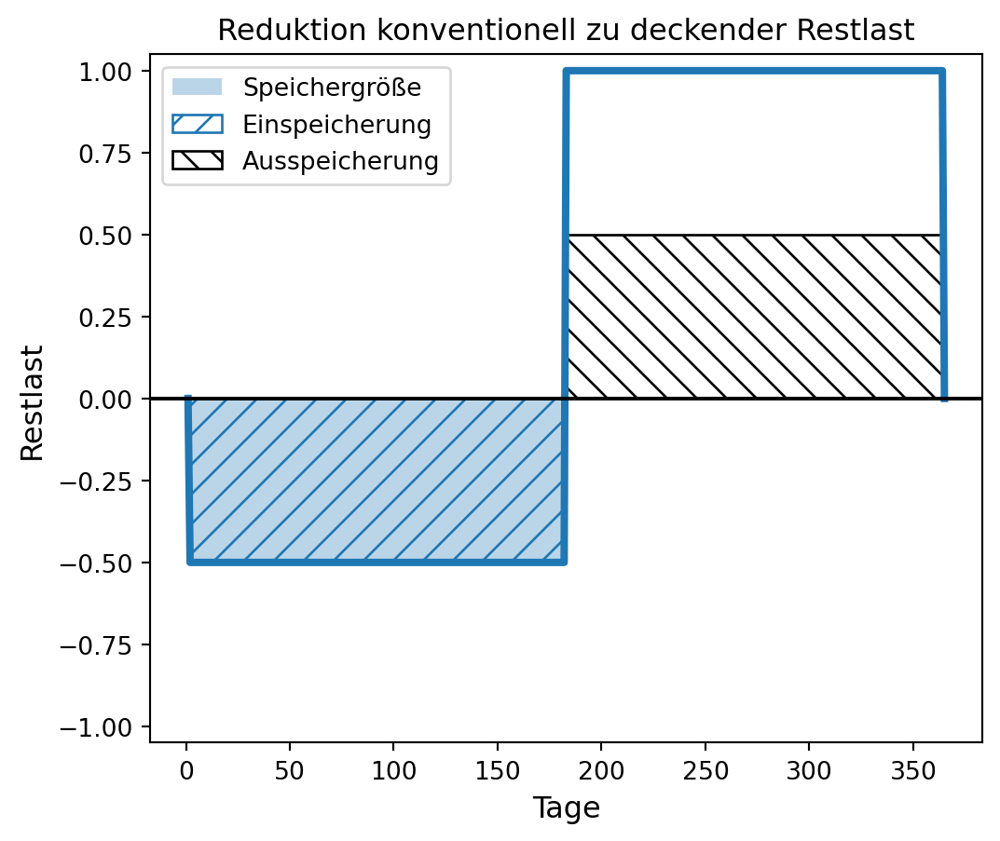

In [73]:
#| echo: false
#| fig-alt: "In zwei Grafiken ist eine vereinfachte, aus zwei Balken bestehende Restlastkurve im Jahresgang bei einem Defizit erneuerbarer Energieerzeugung dargestellt. Auf der x-Achse sind die 365 Tage des Jahres dargestellt, auf der y-Achse die Restlast von minus 1 bis 1. In der ersten Jahreshälfte ist die Restlast negativ in Höhe von minus 0.5, in der zweiten Jahreshälfte positiv in Höhe von 1. Dies ist durch jeweils einen Balken in entsprechender Höhe dargestellt. Der erste Balken mit den negativen Werten ist eingefärbt und nach links oben aufsteigend schraffiert. Die Färbung zeigt die erforderliche Speichergröße an, die aufsteigende Schraffierung die Phase der Einspeicherung. Der zweite Balken mit den positiven Werten ist bis zur halben Höhe 0.5 nach rechts unten absteigend schraffiert - dies zeigt die Phase der Ausspeicherung an. Der Bereich von 0.5 bis 1 ist unausgefüllt - dieser entspricht der durch Lastfolgekraftwerke zu bedienenden Restlast."

## dummy Daten erzeugen
dummy_index = np.linspace(1, 365, 365)
dummy_data = np.concatenate([np.linspace(0, 0, 1), np.linspace(-0.5, -0.5, 365 // 2 - 1), np.linspace(1, 1, 365 // 2), np.linspace(0, 0, 1)])

## plotten
plt.plot(dummy_index, dummy_data, linewidth = my_linewidth)

# plot the fill
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), alpha = my_alpha,  label = my_label)

# plot the hatches
plt.fill_between(x = np.linspace(1, 365 // 2, 365 // 2), y1 = np.linspace(-0.5, -0.5, 365 // 2), facecolor = 'None', edgecolor = my_color, hatch = '//', label = 'Einspeicherung')
plt.fill_between(x = np.linspace(365 // 2, 365, 365 // 2), y1 = np.linspace(0.5, 0.5, 365 // 2), facecolor = 'None', edgecolor = 'black', hatch = r'\\', label = 'Ausspeicherung')

plt.ylim(bottom = my_bottom, top = my_top)
plt.axhline(y = 0, color = 'black', linestyle = '-')
plt.title(label = 'Reduktion konventionell zu deckender Restlast');
plt.legend()
plt.xlabel(my_xlabel, fontsize = my_axislabel_fontsize);
plt.ylabel(my_ylabel, fontsize = my_axislabel_fontsize);

plt.show()

In [74]:
restlast.clip(lower = 0).sum() / verbrauch['Gesamt (Netzlast) [MWh]'].sum()

print(f"Summe positive Restlast [MWh]: {restlast.clip(lower = 0).sum()}\n"
      f"Summe Netzlast: {verbrauch['Gesamt (Netzlast) [MWh]'].sum()}\n"
      f"Quotient positive Restlast / Netzlast: {restlast.clip(lower = 0).sum() / verbrauch['Gesamt (Netzlast) [MWh]'].sum():,.2f}\n"
      f"Anteil erneuerbarer Erzeugung: { ( anteil_ee := 1 - (restlast.clip(lower = 0).sum() / verbrauch['Gesamt (Netzlast) [MWh]'].sum()) ) :,.2f}\n\n"

      f"Summe Erzeugung: {erzeugung.sum(numeric_only = True).sum()}\n"
      f"Quotient positive Restlast / Erzeugung: {restlast.clip(lower = 0).sum() / erzeugung.sum(numeric_only = True).sum():,.2f}\n"
      f"Anteil erneuerbarer Erzeugung: {1 - (restlast.clip(lower = 0).sum() / erzeugung.sum(numeric_only = True).sum()):,.2f}")

Summe positive Restlast [MWh]: 207842228.25
Summe Netzlast: 458271100.75
Quotient positive Restlast / Netzlast: 0.45
Anteil erneuerbarer Erzeugung: 0.55

Summe Erzeugung: 448650448.25
Quotient positive Restlast / Erzeugung: 0.46
Anteil erneuerbarer Erzeugung: 0.54


In [75]:
# Anteil EE berechnen
## Eingabe: data = pd.Series(data, dtype = 'float'), netzlast = -1, neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = False
## Verarbeitung: Aufruf der Funktion jahresgang_speicher_berechnen(data) zur Bestimmung von Speichergröße und Jahrsgang des Speichers in Jahr 1 und Jahr 2
## Verarbeitung: Im Jahresgang des Stromspeichers wird die ausgespeicherte Strommenge bestimmt, diese wird von der Restlast abgezogen --> neue Restlastkurve nach Ausspeicherung
## Verarbeitung: Wenn netzlast = pd.Series(netzlast, dtype = 'float') übergeben wurde, wird anhand der Restlastkurve nach Ausspeicherung der Anteil erneuerbarer Energie bestimmt
## Verarbeitung: Die Berechnungen werden für kleiner dimensionerte Speicher wiederholt, default = [0.9, 0.8, 0.7, 0.6, 0.5]
## Ausgabe: output = False: DataFrame der Restlastkurve(n) nach Ausspeichern wird zurückgeben. In Spalte 0 ist Speichergröße = 1, in den folgenden Spalten die neuen Speichergrößen gespeichert. Zeile 0 enthält die Restlastkurve in Jahr 1, Zeile 1 die Restlastkurve in Jahr 2
## Ausgabe: output = True, Ausgabe Summe Netzlast, positive / negative Restlast, Anteil EE ohne Speicher sowie realisierter Anteil EE für Speichergröße Basisjahr und neue_speichergrößen jeweils für Jahr 1 und Jahr2 mittels print()

def anteil_ee_berechnen(data, netzlast = -1, neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = False):

  # Jahresgang im Basisjahr bestimmen
  ergebnis = jahresgang_speicher_berechnen(data, speichergröße = -1, output = False)
  speichergröße0 = ergebnis[0]
  jahresgang_speicher_jahr1 = ergebnis[1]
  jahresgang_speicher_jahr2 = ergebnis[2]
  
  # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
  jahresgang_speicher_jahr1 = pd.concat([pd.Series([0]), jahresgang_speicher_jahr1])
  jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

  # Jahresgang der ausgespeicherten Strommenge, erster Wert ist NaN und entfällt
  ausspeicherung_jahr1 = jahresgang_speicher_jahr1.diff().clip(upper = 0)[1: ].reset_index(drop = True)
  ausspeicherung_jahr2 = jahresgang_speicher_jahr2.diff().clip(upper = 0)[1: ].reset_index(drop = True)

  # Restlast nach Ausspeicherung berechnen, Werte in ausspeicherung_jahr1 und ausspeicherung_jahr2 sind negativ
  restlast_jahr1 = data + ausspeicherung_jahr1
  restlast_jahr2 = data + ausspeicherung_jahr2

  # Restlast in DataFrame speichern
  restlast_nach_ausspeichern = pd.DataFrame({'Speichergröße 1': [ list(restlast_jahr1), list(restlast_jahr2) ]})

  if type(netzlast) is int: # Anteil EE kann nicht ermittelt werden
    if output:
      print("Netzlast wurde nicht übergeben. Anteil erneuerbarer Energien kann nicht ermittelt werden.")

    output = False
  
  else: # Anteil EE berechnen
  
    # Anteil Anteil EE berechnen = 1 - Summe positive Restlast / Summe Netzlast 
    ## Jahr1
    anteil_ee_jahr1 = 1 - (restlast_jahr1.clip(lower = 0).sum() / netzlast.sum() )

    ## Jahr2
    anteil_ee_jahr2 = 1 - (restlast_jahr2.clip(lower = 0).sum() / netzlast.sum() )

    # Anteil EE in DataFrame speichern
    dataframe_anteil_ee = pd.DataFrame({'relative Speichergröße': pd.concat([ pd.Series([1]), pd.Series(neue_speichergrößen) ], ignore_index = True), 'Anteil EE Jahr1': pd.Series([ anteil_ee_jahr1 ] ), 'Anteil EE Jahr2': pd.Series([ anteil_ee_jahr2 ])})

  # Jahresgang der ausgespeicherten Strommenge und Anteil EE bei alternativen Speichergrößen berechnen
  count = 1

  for i in range(len(neue_speichergrößen)):

    speichergröße_neu = speichergröße0 * neue_speichergrößen[i]
    
    ergebnis = jahresgang_speicher_berechnen(data, speichergröße = speichergröße_neu, output = False)
    jahresgang_speicher_jahr1 = ergebnis[1]
    jahresgang_speicher_jahr2 = ergebnis[2]

    # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
    jahresgang_speicher_jahr1 = pd.concat([pd.Series([0]), jahresgang_speicher_jahr1])
    jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

    # Jahresgang der ausgespeicherten Strommenge, erster Wert ist NaN und entfällt
    ausspeicherung_jahr1 = jahresgang_speicher_jahr1.diff().clip(upper = 0)[1: ].reset_index(drop = True)
    ausspeicherung_jahr2 = jahresgang_speicher_jahr2.diff().clip(upper = 0)[1: ].reset_index(drop = True)

    # Restlast nach Ausspeicherung berechnen, Werte in ausspeicherung_jahr1 und ausspeicherung_jahr2 sind negativ
    restlast_jahr1 = data + ausspeicherung_jahr1
    restlast_jahr2 = data + ausspeicherung_jahr2

    # Spalte in DataFrame restlast_nach_ausspeichern einfügen
    restlast_nach_ausspeichern['Speichergröße ' + str(speichergröße_neu)] = [ list(restlast_jahr1), list(restlast_jahr2) ]

    # Anteil EE berechnen = 1 - Summe positive Restlast / Summe Netzlast 
    if type(netzlast) is not int:
    
       ## Jahr1
      anteil_ee_jahr1 = 1 - (restlast_jahr1.clip(lower = 0).sum() / netzlast.sum() )

      ## Jahr2
      anteil_ee_jahr2 = 1 - (restlast_jahr2.clip(lower = 0).sum() / netzlast.sum() )

      # Anteil EE in DataFrame speichern, value assignment: df.loc[row_indexer, "col"] = values
      dataframe_anteil_ee.loc[count, 'Anteil EE Jahr1'] = anteil_ee_jahr1
      dataframe_anteil_ee.loc[count, 'Anteil EE Jahr2'] = anteil_ee_jahr2
    
    count += 1
                          
  if output: # Anteil EE ausgeben

    print(f"Summe Netzlast: {netzlast.sum():,.2f}\nSumme positive Restlast: {data.clip(lower = 0).sum():,.2f}\tSumme negative Restlast: {data.clip(upper = 0).sum():,.2f}\nSpeichergröße 1: {speichergröße0:,.2f}\tAnteil EE ohne Speicher: {1 - ( data.clip(lower = 0).sum() / netzlast.sum() ) if len(netzlast) > 1 else '--':,.2f}\n")
    print(dataframe_anteil_ee)
    
  else: # Restlastkurven zurückgeben
    return restlast_nach_ausspeichern

anteil_ee_berechnen(restlast, netzlast = verbrauch['Gesamt (Netzlast) [MWh]'], neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = True)

Summe Netzlast: 458,271,100.75
Summe positive Restlast: 207,842,228.25	Summe negative Restlast: -1,002,976.00
Speichergröße 1: 119,667.00	Anteil EE ohne Speicher: 0.55

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.0             0.55             0.55
1                     0.9             0.55             0.55
2                     0.8             0.55             0.55
3                     0.7             0.55             0.55
4                     0.6             0.55             0.55
5                     0.5             0.55             0.55


In [76]:
# Anteil EE berechnen
## Eingabe: data = pd.Series(data, dtype = 'float'), netzlast = -1, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = False
## Verarbeitung: Aufruf der Funktion jahresgang_speicher_berechnen(data) zur Bestimmung von Speichergröße und Jahrsgang des Speichers in Jahr 1 und Jahr 2
## Verarbeitung: Im Jahresgang des Stromspeichers wird die ausgespeicherte Strommenge bestimmt, diese wird von der Restlast abgezogen --> neue Restlastkurve nach Ausspeicherung
## Verarbeitung: Wenn netzlast = pd.Series(netzlast, dtype = 'float') übergeben wurde, wird anhand der Restlastkurve nach Ausspeicherung der Anteil erneuerbarer Energie bestimmt
## Verarbeitung: Die Berechnungen werden für kleiner dimensionerte Speicher wiederholt, default = [0.9, 0.8, 0.7, 0.6, 0.5]
## Ausgabe: output = False: DataFrame der Restlastkurve(n) nach Ausspeichern wird zurückgeben. In Spalte 0 ist Speichergröße = 1, in den folgenden Spalten die neuen Speichergrößen gespeichert. Zeile 0 enthält die Restlastkurve in Jahr 1, Zeile 1 die Restlastkurve in Jahr 2
## Ausgabe: output = True, Ausgabe Summe Netzlast, positive / negative Restlast, Anteil EE ohne Speicher sowie realisierter Anteil EE für Speichergröße Basisjahr und neue_speichergrößen jeweils für Jahr 1 und Jahr2 mittels print()

def anteil_ee_berechnen(data, netzlast = -1, einspeicherwirkungsgrad = 1, ausspeicherwirkungsgrad = 1, neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = False):

  # Jahresgang im Basisjahr bestimmen
  ergebnis = jahresgang_speicher_berechnen(data, speichergröße = -1, einspeicherwirkungsgrad = einspeicherwirkungsgrad, ausspeicherwirkungsgrad = ausspeicherwirkungsgrad, output = False)
  speichergröße0 = ergebnis[0]
  jahresgang_speicher_jahr1 = ergebnis[1]
  jahresgang_speicher_jahr2 = ergebnis[2]
  
  # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
  jahresgang_speicher_jahr1 = pd.concat([pd.Series([0]), jahresgang_speicher_jahr1])
  jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

  # Jahresgang der ausgespeicherten Strommenge, erster Wert ist NaN und entfällt
  ausspeicherung_jahr1 = jahresgang_speicher_jahr1.diff().clip(upper = 0)[1: ].reset_index(drop = True)
  ausspeicherung_jahr2 = jahresgang_speicher_jahr2.diff().clip(upper = 0)[1: ].reset_index(drop = True)

  # Restlast nach Ausspeicherung berechnen, Werte in ausspeicherung_jahr1 und ausspeicherung_jahr2 sind negativ
  restlast_jahr1 = data + ausspeicherung_jahr1
  restlast_jahr2 = data + ausspeicherung_jahr2

  # Restlast in DataFrame speichern
  restlast_nach_ausspeichern = pd.DataFrame({'Speichergröße 1': [ list(restlast_jahr1), list(restlast_jahr2) ]})

  if type(netzlast) is int: # Anteil EE kann nicht ermittelt werden
    if output:
      print("Netzlast wurde nicht übergeben. Anteil erneuerbarer Energien kann nicht ermittelt werden.")

    output = False
  
  else: # Anteil EE berechnen
  
    # Anteil Anteil EE berechnen = 1 - Summe positive Restlast / Summe Netzlast 
    ## Jahr1
    anteil_ee_jahr1 = 1 - (restlast_jahr1.clip(lower = 0).sum() / netzlast.sum() )

    ## Jahr2
    anteil_ee_jahr2 = 1 - (restlast_jahr2.clip(lower = 0).sum() / netzlast.sum() )

    # Anteil EE in DataFrame speichern
    dataframe_anteil_ee = pd.DataFrame({'relative Speichergröße': pd.concat([ pd.Series([1]), pd.Series(neue_speichergrößen) ], ignore_index = True), 'Anteil EE Jahr1': pd.Series([ anteil_ee_jahr1 ] ), 'Anteil EE Jahr2': pd.Series([ anteil_ee_jahr2 ])})

  # Jahresgang der ausgespeicherten Strommenge und Anteil EE bei alternativen Speichergrößen berechnen
  count = 1

  for i in range(len(neue_speichergrößen)):

    speichergröße_neu = speichergröße0 * neue_speichergrößen[i]
    
    ergebnis = jahresgang_speicher_berechnen(data, speichergröße = speichergröße_neu, einspeicherwirkungsgrad = einspeicherwirkungsgrad, ausspeicherwirkungsgrad = ausspeicherwirkungsgrad, output = False)
    jahresgang_speicher_jahr1 = ergebnis[1]
    jahresgang_speicher_jahr2 = ergebnis[2]

    # Jahresgang Jahr 1 eine Null voranstellen, Jahresgang Jahr 2 den letzten Wert aus Jahr 1
    jahresgang_speicher_jahr1 = pd.concat([pd.Series([0]), jahresgang_speicher_jahr1])
    jahresgang_speicher_jahr2 = pd.concat([jahresgang_speicher_jahr1[ - 1: ], jahresgang_speicher_jahr2])

    # Jahresgang der ausgespeicherten Strommenge, erster Wert ist NaN und entfällt
    ausspeicherung_jahr1 = jahresgang_speicher_jahr1.diff().clip(upper = 0)[1: ].reset_index(drop = True)
    ausspeicherung_jahr2 = jahresgang_speicher_jahr2.diff().clip(upper = 0)[1: ].reset_index(drop = True)

    # Restlast nach Ausspeicherung berechnen, Werte in ausspeicherung_jahr1 und ausspeicherung_jahr2 sind negativ
    restlast_jahr1 = data + ausspeicherung_jahr1
    restlast_jahr2 = data + ausspeicherung_jahr2

    # Spalte in DataFrame restlast_nach_ausspeichern einfügen
    restlast_nach_ausspeichern['Speichergröße ' + str(speichergröße_neu)] = [ list(restlast_jahr1), list(restlast_jahr2) ]

    # Anteil EE berechnen = 1 - Summe positive Restlast / Summe Netzlast 
    if type(netzlast) is not int:
    
       ## Jahr1
      anteil_ee_jahr1 = 1 - (restlast_jahr1.clip(lower = 0).sum() / netzlast.sum() )

      ## Jahr2
      anteil_ee_jahr2 = 1 - (restlast_jahr2.clip(lower = 0).sum() / netzlast.sum() )

      # Anteil EE in DataFrame speichern, value assignment: df.loc[row_indexer, "col"] = values
      dataframe_anteil_ee.loc[count, 'Anteil EE Jahr1'] = anteil_ee_jahr1
      dataframe_anteil_ee.loc[count, 'Anteil EE Jahr2'] = anteil_ee_jahr2
    
    count += 1
                          
  if output: # Anteil EE ausgeben

    print(f"Summe Netzlast: {netzlast.sum():,.2f}\nSumme positive Restlast: {data.clip(lower = 0).sum():,.2f}\tSumme negative Restlast: {data.clip(upper = 0).sum():,.2f}\nSpeichergröße 1: {speichergröße0:,.2f}\tAnteil EE ohne Speicher: {1 - ( data.clip(lower = 0).sum() / netzlast.sum() ) if len(netzlast) > 1 else '--':,.2f}\n")
    print(dataframe_anteil_ee)
    
  else: # Restlastkurven zurückgeben
    return restlast_nach_ausspeichern

anteil_ee_berechnen(restlast, netzlast = verbrauch['Gesamt (Netzlast) [MWh]'], einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.9, neue_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5], output = True)

Summe Netzlast: 458,271,100.75
Summe positive Restlast: 207,842,228.25	Summe negative Restlast: -1,002,976.00
Speichergröße 1: 102,674.54	Anteil EE ohne Speicher: 0.55

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.0             0.55             0.55
1                     0.9             0.55             0.55
2                     0.8             0.55             0.55
3                     0.7             0.55             0.55
4                     0.6             0.55             0.55
5                     0.5             0.55             0.55


In [77]:
lastfaktor_2030_MWh = (658 * 1000 * 1000) / verbrauch["Gesamt (Netzlast) [MWh]"].sum()
lastfaktor_2035_MWh = (670.4 * 1000 * 1000) / verbrauch["Gesamt (Netzlast) [MWh]"].sum()

print(f"Steigerung des Stromverbrauchs 2030 gegenüber 2023 Faktor: {lastfaktor_2030_MWh:,.2f}\n"
      f"Steigerung des Stromverbrauchs 2035 gegenüber 2023 Faktor: {lastfaktor_2035_MWh:,.2f}")

Steigerung des Stromverbrauchs 2030 gegenüber 2023 Faktor: 1.44
Steigerung des Stromverbrauchs 2035 gegenüber 2023 Faktor: 1.46


In [78]:
import pandas as pd

# Deklarieren der Anzahl der Nachkommastellen
pd.set_option("display.precision", 2)

# Datensätze werden eingelesen
# !
# Für die eigene Anwendung muss der Dateipfad an den korrekten Speicherort der runtergeladenen .csv Datei angepasst werden. 
# !

installierte_leistung_ms = pd.read_csv("aufgaben/01-daten/Installierte_Erzeugungsleistung_202301010000_202401010000_Jahr.csv", \
sep = ";", thousands = ".", decimal = ",", parse_dates =  [0, 1], date_format = "%d.%m.%Y")

erzeugung_ms = pd.read_csv("aufgaben/01-daten/Realisierte_Erzeugung_202301010000_202401010000_Viertelstunde.csv", \
sep = ";", thousands = ".", decimal = ",", parse_dates =  [0, 1], date_format = "%d.%m.%Y %H:%M")

verbrauch_ms = pd.read_csv("aufgaben/01-daten/Realisierter_Stromverbrauch_202301010000_202401010000_Viertelstunde.csv", \
sep = ";", thousands = ".", decimal = ",", parse_dates =  [0, 1], date_format = "%d.%m.%Y %H:%M")

# Zeichenkette " Originalauflösungen" entfernen
erzeugung_ms.columns = erzeugung_ms.columns.str.replace(pat = " Originalauflösungen", repl = "")
installierte_leistung_ms.columns = installierte_leistung_ms.columns.str.replace(pat = " Originalauflösungen", repl = "")
verbrauch_ms.columns = verbrauch_ms.columns.str.replace(pat = " Originalauflösungen", repl = "")

# Zusammenfassen der erneuerbaren Erzeugung in einer Liste
erneuerbare_ms = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]', 'Sonstige Erneuerbare [MWh]']

pumpspeicherkapazität_MWh_ms = 37.4 * 1000

# Projizierte Erzeugung und Stromverbrauch 2030 & 2035:
print(f"Wind an Land 2030:\t{( zubaufaktor_windonshore_2030_ms := 115 / (installierte_leistung_ms['Wind Onshore [MW]'].sum() / 1000) ):,.2f}\n"
      f"Wind auf See 2030:\t{( zubaufaktor_windoffshore_2030_ms := 30 / (installierte_leistung_ms['Wind Offshore [MW]'].sum() / 1000) ):,.2f}\n"
      f"Solar 2030:\t\t\t{( zubaufaktor_solar_2030_ms := 215 / (installierte_leistung_ms['Photovoltaik [MW]'].sum() / 1000) ):,.2f}\n"
      f"Biomasse 2030:\t\t{8.4 / (installierte_leistung_ms['Biomasse [MW]'].sum() / 1000):,.2f}")

print(f"\n\nWind an Land 2035:\t{( zubaufaktor_windonshore_2035_ms := 157 / (installierte_leistung_ms['Wind Onshore [MW]'].sum() / 1000) ):,.2f}\n"
      f"Wind auf See 2035:\t{( zubaufaktor_windoffshore_2035_ms := 40 / (installierte_leistung_ms['Wind Offshore [MW]'].sum() / 1000) ):,.2f}\n"
      f"Solar 2035:\t\t\t{( zubaufaktor_solar_2035_ms := 309 / (installierte_leistung_ms['Photovoltaik [MW]'].sum() / 1000) ):,.2f}\n"
      f"Biomasse 2035:\t\t{8.4 / (installierte_leistung_ms['Biomasse [MW]'].sum() / 1000):,.2f}")

lastfaktor_2030_MWh_ms = (658 * 1000 * 1000) / verbrauch_ms["Gesamt (Netzlast) [MWh]"].sum()
lastfaktor_2035_MWh_ms = (670.4 * 1000 * 1000) / verbrauch_ms["Gesamt (Netzlast) [MWh]"].sum()

print(f"\nSteigerung des Stromverbrauchs 2030 gegenüber 2023 Faktor: {lastfaktor_2030_MWh_ms:,.2f}\n"
      f"Steigerung des Stromverbrauchs 2035 gegenüber 2023 Faktor: {lastfaktor_2035_MWh_ms:,.2f}")

# Definieren der Restlast
restlast_ms = pd.DataFrame()
restlast_ms["Netzlast [MWh]"] = verbrauch_ms["Gesamt (Netzlast) [MWh]"].copy() 
restlast_ms["Erneuerbare [MWh]"] = erzeugung_ms[erneuerbare_ms].sum(axis = "columns").copy()
restlast_ms["Restlast [MWh]"] = restlast_ms["Netzlast [MWh]"] - restlast_ms["Erneuerbare [MWh]"]
restlast_ms = restlast_ms["Restlast [MWh]"]


erzeugung_2030_ms = erzeugung_ms.copy()
erzeugung_2035_ms = erzeugung_ms.copy()

erzeugung_2030_ms["Wind Onshore [MWh]"] = erzeugung_2030_ms["Wind Onshore [MWh]"] * zubaufaktor_windonshore_2030_ms
erzeugung_2030_ms["Wind Offshore [MWh]"] = erzeugung_2030_ms["Wind Offshore [MWh]"] * zubaufaktor_windoffshore_2030_ms
erzeugung_2030_ms["Photovoltaik [MWh]"] = erzeugung_2030_ms["Photovoltaik [MWh]"]* zubaufaktor_solar_2030_ms
# der Wert für Biomasse muss hier nicht geändert werden, da der Faktor 0,99 (also näherungsweise 1) beträgt
erzeugung_2035_ms["Wind Onshore [MWh]"] = erzeugung_2035_ms["Wind Onshore [MWh]"] * zubaufaktor_windonshore_2035_ms
erzeugung_2035_ms["Wind Offshore [MWh]"] = erzeugung_2035_ms["Wind Offshore [MWh]"] * zubaufaktor_windoffshore_2035_ms
erzeugung_2035_ms["Photovoltaik [MWh]"] = erzeugung_2035_ms["Photovoltaik [MWh]"]* zubaufaktor_solar_2035_ms

verbrauch_2030_ms = verbrauch_ms.copy()
verbrauch_2030_ms["Gesamt (Netzlast) [MWh]"] = verbrauch_2030_ms["Gesamt (Netzlast) [MWh]"]*lastfaktor_2030_MWh_ms
verbrauch_2035_ms = verbrauch_ms.copy()
verbrauch_2035_ms["Gesamt (Netzlast) [MWh]"] = verbrauch_2035_ms["Gesamt (Netzlast) [MWh]"]*lastfaktor_2035_MWh_ms

restlast_2030_ms = pd.DataFrame()
restlast_2030_ms["Netzlast [MWh]"] = verbrauch_2030_ms["Gesamt (Netzlast) [MWh]"].copy() 
restlast_2030_ms["Erneuerbare [MWh]"] = erzeugung_2030_ms[erneuerbare_ms].sum(axis = "columns").copy()
restlast_2030_ms["Restlast [MWh]"] = restlast_2030_ms["Netzlast [MWh]"] - restlast_2030_ms["Erneuerbare [MWh]"]
restlast_2030_ms = restlast_2030_ms["Restlast [MWh]"]

restlast_2035_ms = pd.DataFrame()
restlast_2035_ms["Netzlast [MWh]"] = verbrauch_2035_ms["Gesamt (Netzlast) [MWh]"].copy() 
restlast_2035_ms["Erneuerbare [MWh]"] = erzeugung_2035_ms[erneuerbare_ms].sum(axis = "columns").copy()
restlast_2035_ms["Restlast [MWh]"] = restlast_2035_ms["Netzlast [MWh]"] - restlast_2035_ms["Erneuerbare [MWh]"]
restlast_2035_ms = restlast_2035_ms["Restlast [MWh]"]

print("\n2030\n======================\n")
speicher_2030_ms = berechne_speichergröße(restlast_2030_ms, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)
print(f"erforderliche Speichergröße in 2030: {speicher_2030_ms:,.1f} MWh")

anteil_EE_2030_ms = anteil_ee_berechnen(restlast_2030_ms, netzlast = verbrauch_2030_ms['Gesamt (Netzlast) [MWh]'],
                                     einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.5, 0.1, 0.01], output = True)

# das ganze nochmal für 2035:
print("\n2035\n======================\n")
speicher_2035_ms = berechne_speichergröße(restlast_2035_ms, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)
print(f"erforderliche Speichergröße in 2035: {speicher_2035_ms:,.1f} MWh")

anteil_EE_2035_ms = anteil_ee_berechnen(restlast_2035_ms, netzlast = verbrauch_2035_ms['Gesamt (Netzlast) [MWh]'],
                                     einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.5, 0.1, 0.01], output = True)


Wind an Land 2030:	2.00
Wind auf See 2030:	3.69
Solar 2030:			3.41
Biomasse 2030:		0.99


Wind an Land 2035:	2.73
Wind auf See 2035:	4.92
Solar 2035:			4.90
Biomasse 2035:		0.99

Steigerung des Stromverbrauchs 2030 gegenüber 2023 Faktor: 1.44
Steigerung des Stromverbrauchs 2035 gegenüber 2023 Faktor: 1.46

2030

erforderliche Speichergröße in 2030: 6,170,038.0 MWh
Summe Netzlast: 658,000,000.00
Summe positive Restlast: 175,897,072.30	Summe negative Restlast: -85,250,478.82
Speichergröße 1: 6,170,038.04	Anteil EE ohne Speicher: 0.73

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                    1.00             0.83             0.84
1                    0.50             0.83             0.83
2                    0.10             0.81             0.81
3                    0.01             0.75             0.75

2035

erforderliche Speichergröße in 2035: 23,829,823.9 MWh


Summe Netzlast: 670,400,000.00
Summe positive Restlast: 125,949,558.61	Summe negative Restlast: -221,510,407.41
Speichergröße 1: 23,829,823.85	Anteil EE ohne Speicher: 0.81

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                    1.00             0.98             1.00
1                    0.50             0.97             0.97
2                    0.10             0.94             0.94
3                    0.01             0.87             0.87


In [79]:
meine_speichergrößen = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1, 0.08, 0.06, 0.04, 0.02, 0.01]
mein_einspeicherwirkungsgrad = 0.9
mein_ausspeicherwirkungsgrad = 0.88

# Datensatz 2030 erzeugen
## zubaufaktor_windonshore_2030
## zubaufaktor_windoffshore_2030
## zubaufaktor_solar_2030

erzeugung_2030 = erzeugung.copy()
erzeugung_2030['Wind Onshore [MWh]'] *= zubaufaktor_windonshore_2030
erzeugung_2030['Wind Offshore [MWh]'] *= zubaufaktor_windoffshore_2030
erzeugung_2030['Photovoltaik [MWh]'] *= zubaufaktor_solar_2030

erneuerbare_2030 = pd.Series()
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]',
'Sonstige Erneuerbare [MWh]']
erneuerbare_2030 = erzeugung_2030[erneuerbare].sum(axis = "columns").copy()

netzlast_2023 = pd.Series()
netzlast_2023 = verbrauch["Gesamt (Netzlast) [MWh]"].copy()
netzlast_2030 = netzlast_2023 * lastfaktor_2030_MWh

restlast_2030 = pd.Series()
restlast_2030 = netzlast_2030 - erneuerbare_2030

# Ausgabe
speicher_2030 = berechne_speichergröße(restlast_2030, einspeicherwirkungsgrad = mein_einspeicherwirkungsgrad, ausspeicherwirkungsgrad = mein_ausspeicherwirkungsgrad, output = False)
print(f"maximal erforderliche Speichergröße 2030: {speicher_2030:,.1f} MWh\nDies entspricht {speicher_2030 / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")
print("\n")

effekt_kappung_berechnen(restlast_2030, einspeicherwirkungsgrad = mein_einspeicherwirkungsgrad, ausspeicherwirkungsgrad = mein_ausspeicherwirkungsgrad, neue_speichergrößen = meine_speichergrößen, output = True)
print("\n")

anteil_ee_berechnen(restlast_2030, netzlast = netzlast_2030, einspeicherwirkungsgrad = mein_einspeicherwirkungsgrad, ausspeicherwirkungsgrad = mein_ausspeicherwirkungsgrad, neue_speichergrößen = meine_speichergrößen, output = True)

maximal erforderliche Speichergröße 2030: 6,170,038.0 MWh
Dies entspricht 165.0 Pumpspeicheräquivalenten.




    Speichergröße  Einspeicherung Jahr1  Zyklen Jahr1  Einspeicherung Jahr2  \
0        6.17e+06              7.67e+07         11.99              7.67e+07   
1        5.55e+06              7.67e+07         13.32              7.61e+07   
2        4.94e+06              7.61e+07         14.92              7.55e+07   
3        4.32e+06              7.55e+07         16.98              7.49e+07   
4        3.70e+06              7.49e+07         19.73              7.43e+07   
5        3.09e+06              7.43e+07         23.58              7.36e+07   
6        2.47e+06              7.35e+07         29.29              7.29e+07   
7        1.85e+06              7.17e+07         38.23              7.12e+07   
8        1.23e+06              6.79e+07         54.56              6.76e+07   
9        6.17e+05              5.90e+07         95.05              5.86e+07   
10       4.94e+05              5.59e+07        112.65              5.55e+07   
11       3.70e+05              5.13e+07        137.9

Summe Netzlast: 658,000,000.00
Summe positive Restlast: 175,897,072.30	Summe negative Restlast: -85,250,478.82
Speichergröße 1: 6,170,038.04	Anteil EE ohne Speicher: 0.73

    relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.00             0.83             0.84
1                     0.90             0.83             0.83
2                     0.80             0.83             0.83
3                     0.70             0.83             0.83
4                     0.60             0.83             0.83
5                     0.50             0.83             0.83
6                     0.40             0.83             0.83
7                     0.30             0.83             0.83
8                     0.20             0.82             0.82
9                     0.10             0.81             0.81
10                    0.08             0.81             0.81
11                    0.06             0.80             0.80
12                    0.04         

In [80]:
# Datensatz 2035 erzeugen
# ## zubaufaktor_windonshore_2035
# ## zubaufaktor_windonshore_2035
# ## zubaufaktor_solar_2035

erzeugung_2035 = erzeugung.copy()
erzeugung_2035['Wind Onshore [MWh]'] *= zubaufaktor_windonshore_2035
erzeugung_2035['Wind Offshore [MWh]'] *= zubaufaktor_windoffshore_2035
erzeugung_2035['Photovoltaik [MWh]'] *= zubaufaktor_solar_2035

erneuerbare_2035 = pd.Series()
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]',
'Sonstige Erneuerbare [MWh]']
erneuerbare_2035 = erzeugung_2035[erneuerbare].sum(axis = "columns").copy()

netzlast_2023 = pd.Series()
netzlast_2023 = verbrauch["Gesamt (Netzlast) [MWh]"].copy()
netzlast_2035 = netzlast_2023 * lastfaktor_2035_MWh

restlast_2035 = pd.Series()
restlast_2035 = netzlast_2035 - erneuerbare_2035

# Ausgabe
speicher_2035 = berechne_speichergröße(restlast_2035, einspeicherwirkungsgrad = mein_einspeicherwirkungsgrad, ausspeicherwirkungsgrad = mein_ausspeicherwirkungsgrad, output = False)
print(f"maximal erforderliche Speichergröße 2035: {speicher_2035:,.1f} MWh\nDies entspricht {speicher_2035 / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")
print("\n")

effekt_kappung_berechnen(restlast_2035, einspeicherwirkungsgrad = mein_einspeicherwirkungsgrad, ausspeicherwirkungsgrad = mein_ausspeicherwirkungsgrad, neue_speichergrößen = meine_speichergrößen, output = True)
print("\n")

anteil_ee_berechnen(restlast_2035, netzlast = netzlast_2035, einspeicherwirkungsgrad = mein_einspeicherwirkungsgrad, ausspeicherwirkungsgrad = mein_ausspeicherwirkungsgrad, neue_speichergrößen = meine_speichergrößen, output = True)

maximal erforderliche Speichergröße 2035: 23,829,823.9 MWh
Dies entspricht 637.2 Pumpspeicheräquivalenten.




    Speichergröße  Einspeicherung Jahr1  Zyklen Jahr1  Einspeicherung Jahr2  \
0        2.38e+07              1.49e+08          5.84              1.43e+08   
1        2.14e+07              1.47e+08          6.44              1.41e+08   
2        1.91e+07              1.44e+08          7.17              1.38e+08   
3        1.67e+07              1.42e+08          8.05              1.33e+08   
4        1.43e+07              1.39e+08          9.19              1.29e+08   
5        1.19e+07              1.34e+08         10.73              1.24e+08   
6        9.53e+06              1.29e+08         12.99              1.19e+08   
7        7.15e+06              1.21e+08         16.49              1.14e+08   
8        4.77e+06              1.13e+08         23.15              1.08e+08   
9        2.38e+06              1.01e+08         41.76              9.83e+07   
10       1.91e+06              9.72e+07         50.47              9.53e+07   
11       1.43e+06              9.18e+07         63.7

Summe Netzlast: 670,400,000.00
Summe positive Restlast: 125,949,558.61	Summe negative Restlast: -221,510,407.41
Speichergröße 1: 23,829,823.85	Anteil EE ohne Speicher: 0.81

    relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.00             0.98             1.00
1                     0.90             0.98             1.00
2                     0.80             0.98             0.99
3                     0.70             0.98             0.99
4                     0.60             0.98             0.98
5                     0.50             0.97             0.97
6                     0.40             0.97             0.97
7                     0.30             0.96             0.96
8                     0.20             0.95             0.95
9                     0.10             0.94             0.94
10                    0.08             0.94             0.94
11                    0.06             0.93             0.93
12                    0.04       

In [81]:
# Restlast 2030 berechnen
## zubaufaktor_windonshore_2030
## zubaufaktor_windoffshore_2030
## zubaufaktor_solar_2030

erzeugung_2030 = erzeugung.copy()
erzeugung_2030['Wind Onshore [MWh]'] *= zubaufaktor_windonshore_2030
erzeugung_2030['Wind Offshore [MWh]'] *= zubaufaktor_windoffshore_2030
erzeugung_2030['Photovoltaik [MWh]'] *= zubaufaktor_solar_2030

erneuerbare_2030 = pd.Series()
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]', 'Sonstige Erneuerbare [MWh]']
erneuerbare_2030 = erzeugung_2030[erneuerbare].sum(axis = "columns").copy()

netzlast_2023 = pd.Series()
netzlast_2023 = verbrauch["Gesamt (Netzlast) [MWh]"].copy()
netzlast_2030 = netzlast_2023 * lastfaktor_2030_MWh

restlast_2030 = pd.Series()
restlast_2030 = netzlast_2030 - erneuerbare_2030

# Restlast 2035 berechnen
## zubaufaktor_windonshore_2035
## zubaufaktor_windonshore_2035
## zubaufaktor_solar_2035

erzeugung_2035 = erzeugung.copy()
erzeugung_2035['Wind Onshore [MWh]'] *= zubaufaktor_windonshore_2035
erzeugung_2035['Wind Offshore [MWh]'] *= zubaufaktor_windoffshore_2035
erzeugung_2035['Photovoltaik [MWh]'] *= zubaufaktor_solar_2035

erneuerbare_2035 = pd.Series()
erneuerbare = ['Biomasse [MWh]', 'Wasserkraft [MWh]', 'Wind Offshore [MWh]', 'Wind Onshore [MWh]', 'Photovoltaik [MWh]', 'Sonstige Erneuerbare [MWh]']
erneuerbare_2035 = erzeugung_2035[erneuerbare].sum(axis = "columns").copy()

netzlast_2023 = pd.Series()
netzlast_2023 = verbrauch["Gesamt (Netzlast) [MWh]"].copy()
netzlast_2035 = netzlast_2023 * lastfaktor_2035_MWh

restlast_2035 = pd.Series()
restlast_2035 = netzlast_2035 - erneuerbare_2035

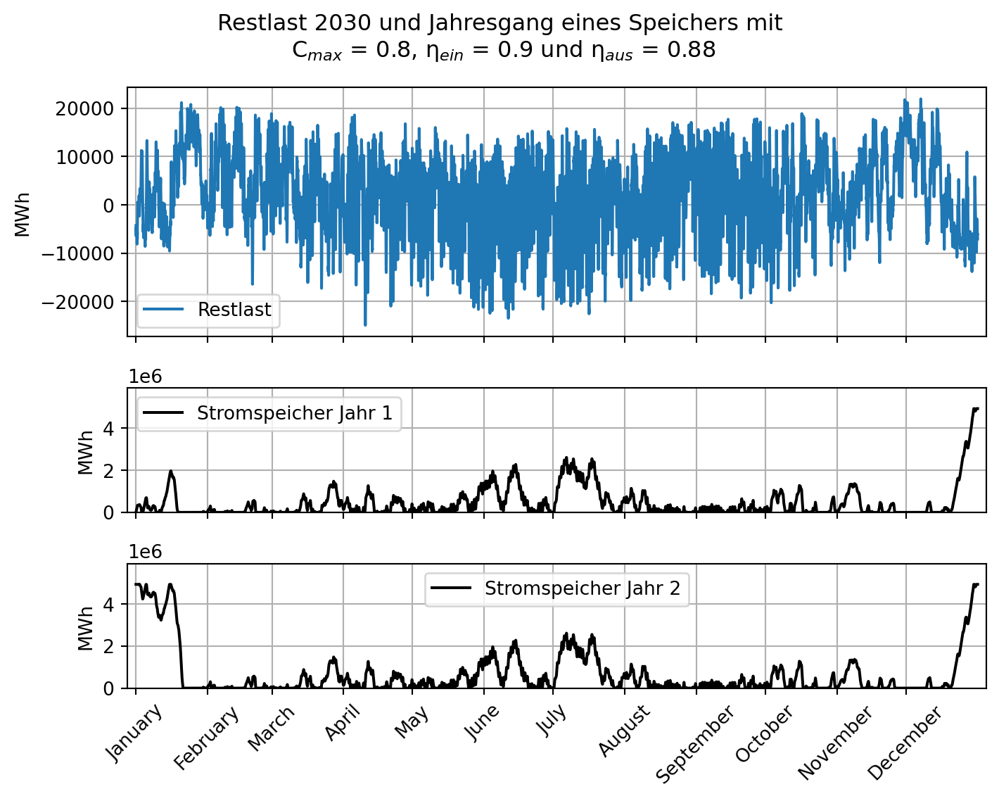

Zyklenzahl Jahr 1: 14.92
Zyklenzahl Jahr 2: 15.29
Summe Netzlast: 658,000,000.00
Summe positive Restlast: 175,897,072.30	Summe negative Restlast: -85,250,478.82
Speichergröße 1: 6,170,038.04	Anteil EE ohne Speicher: 0.73

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.0             0.83             0.84
1                     0.8             0.83             0.83

Die Speichergröße beträgt 4,936,030.4 MWh
Dies entspricht 132.0 Pumpspeicheräquivalenten.


In [82]:
#| echo: false
#| fig-alt: "In der Grafik ist zum einen die Restlast für das Jahr 2030 dargestellt. Diese ist überwiegend negativ, aber starken und vor allem sehr häufiger Schwankungen unterworfen. Zum anderen sind die Jahresgänge in Jahr 1 und Jahr 2 des Speichers mit einer Kapazität von 80 Prozent der maximal benötigten Speicherkapazität, einem Einspeicherwirkungsgrad von 0.9 und einem Ausspeicherwirkungsgrad von 0.88 dargestellt. In Jahr 1 geht der Speicher an das Netz und lädt kontinuierlich, bis dieser Mitte Januar voll ist. Bis Mitte März entleert sich der Speicher häufiger stark bis vollständig. Danach ist der Speicher über den Sommer bis Anfang Dezember  vollständig oder nahezu vollständig geladen. In der ersten Dezemberhälfte entleert sich der Speicher für längere Zeit stark und zwei mal komplett. Ende Dezember wird jedoch wieder die volle Ladung erreicht. Mit dieser geht der Speicher in Jahr 2, das ansonsten dem ersten Jahr gleicht."

# Daten generieren
## Speichergröße bestimmen und 80 Prozent berechnen
speichergröße_2030_80 = berechne_speichergröße(restlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False) * 0.8

## Jahresgang des Speichers bestimmen
speicher_2030_80_wirkungsgrad_90_88 = jahresgang_speicher_berechnen(restlast_2030, speichergröße = speichergröße_2030_80, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)

jahresgang_speicher_jahr1 = speicher_2030_80_wirkungsgrad_90_88[1]
jahresgang_speicher_jahr2 = speicher_2030_80_wirkungsgrad_90_88[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2030 und Jahresgang eines Speichers mit\n C$_{max}$ = 0.8, η$_{ein}$ = 0.9 und η$_{aus}$ = 0.88')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.2))

## plot restlast
ax1.plot(restlast_2030, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

# Zyklenzahl berechnen, Übergabe von Tupel = Wirkungsgrade werden nicht benötigt
zyklenzahl_berechnen(speicher_2030_80_wirkungsgrad_90_88, output = True)

# Anteil EE berechnen
anteil_ee_berechnen(restlast_2030, netzlast = netzlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.8], output = True)

# Speichergröße ausgeben
print(f"\nDie Speichergröße beträgt {speicher_2030_80_wirkungsgrad_90_88[0]:,.1f} MWh\n"
      f"Dies entspricht {speicher_2030_80_wirkungsgrad_90_88[0] / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")

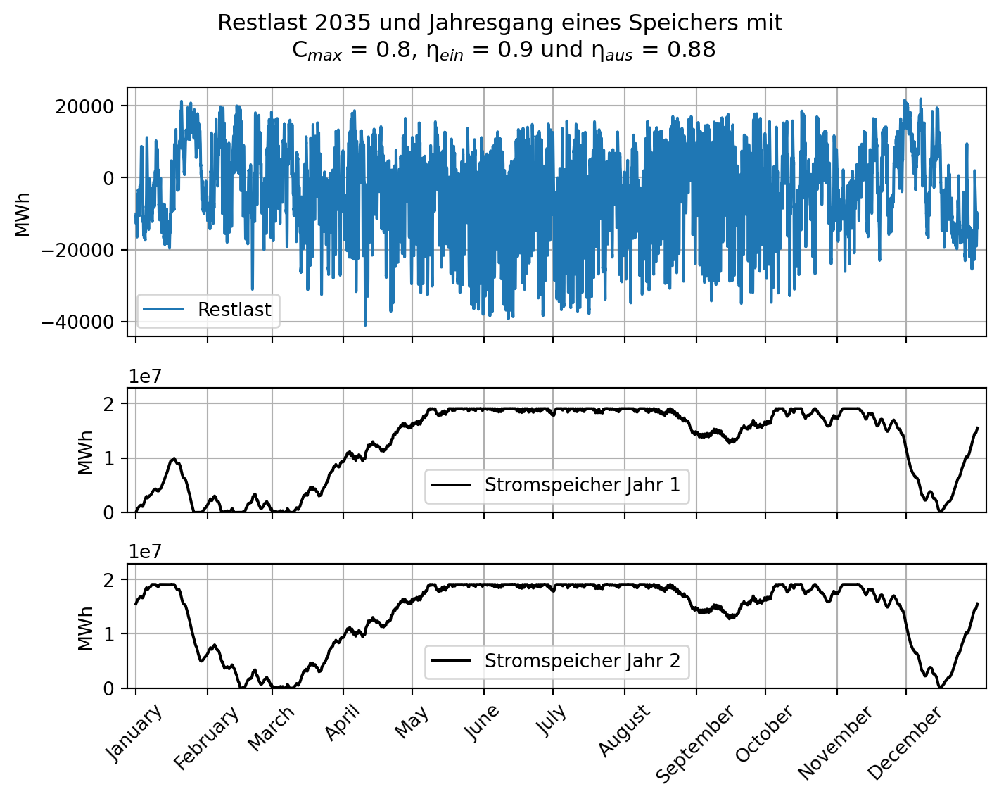

Zyklenzahl Jahr 1: 7.17
Zyklenzahl Jahr 2: 7.24
Summe Netzlast: 670,400,000.00
Summe positive Restlast: 125,949,558.61	Summe negative Restlast: -221,510,407.41
Speichergröße 1: 23,829,823.85	Anteil EE ohne Speicher: 0.81

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.0             0.98             1.00
1                     0.8             0.98             0.99

Die Speichergröße beträgt 19,063,859.1 MWh
Dies entspricht 509.7 Pumpspeicheräquivalenten.


In [83]:
#| echo: false
#| fig-alt: "In der Grafik ist zum einen die Restlast für das Jahr 2035 dargestellt. Diese ist überwiegend negativ, und trotz starker und vor allem sehr häufiger Schwankungen nur selten positiv. Zum anderen sind die Jahresgänge in Jahr 1 und Jahr 2 des Speichers mit einer Kapazität von 80 Prozent der maximal benötigten Speicherkapazität, einem Einspeicherwirkungsgrad von 0.9 und einem Ausspeicherwirkungsgrad von 0.88 dargestellt. In Jahr 1 geht der Speicher an das Netz und lädt kontinuierlich, bis dieser nach wenigen Tagen voll ist. Von Mitte bis Ende Januar entleert sich der Speicher stark bis zur vollständigen Entladung. Von Anfang Februar bis Anfang Dezember ist der Speicher nahezu vollständig geladen. In der ersten Dezemberhälfte entleert sich der Speicher stark, ist aber nur kurz leer. Ende Dezember wird jedoch wieder die volle Ladung erreicht. Mit dieser geht der Speicher in Jahr 2, das ansonsten dem ersten Jahr gleicht."

# Daten generieren
## Speichergröße bestimmen und 80 Prozent berechnen
speichergröße_2035_80 = berechne_speichergröße(restlast_2035, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False) * 0.8

## Jahresgang des Speichers bestimmen
speicher_2035_80_wirkungsgrad_90_88 = jahresgang_speicher_berechnen(restlast_2035, speichergröße = speichergröße_2035_80, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)

jahresgang_speicher_jahr1 = speicher_2035_80_wirkungsgrad_90_88[1]
jahresgang_speicher_jahr2 = speicher_2035_80_wirkungsgrad_90_88[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2035 und Jahresgang eines Speichers mit\n C$_{max}$ = 0.8, η$_{ein}$ = 0.9 und η$_{aus}$ = 0.88')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.2))

## plot restlast
ax1.plot(restlast_2035, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

# Zyklenzahl berechnen, Übergabe von Tupel = Wirkungsgrade werden nicht benötigt
zyklenzahl_berechnen(speicher_2035_80_wirkungsgrad_90_88, output = True)

# Anteil EE berechnen
anteil_ee_berechnen(restlast_2035, netzlast = netzlast_2035, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.8], output = True)

# Speichergröße ausgeben
print(f"\nDie Speichergröße beträgt {speicher_2035_80_wirkungsgrad_90_88[0]:,.1f} MWh\n"
      f"Dies entspricht {speicher_2035_80_wirkungsgrad_90_88[0] / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")

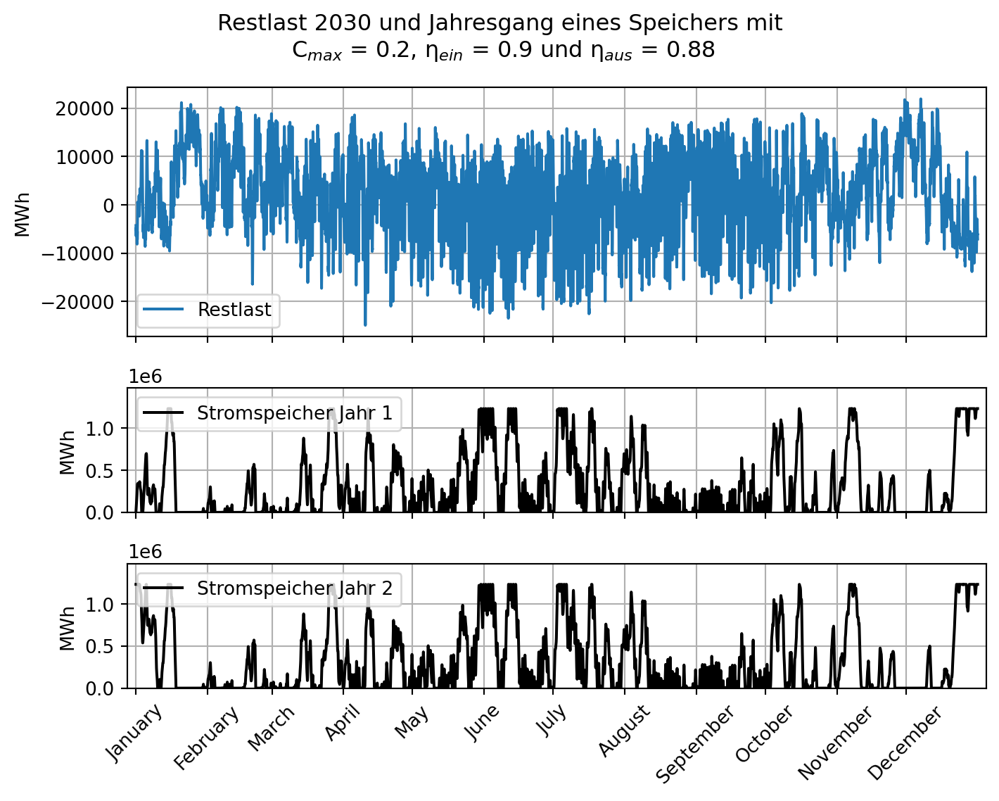

Zyklenzahl Jahr 1: 54.56
Zyklenzahl Jahr 2: 54.76
Summe Netzlast: 658,000,000.00
Summe positive Restlast: 175,897,072.30	Summe negative Restlast: -85,250,478.82
Speichergröße 1: 6,170,038.04	Anteil EE ohne Speicher: 0.73

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.0             0.83             0.84
1                     0.2             0.82             0.82

Die Speichergröße beträgt 1,234,007.6 MWh
Dies entspricht 33.0 Pumpspeicheräquivalenten.


In [84]:
#| echo: false
#| fig-alt: "In der Grafik ist zum einen die Restlast für das Jahr 2030 dargestellt. Diese entspricht dem vorherigen Szenario. Zum anderen sind die Jahresgänge in Jahr 1 und Jahr 2 des Speichers mit einer Kapazität von 20 Prozent der maximal benötigten Speicherkapazität, einem Einspeicherwirkungsgrad von 0.9 und einem Ausspeicherwirkungsgrad von 0.88 dargestellt. In Jahr 1 geht der Speicher an das Netz und lädt kontinuierlich, bis dieser nach wenigen Tagen voll ist. Von Mitte Januar bis Mitte März entleert sich der Speicher 4 mal stark bis zur vollständigen Entladung. Von Mitte März bis Mitte August ist der Speicher nahezu vollständig geladen. Anschließend folgt eine einmonatige Phase der starken und kurzzeitig vollständigen Entladung. Von Mitte September bis Anfang Dezember sind ausgeprägte Lade- und Entladezyklen zu beobachten. Anfang Dezember ist der Speicher für mehrere Tage leer, erreicht danach kurzzeitig einen hohen Ladestand, um sich erneut vollständig zu entleeren. In der zweiten Dezemberhälfte wird jedoch wieder die volle Ladung erreicht. Mit dieser geht der Speicher in Jahr 2, das ansonsten dem ersten Jahr gleicht."

# Daten generieren
## Speichergröße bestimmen und 20 Prozent berechnen
speichergröße_2030_20 = berechne_speichergröße(restlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False) * 0.2

## Jahresgang des Speichers bestimmen
speicher_2030_20_wirkungsgrad_90_88 = jahresgang_speicher_berechnen(restlast_2030, speichergröße = speichergröße_2030_20, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)

jahresgang_speicher_jahr1 = speicher_2030_20_wirkungsgrad_90_88[1]
jahresgang_speicher_jahr2 = speicher_2030_20_wirkungsgrad_90_88[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2030 und Jahresgang eines Speichers mit\n C$_{max}$ = 0.2, η$_{ein}$ = 0.9 und η$_{aus}$ = 0.88')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.2))

## plot restlast
ax1.plot(restlast_2030, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

# Zyklenzahl berechnen, Übergabe von Tupel = Wirkungsgrade werden nicht benötigt
zyklenzahl_berechnen(speicher_2030_20_wirkungsgrad_90_88, output = True)

# Anteil EE berechnen
anteil_ee_berechnen(restlast_2030, netzlast = netzlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.2], output = True)

# Speichergröße ausgeben
print(f"\nDie Speichergröße beträgt {speicher_2030_20_wirkungsgrad_90_88[0]:,.1f} MWh\n"
      f"Dies entspricht {speicher_2030_20_wirkungsgrad_90_88[0] / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")

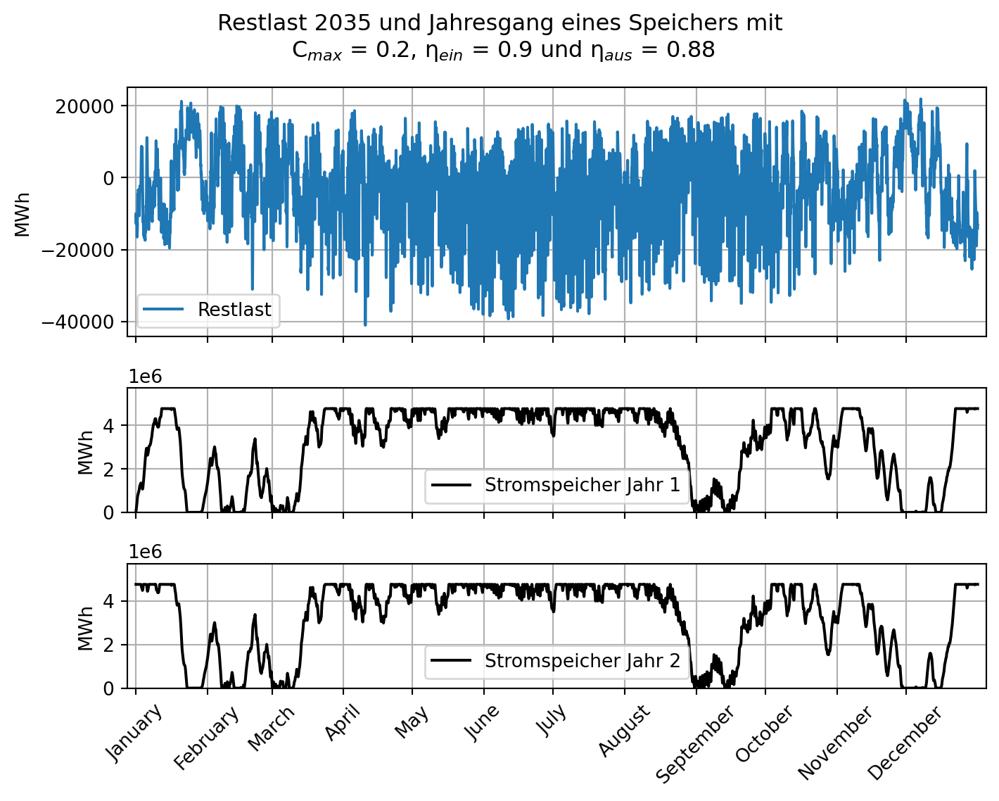

Zyklenzahl Jahr 1: 23.15
Zyklenzahl Jahr 2: 22.65
Summe Netzlast: 670,400,000.00
Summe positive Restlast: 125,949,558.61	Summe negative Restlast: -221,510,407.41
Speichergröße 1: 23,829,823.85	Anteil EE ohne Speicher: 0.81

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.0             0.98             1.00
1                     0.2             0.95             0.95

Die Speichergröße beträgt 4,765,964.8 MWh
Dies entspricht 127.4 Pumpspeicheräquivalenten.


In [85]:
#| echo: false
#| fig-alt: "In der Grafik ist zum einen die Restlast für das Jahr 2035 dargestellt. Diese entspricht dem vorherigen Szenario. Zum anderen sind die Jahresgänge in Jahr 1 und Jahr 2 des Speichers mit einer Kapazität von 20 Prozent der maximal benötigten Speicherkapazität, einem Einspeicherwirkungsgrad von 0.9 und einem Ausspeicherwirkungsgrad von 0.88 dargestellt. Die Jahresgänge gleichen denen im Jahr 2030. Allerdings sind die Phasen der starken Entleerung zu Beginn des Jahres deutlich verkürzt, der Speicher erreicht zumeist nach kurzer Zeit wieder den vollen Ladestand. Die starke Entladung Ende August erfolgt nicht, der Speicher sinkt hier nur auf etwa den halben Ladestand. Auch die starke Ausspeicherung Anfang Dezember ist weniger drastisch, erfolgt dennoch mehrfach vollständig."

# Daten generieren
## Speichergröße bestimmen und 20 Prozent berechnen
speichergröße_2035_20 = berechne_speichergröße(restlast_2035, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False) * 0.2

## Jahresgang des Speichers bestimmen
speicher_2035_20_wirkungsgrad_90_88 = jahresgang_speicher_berechnen(restlast_2035, speichergröße = speichergröße_2035_20, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)

jahresgang_speicher_jahr1 = speicher_2035_20_wirkungsgrad_90_88[1]
jahresgang_speicher_jahr2 = speicher_2035_20_wirkungsgrad_90_88[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2035 und Jahresgang eines Speichers mit\n C$_{max}$ = 0.2, η$_{ein}$ = 0.9 und η$_{aus}$ = 0.88')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.2))

## plot restlast
ax1.plot(restlast_2035, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

# Zyklenzahl berechnen, Übergabe von Tupel = Wirkungsgrade werden nicht benötigt
zyklenzahl_berechnen(speicher_2035_20_wirkungsgrad_90_88, output = True)

# Anteil EE berechnen
anteil_ee_berechnen(restlast_2035, netzlast = netzlast_2035, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.2], output = True)

# Speichergröße ausgeben
print(f"\nDie Speichergröße beträgt {speicher_2035_20_wirkungsgrad_90_88[0]:,.1f} MWh\n"
      f"Dies entspricht {speicher_2035_20_wirkungsgrad_90_88[0] / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")

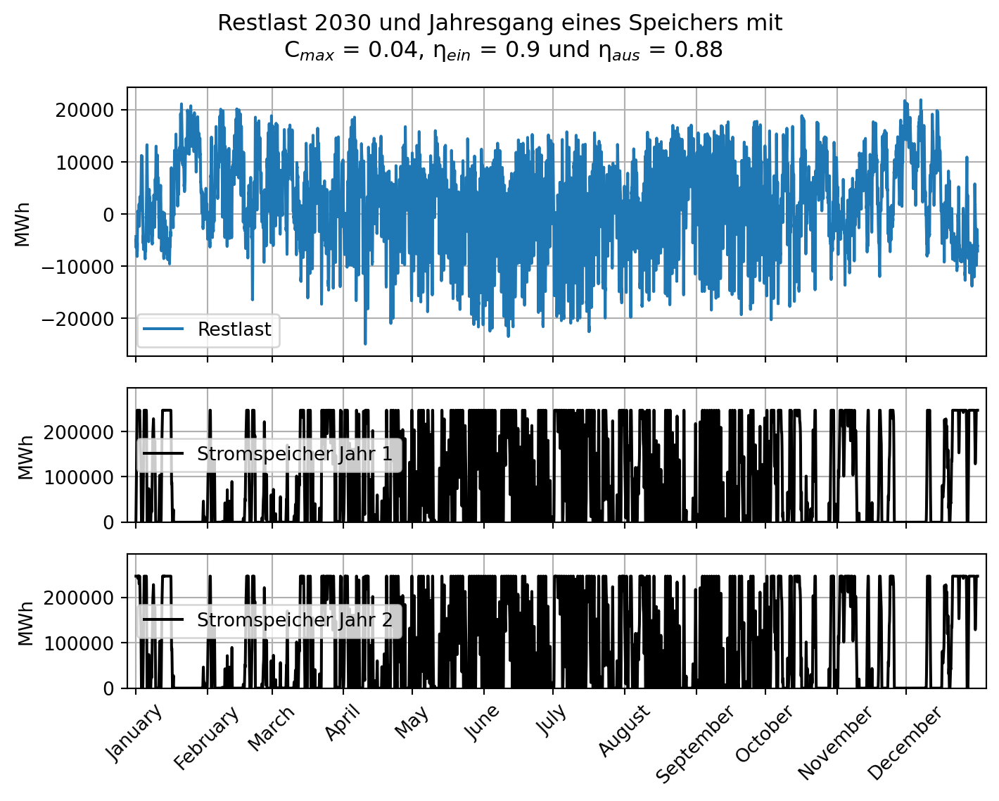

Zyklenzahl Jahr 1: 172.79
Zyklenzahl Jahr 2: 172.29
Summe Netzlast: 658,000,000.00
Summe positive Restlast: 175,897,072.30	Summe negative Restlast: -85,250,478.82
Speichergröße 1: 6,170,038.04	Anteil EE ohne Speicher: 0.73

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                    1.00             0.83             0.84
1                    0.04             0.79             0.79

Die Speichergröße beträgt 246,801.5 MWh
Dies entspricht 6.6 Pumpspeicheräquivalenten.


In [86]:
#| echo: false
#| fig-alt: "In der Grafik ist zum einen die Restlast für das Jahr 2030 dargestellt. Diese entspricht dem vorherigen Szenario. Zum anderen sind die Jahresgänge in Jahr 1 und Jahr 2 des Speichers mit einer Kapazität von 4 Prozent der maximal benötigten Speicherkapazität, einem Einspeicherwirkungsgrad von 0.9 und einem Ausspeicherwirkungsgrad von 0.88 dargestellt. Über das gesamte Jahr finden kurz aufeinanderfolgende Zyklen der vollständigen Ladung und Entladung statt. Nur Anfang Januar und Ende Dezember ist der Speicher für je ca. 2 Wochen voll."

# Daten generieren
## Speichergröße bestimmen und 4 Prozent berechnen
speichergröße_2030_04 = berechne_speichergröße(restlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False) * 0.04

## Jahresgang des Speichers bestimmen
speicher_2030_04_wirkungsgrad_90_88 = jahresgang_speicher_berechnen(restlast_2030, speichergröße = speichergröße_2030_04, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)

jahresgang_speicher_jahr1 = speicher_2030_04_wirkungsgrad_90_88[1]
jahresgang_speicher_jahr2 = speicher_2030_04_wirkungsgrad_90_88[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2030 und Jahresgang eines Speichers mit\n C$_{max}$ = 0.04, η$_{ein}$ = 0.9 und η$_{aus}$ = 0.88')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.2))

## plot restlast
ax1.plot(restlast_2030, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

# Zyklenzahl berechnen, Übergabe von Tupel = Wirkungsgrade werden nicht benötigt
zyklenzahl_berechnen(speicher_2030_04_wirkungsgrad_90_88, output = True)

# Anteil EE berechnen
anteil_ee_berechnen(restlast_2030, netzlast = netzlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.04], output = True)

# Speichergröße ausgeben
print(f"\nDie Speichergröße beträgt {speicher_2030_04_wirkungsgrad_90_88[0]:,.1f} MWh\n"
      f"Dies entspricht {speicher_2030_04_wirkungsgrad_90_88[0] / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")

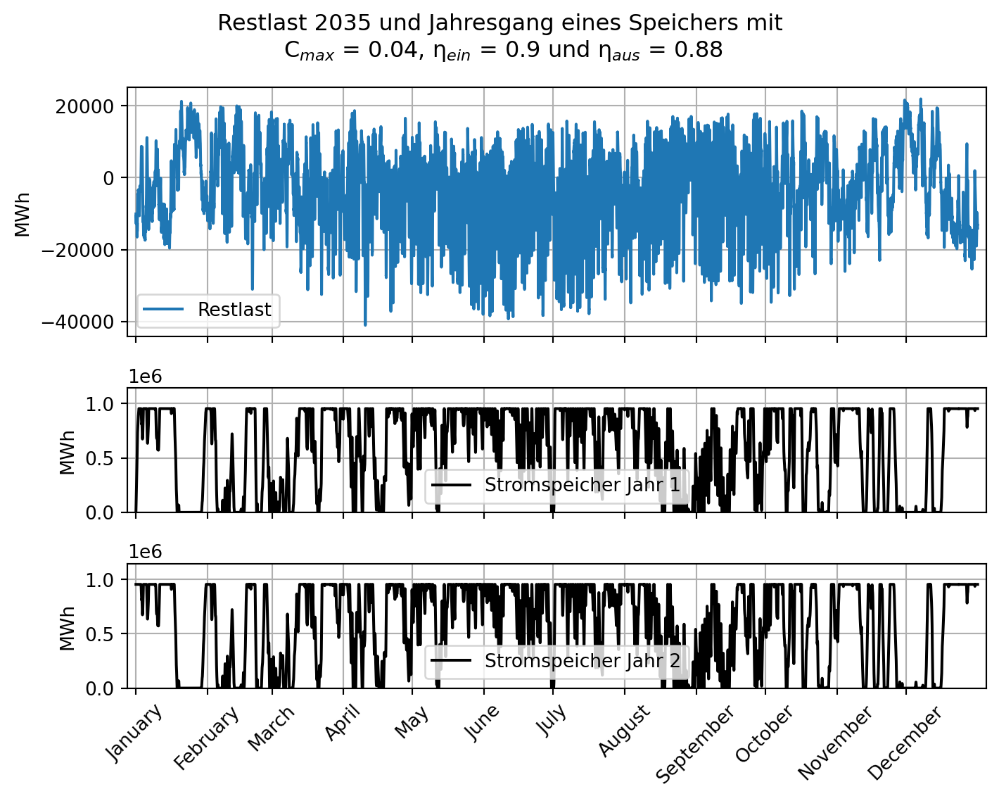

Zyklenzahl Jahr 1: 85.86
Zyklenzahl Jahr 2: 85.36
Summe Netzlast: 670,400,000.00
Summe positive Restlast: 125,949,558.61	Summe negative Restlast: -221,510,407.41
Speichergröße 1: 23,829,823.85	Anteil EE ohne Speicher: 0.81

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                    1.00             0.98             1.00
1                    0.04             0.92             0.92

Die Speichergröße beträgt 953,193.0 MWh
Dies entspricht 25.5 Pumpspeicheräquivalenten.


In [87]:
#| echo: false
#| fig-alt: "In der Grafik ist zum einen die Restlast für das Jahr 2035 dargestellt. Diese entspricht dem vorherigen Szenario. Zum anderen sind die Jahresgänge in Jahr 1 und Jahr 2 des Speichers mit einer Kapazität von 4 Prozent der maximal benötigten Speicherkapazität, einem Einspeicherwirkungsgrad von 0.9 und einem Ausspeicherwirkungsgrad von 0.88 dargestellt. Über das gesamte Jahr finden kurz aufeinanderfolgende Zyklen der vollständigen Ladung und Entladung statt. Nur Anfang Januar und Ende Dezember ist der Speicher für je ca. 2 Wochen voll. Während des Sommers ist die Zyklendichte noch höher als im Jahr 2030."

# Daten generieren
## Speichergröße bestimmen und 4 Prozent berechnen
speichergröße_2035_04 = berechne_speichergröße(restlast_2035, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False) * 0.04

## Jahresgang des Speichers bestimmen
speicher_2035_04_wirkungsgrad_90_88 = jahresgang_speicher_berechnen(restlast_2035, speichergröße = speichergröße_2035_04, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)

jahresgang_speicher_jahr1 = speicher_2035_04_wirkungsgrad_90_88[1]
jahresgang_speicher_jahr2 = speicher_2035_04_wirkungsgrad_90_88[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2035 und Jahresgang eines Speichers mit\n C$_{max}$ = 0.04, η$_{ein}$ = 0.9 und η$_{aus}$ = 0.88')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.2))

## plot restlast
ax1.plot(restlast_2035, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

# Zyklenzahl berechnen, Übergabe von Tupel = Wirkungsgrade werden nicht benötigt
zyklenzahl_berechnen(speicher_2035_04_wirkungsgrad_90_88, output = True)

# Anteil EE berechnen
anteil_ee_berechnen(restlast_2035, netzlast = netzlast_2035, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.04], output = True)

# Speichergröße ausgeben
print(f"\nDie Speichergröße beträgt {speicher_2035_04_wirkungsgrad_90_88[0]:,.1f} MWh\n"
      f"Dies entspricht {speicher_2035_04_wirkungsgrad_90_88[0] / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")

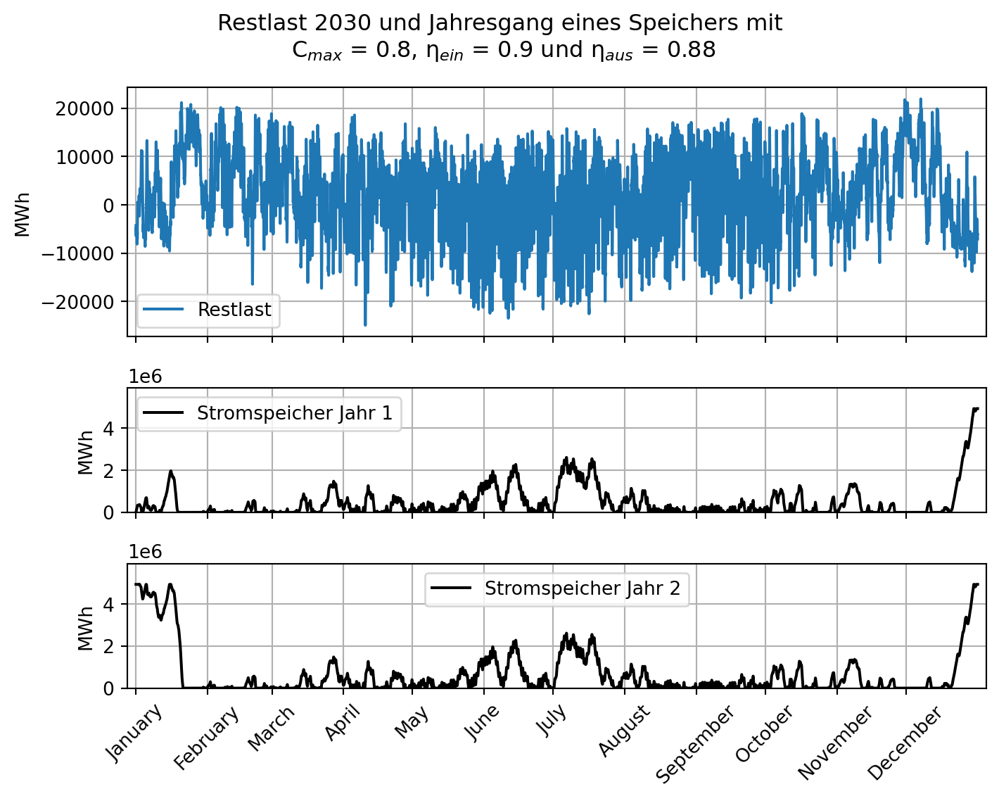

Zyklenzahl Jahr 1: 14.92
Zyklenzahl Jahr 2: 15.29
Summe Netzlast: 658,000,000.00
Summe positive Restlast: 175,897,072.30	Summe negative Restlast: -85,250,478.82
Speichergröße 1: 6,170,038.04	Anteil EE ohne Speicher: 0.73

   relative Speichergröße  Anteil EE Jahr1  Anteil EE Jahr2
0                     1.0             0.83             0.84
1                     0.8             0.83             0.83

Die Speichergröße beträgt 4,936,030.4 MWh
Dies entspricht 132.0 Pumpspeicheräquivalenten.


In [88]:
#| output: false

# Daten generieren
## Speichergröße bestimmen und 80 Prozent berechnen
speichergröße_2030_80 = berechne_speichergröße(restlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False) * 0.8

## Jahresgang des Speichers bestimmen
speicher_2030_80_wirkungsgrad_90_88 = jahresgang_speicher_berechnen(restlast_2030, speichergröße = speichergröße_2030_80, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, output = False)

jahresgang_speicher_jahr1 = speicher_2030_80_wirkungsgrad_90_88[1]
jahresgang_speicher_jahr2 = speicher_2030_80_wirkungsgrad_90_88[2]

# xticks erzeugen
monate_index = erzeugung[~erzeugung["Datum von"].dt.month.duplicated()].index
monatsnamen = erzeugung["Datum von"].iloc[monate_index].dt.strftime("%B") 

# Grafik mit drei subplots erzeugen
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (7.5, 6), height_ratios = [2, 1, 1], sharex = True, layout = 'tight')
plt.suptitle('Restlast 2030 und Jahresgang eines Speichers mit\n C$_{max}$ = 0.8, η$_{ein}$ = 0.9 und η$_{aus}$ = 0.88')
plt.xticks(monate_index, monatsnamen, rotation = 45);
plt.minorticks_off()
plt.setp([ax1, ax2, ax3], xlim = (restlast.index.min() - len(restlast.index) / 100, restlast.index.max() * 1.01))
plt.setp([ax2, ax3], ylim = (0, max(max(jahresgang_speicher_jahr1), max(jahresgang_speicher_jahr2)) * 1.2))

## plot restlast
ax1.plot(restlast_2030, label = "Restlast")
ax1.grid()
ax1.set_ylabel('MWh')
ax1.legend()

## plot jahresgang_speicher_jahr1
ax2.plot(jahresgang_speicher_jahr1, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 1')
ax2.grid()
ax2.set_ylabel('MWh')
ax2.legend()

## plot jahresgang_speicher_jahr2
ax3.plot(jahresgang_speicher_jahr2, color = 'black', linestyle = '-', label = 'Stromspeicher Jahr 2')
ax3.tick_params(axis = 'x', rotation = 45)
ax3.set_ylabel('MWh')
ax3.grid()
ax3.legend()

plt.show()

# Zyklenzahl berechnen, Übergabe von Tupel = Wirkungsgrade werden nicht benötigt
zyklenzahl_berechnen(speicher_2030_80_wirkungsgrad_90_88, output = True)

# Anteil EE berechnen
anteil_ee_berechnen(restlast_2030, netzlast = netzlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.8], output = True)

# Speichergröße ausgeben
print(f"\nDie Speichergröße beträgt {speicher_2030_80_wirkungsgrad_90_88[0]:,.1f} MWh\n"
      f"Dies entspricht {speicher_2030_80_wirkungsgrad_90_88[0] / pumpspeicherkapazität_MWh:,.1f} Pumpspeicheräquivalenten.")

In [89]:
spitzenleistung_2030 = anteil_ee_berechnen(restlast_2030, netzlast = netzlast_2030, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.2, 0.04], output = False)
spitzenleistung_2035 = anteil_ee_berechnen(restlast_2035, netzlast = netzlast_2035, einspeicherwirkungsgrad = 0.9, ausspeicherwirkungsgrad = 0.88, neue_speichergrößen = [0.2, 0.04], output = False)

## Datenstruktur angucken
## In Spalte 0 ist Speichergröße = 1, in den folgenden Spalten die neuen Speichergrößen gespeichert. Zeile 0 enthält die Restlastkurve in Jahr 1, Zeile 1 die Restlastkurve in Jahr 2
# print(spitzenleistung_2030.shape)
# print(spitzenleistung_2030.head())

# Zeile 1 enthält den Jahresgang in Jahr 2
# Spalte 0 enthält das Basisszenario Speichergröße = 1
print(f"\nSpitzenleistung 2030 für Cmax = 0.20: {max(spitzenleistung_2030.iloc[1, 1]) * 4 / 1000:.2f} GW\n"
      f"Spitzenleistung 2030 für Cmax = 0.04: {max(spitzenleistung_2030.iloc[1, 2]) * 4 / 1000:.2f} GW\n"
      f"Spitzenleistung 2035 für Cmax = 0.20: {max(spitzenleistung_2035.iloc[1, 1]) * 4 / 1000:.2f} GW\n"
      f"Spitzenleistung 2035 für Cmax = 0.04: {max(spitzenleistung_2035.iloc[1 , 2]) * 4 / 1000:.2f} GW")


Spitzenleistung 2030 für Cmax = 0.20: 87.64 GW
Spitzenleistung 2030 für Cmax = 0.04: 87.64 GW
Spitzenleistung 2035 für Cmax = 0.20: 87.53 GW
Spitzenleistung 2035 für Cmax = 0.04: 87.53 GW
